# Reading of the Data

In [1]:
# === Single Cell: Imports, Helper Functions, and Test Reading of Bag ===

import os
import sys
import math
import struct
import argparse  # Not strictly necessary in Jupyter, included for script-style parity
from pathlib import Path

import numpy as np

# ROS 2 bag reading
import rosbag2_py
from rclpy.serialization import deserialize_message

# ROS message types
from sensor_msgs.msg import PointCloud2, Image, CameraInfo
from geometry_msgs.msg import TransformStamped, PoseStamped, Twist
from tf2_msgs.msg import TFMessage
from nav_msgs.msg import Odometry
from std_msgs.msg import Bool, String, Float32

# (Optional) OpenCV for image I/O
import cv2

# Matplotlib for plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa

##############################################################################
# 1) Topic->Type Map
##############################################################################
# Adjust the entries to match the actual topics in your bag. 
# If a topic is missing or uses a different message type, you may get a deserialization error.
topic_type_map = {
    "/resulting_rgb": Image,
    "/resulting_depth_image": Image,
    "/camera_manipulator/camera_info": CameraInfo,
    "/merged_cloud": PointCloud2,
    "/tf": TFMessage,
    "/tf_static": TFMessage,
    "/odom": Odometry,
    "/ghost_pose_feedback": PoseStamped,
    "/cmd_vel": Twist,
    "/goal_selected": Bool,
    "/scan_trigger": Bool,
    "/rtf": Float32,
    "/resulting_depth": PointCloud2,
    # Add/modify as needed for your bag
}

##############################################################################
# 2) Helper: guess_msg_type()
##############################################################################
def guess_msg_type(topic_name: str):
    """
    Looks up the topic in the topic_type_map. If not found, fallback to Bool or skip.
    Adjust as you prefer.
    """
    return topic_type_map.get(topic_name, Bool)

##############################################################################
# 3) Helper: Read entire bag in a dictionary
##############################################################################
def read_bag_into_dict(bag_path):
    """
    Reads the bag in one pass, storing messages in a dict:
       all_data[topic_name] = [ (t_s, msg), (t_s, msg), ... ]
    Where t_s is the time in seconds. 
    """
    if not os.path.exists(bag_path):
        print(f"[ERROR] Bag file does not exist: {bag_path}")
        return {}

    storage_opts = rosbag2_py.StorageOptions(uri=bag_path, storage_id='sqlite3')
    converter_opts = rosbag2_py.ConverterOptions('cdr','cdr')
    reader = rosbag2_py.SequentialReader()
    reader.open(storage_opts, converter_opts)

    data_dict = {}

    while reader.has_next():
        (topic_name, rawdata, t_nanos) = reader.read_next()
        t_s = float(t_nanos)*1e-9  # convert nanoseconds to seconds
        msg_type = guess_msg_type(topic_name)
        msg = deserialize_message(rawdata, msg_type)
        if topic_name not in data_dict:
            data_dict[topic_name] = []
        data_dict[topic_name].append((t_s, msg))

    # Sort each topic's messages by time
    # for tpc in data_dict:
    #     data_dict[tpc].sort(key=lambda x: x[0])

    return data_dict

##############################################################################
# 4) PointCloud2 -> (x,y,z) converter from your example
##############################################################################
def pointcloud2_to_xyz_array(pc_msg: PointCloud2):
    """
    Convert a sensor_msgs/PointCloud2 (with float32 x,y,z) into a list of (x,y,z).
    """
    if len(pc_msg.fields) < 3:
        print("[WARN] This PointCloud2 has fewer than 3 fields; cannot parse x,y,z.")
        return []
    field_map = {f.name: f for f in pc_msg.fields}
    for must in ["x","y","z"]:
        if must not in field_map:
            print(f"[WARN] Missing {must} in fields => cannot parse.")
            return []

    x_off = field_map["x"].offset
    y_off = field_map["y"].offset
    z_off = field_map["z"].offset
    step  = pc_msg.point_step

    points = []
    data_buffer = pc_msg.data
    count = len(data_buffer) // step
    for i in range(count):
        idx = i*step
        x_val = struct.unpack_from('f', data_buffer, idx + x_off)[0]
        y_val = struct.unpack_from('f', data_buffer, idx + y_off)[0]
        z_val = struct.unpack_from('f', data_buffer, idx + z_off)[0]
        points.append((x_val, y_val, z_val))
    return points

##############################################################################
# 5) Minimal Image -> NumPy array converter (if you don't use cv_bridge)
##############################################################################
def simple_imgmsg_to_cv2(img_msg: Image, desired_encoding="passthrough"):
    """
    Minimal converter for sensor_msgs/Image -> NumPy array. 
    Use this if you don't rely on cv_bridge.
    """
    import numpy as np

    height = img_msg.height
    width  = img_msg.width
    enc = img_msg.encoding.lower()

    if enc in ["rgb8","bgr8","mono8"]:
        dtype = np.uint8
    elif enc in ["mono16","16uc1"]:
        dtype = np.uint16
    elif enc in ["32fc1"]:
        dtype = np.float32
    else:
        print(f"[WARN] Unhandled encoding '{img_msg.encoding}', defaulting to float32.")
        dtype = np.float32

    arr = np.frombuffer(img_msg.data, dtype=dtype)
    if len(arr) == 0:
        print("[WARN] Image message has no data buffer.")
        return None

    arr = arr.reshape((height, width, -1))
    if arr.shape[2] == 1:
        arr = arr[:,:,0]  # drop channel dimension if single
    return arr

##############################################################################
# 6) Finally: specify bag path, read data, and do a quick verification
##############################################################################

# bag_path = "/home/cesar514/workspaces/isaac_ws/first_testing/experiment_5_subtrial_3/experiment_5_subtrial_3_0.db3"
# bag_path = "/home/cesar514/workspaces/isaac_ws/first_testing/experiment_5_subtrial_4/experiment_5_subtrial_4_0.db3"
# bag_path = "/home/cesar514/workspaces/isaac_ws/first_testing/experiment_3_subtrial_5/experiment_3_subtrial_5_0.db3"

# === Trial selection & derived paths ===
EXPERIMENT_ID = 6    # <-- set experiment number here
SUBTRIAL_ID   = 1    # <-- set subtrial number here

NOTEBOOK_DIR = Path.cwd()
if NOTEBOOK_DIR.name == 'notebooks':
    REPO_ROOT = NOTEBOOK_DIR.parents[2]
else:
    REPO_ROOT = NOTEBOOK_DIR

DATA_ROOT   = (REPO_ROOT / 'data').resolve()
TRIAL_DIR   = DATA_ROOT / f'experiment_{EXPERIMENT_ID}_subtrial_{SUBTRIAL_ID}'
OUTPUT_DIR  = TRIAL_DIR / 'guider_manipulation_notebook'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Preferred bag name pattern → experiment_i_subtrial_j_0.db3
def _resolve_bag_path(trial_dir: Path) -> Path:
    preferred = trial_dir / f"experiment_{EXPERIMENT_ID}_subtrial_{SUBTRIAL_ID}_0.db3"
    if preferred.exists():
        return preferred
    candidates = sorted(trial_dir.glob('*.db3'))
    if not candidates:
        raise FileNotFoundError(f'No .db3 bag found under {trial_dir}')
    return candidates[0]

bag_path = str(_resolve_bag_path(TRIAL_DIR))
name = str((OUTPUT_DIR / f"experiment_{EXPERIMENT_ID}_subtrial_{SUBTRIAL_ID}_"))

print(f"[INFO] Experiment {EXPERIMENT_ID}, subtrial {SUBTRIAL_ID}")
print(f"[INFO] Using bag      → {bag_path}")
print(f"[INFO] Saving outputs → {OUTPUT_DIR}")

all_data = read_bag_into_dict(bag_path)
print(f"[INFO] Successfully read {len(all_data)} distinct topics from the bag.")

# Print topics, message counts
for topic, msgs in all_data.items():
    print(f"  Topic: {topic} => {len(msgs)} messages")

# If you want to do a quick check for e.g. /resulting_rgb:
if "/resulting_rgb" in all_data:
    rgb_count = len(all_data["/resulting_rgb"])
    print(f"[INFO] Found {rgb_count} messages on /resulting_rgb")
else:
    print("[INFO] No /resulting_rgb found in this bag.")

print("\nAll imports and data reading are done in this cell. Ready for next steps!")


[INFO] Experiment 6, subtrial 1
[INFO] Using bag      → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/experiment_6_subtrial_1_0.db3
[INFO] Saving outputs → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook


[INFO] [1760809826.737785632] [rosbag2_storage]: Opened database '/home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/experiment_6_subtrial_1_0.db3' for READ_ONLY.


[INFO] Successfully read 18 distinct topics from the bag.
  Topic: /clock => 2849 messages
  Topic: /camera_manipulator/camera_info => 712 messages
  Topic: /joy => 2160 messages
  Topic: /joint_states => 2848 messages
  Topic: /tf_static => 3 messages
  Topic: /tf => 11733 messages
  Topic: /odom => 2847 messages
  Topic: /pc_concatenated => 945 messages
  Topic: /map => 1 messages
  Topic: /cmd_vel => 609 messages
  Topic: /hold_enabled => 15 messages
  Topic: /ghost_deltas => 153 messages
  Topic: /scan_trigger => 3 messages
  Topic: /resulting_rgb => 2 messages
  Topic: /resulting_depth_image => 2 messages
  Topic: /merged_cloud => 1 messages
  Topic: /goal_selected => 2 messages
  Topic: /gripper_cmd => 1 messages
[INFO] Found 2 messages on /resulting_rgb

All imports and data reading are done in this cell. Ready for next steps!


# STEP 1 - Displays or not the images

In [2]:
# === Cell: helper to display + SAVE first RGB/depth ===

def process_data(all_data,
                 name_prefix,          # e.g. "experiment_3_subtrial_4_"
                 show_images=True):
    """
    Extract first /resulting_rgb and /resulting_depth_image frames,
    optionally display them, and SAVE the RGB frame as
        {name_prefix}original.png
    in the notebook’s working directory.
    """
    # 1) Pull message lists
    rgb_data   = all_data.get("/resulting_rgb", [])
    depth_data = all_data.get("/resulting_depth_image", [])

    if not rgb_data:
        print("[INFO] No /resulting_rgb data in this bag.")
    if not depth_data:
        print("[INFO] No /resulting_depth_image data in this bag.")
    if not rgb_data or not depth_data:
        return None, None

    # 2) Convert first messages to NumPy
    t_s_rgb,   rgb_msg   = rgb_data[0]
    t_s_depth, depth_msg = depth_data[0]

    rgb_cv   = simple_imgmsg_to_cv2(rgb_msg,   desired_encoding="rgb8")
    depth_cv = simple_imgmsg_to_cv2(depth_msg, desired_encoding="passthrough")

    if rgb_cv is None or depth_cv is None:
        print("[WARN] Could not convert images to NumPy arrays.")
        return rgb_cv, depth_cv

    # 3) Optional display
    if show_images:
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(rgb_cv)
        axes[0].set_title(f"RGB @ t={t_s_rgb:.3f}s");    axes[0].axis("off")
        axes[1].imshow(depth_cv, cmap="gray")
        axes[1].set_title(f"Depth @ t={t_s_depth:.3f}s"); axes[1].axis("off")
        plt.tight_layout(); plt.show()

    # 4) SAVE RGB FRAME  →  {name_prefix}original.png  (cwd)
    rgb_path = f"{name_prefix}original.png"
    cv2.imwrite(rgb_path, cv2.cvtColor(rgb_cv, cv2.COLOR_RGB2BGR))
    print(f"[INFO] Saved RGB frame → {rgb_path}")

    return rgb_cv, depth_cv


# === Example usage ===
# name must already be defined, e.g.:
#     name = "experiment_3_subtrial_4_"
rgb_cv, depth_cv = process_data(all_data,
                                name_prefix=name,
                                show_images=False)   # True if you want to view


[INFO] Saved RGB frame → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_original.png


# STEP 2 Creates the point cloud corresponding to the depth (NUMBA AND GPU)

In [3]:
#!/usr/bin/env python3

import time  # <-- for timing
import numpy as np
import struct
from collections import defaultdict

try:
    import cupy as cp
    HAS_CUPY = True
except ImportError:
    HAS_CUPY = False

try:
    import numba
    from numba import njit
    HAS_NUMBA = True
except ImportError:
    HAS_NUMBA = False

# For visualization (optional)
import pyvista as pv

###############################################################################
# 0) BFS + transform code
###############################################################################
def transform_to_4x4(ts):
    """
    Convert a geometry_msgs/TransformStamped into a 4x4 matrix.
    """
    def quat_to_matrix(x, y, z, w):
        xx = x*x; yy = y*y; zz = z*z
        xy = x*y; xz = x*z; yz = y*z
        xw = x*w; yw = y*w; zw = z*w
        return np.array([
            [1 - 2*(yy+zz),   2*(xy-zw),     2*(xz+yw)],
            [2*(xy+zw),       1 - 2*(xx+zz), 2*(yz-xw)],
            [2*(xz-yw),       2*(yz+xw),     1 - 2*(xx+yy)]
        ], dtype=np.float32)

    t = ts.transform.translation
    r = ts.transform.rotation
    R = quat_to_matrix(r.x, r.y, r.z, r.w)
    M = np.eye(4, dtype=np.float32)
    M[:3, :3] = R
    M[0, 3] = t.x
    M[1, 3] = t.y
    M[2, 3] = t.z
    return M

def build_tf_times(all_tf_data):
    """
    Organize transforms by (parent, child) => list of (time, matrix).
    Sort by time for each key.
    """
    tf_dict = defaultdict(list)
    for (t_s, tfmsg) in all_tf_data:
        for trans_stamped in tfmsg.transforms:
            p = trans_stamped.header.frame_id
            c = trans_stamped.child_frame_id
            M = transform_to_4x4(trans_stamped)
            tf_dict[(p, c)].append((t_s, M))

    for k in tf_dict:
        tf_dict[k].sort(key=lambda x: x[0])
    return tf_dict

def pick_closest_transform(trans_list, t_img):
    """
    Pick transform whose time is closest to t_img.
    """
    if not trans_list:
        return None
    best = None
    best_dt = float('inf')
    for (t_s, M) in trans_list:
        dt = abs(t_s - t_img)
        if dt < best_dt:
            best_dt = dt
            best = M
    return best

def build_snapshot_graph(tf_times, t_img):
    """
    For each (p,c) transform set, pick best transform for time t_img.
    Build a bidirectional graph.
    """
    from collections import defaultdict
    snapshot = defaultdict(dict)
    for (p, c), trans_list in tf_times.items():
        M = pick_closest_transform(trans_list, t_img)
        if M is None:
            continue
        snapshot[p][c] = M
        snapshot[c][p] = np.linalg.inv(M)
    return snapshot

def find_transform_path(graph, source_frame, target_frame):
    """
    BFS to find path from source_frame to target_frame.
    Returns (path, 4x4 transform from source to target).
    """
    from collections import deque
    if source_frame not in graph or target_frame not in graph:
        return None, None

    visited = set()
    queue = deque()
    queue.append((source_frame, np.eye(4, dtype=np.float32), [source_frame]))
    visited.add(source_frame)

    while queue:
        frame, Tmat, path_frames = queue.popleft()
        if frame == target_frame:
            return path_frames, Tmat
        for neighbor, M_edge in graph[frame].items():
            if neighbor not in visited:
                visited.add(neighbor)
                T_new = Tmat @ M_edge
                new_path = path_frames + [neighbor]
                queue.append((neighbor, T_new, new_path))

    return None, None

def transform_points(M, points):
    """
    Apply a 4x4 transform to Nx3 points.
    """
    if len(points) == 0:
        return points
    arr1 = np.hstack([points, np.ones((len(points),1), dtype=np.float32)])
    out = (M @ arr1.T).T
    valid_mask = np.abs(out[:, 3]) > 1e-9
    out[valid_mask, :3] /= out[valid_mask, 3][:, None]
    return out[:, :3]

###############################################################################
# 1) Depth reproject & parse
###############################################################################
def simple_imgmsg_to_cv2(img_msg):
    """
    Minimal converter for sensor_msgs/Image (depth).
    Adjust dtype if needed: 16UC1 => np.uint16, or 32FC1 => np.float32.
    """
    h, w = img_msg.height, img_msg.width
    dtype = np.float32  # adjust if needed
    arr = np.frombuffer(img_msg.data, dtype=dtype)
    if len(arr) == 0:
        return None
    arr = arr.reshape((h, w))
    return arr

# ----------------------------------------------------------------------------
# (A) Numba version of the re-projection
# ----------------------------------------------------------------------------
if HAS_NUMBA:
    @njit
    def reproject_depth_numba(depth_cv, fx, fy, cx, cy):
        H, W = depth_cv.shape
        pts = []
        for v in range(H):
            for u in range(W):
                z = depth_cv[v, u]
                if np.isfinite(z) and z > 0:
                    X = (u - cx)/fx * z
                    Y = (v - cy)/fy * z
                    pts.append((X, Y, z))
        return np.array(pts, dtype=np.float32)

# ----------------------------------------------------------------------------
# (B) CuPy (GPU) version of the re-projection, vectorized
# ----------------------------------------------------------------------------
def reproject_depth_cupy(depth_cv, fx, fy, cx, cy):
    """
    Vectorized GPU approach using CuPy. 
    Fallback to NumPy if CuPy not available.
    """
    if not HAS_CUPY:
        # fallback to NumPy vector
        return reproject_depth_numpy(depth_cv, fx, fy, cx, cy)

    depth_cp = cp.array(depth_cv, dtype=cp.float32)
    H, W = depth_cp.shape
    us = cp.arange(W, dtype=cp.float32)
    vs = cp.arange(H, dtype=cp.float32)
    grid_u, grid_v = cp.meshgrid(us, vs)
    grid_u = grid_u.ravel()
    grid_v = grid_v.ravel()
    z_vals = depth_cp.ravel()

    valid = (z_vals > 0) & cp.isfinite(z_vals)
    z_vals = z_vals[valid]
    grid_u = grid_u[valid]
    grid_v = grid_v[valid]

    X = (grid_u - cx)/fx * z_vals
    Y = (grid_v - cy)/fy * z_vals
    Z = z_vals

    pts_gpu = cp.stack([X, Y, Z], axis=1)
    return pts_gpu.get()  # copy to host as NumPy array

# ----------------------------------------------------------------------------
# (C) Standard NumPy vectorized approach
# ----------------------------------------------------------------------------
def reproject_depth_numpy(depth_cv, fx, fy, cx, cy):
    H, W = depth_cv.shape
    us, vs = np.meshgrid(np.arange(W, dtype=np.float32),
                         np.arange(H, dtype=np.float32))
    us_flat = us.ravel()
    vs_flat = vs.ravel()
    z_flat  = depth_cv.ravel()

    valid_mask = np.isfinite(z_flat) & (z_flat > 0)
    if not np.any(valid_mask):
        return np.empty((0,3), dtype=np.float32)

    us_valid = us_flat[valid_mask]
    vs_valid = vs_flat[valid_mask]
    z_valid  = z_flat[valid_mask]

    X = (us_valid - cx)/fx * z_valid
    Y = (vs_valid - cy)/fy * z_valid
    Z = z_valid
    return np.column_stack((X, Y, Z)).astype(np.float32)

def reproject_depth(depth_cv, fx, fy, cx, cy, backend="numpy"):
    """
    Wrapper that calls the re-projection based on backend.
      - "numpy": vectorized NumPy
      - "numba": JIT loop (if numba installed)
      - "cupy": GPU vector (if cupy installed)
    """
    if backend == "numba" and HAS_NUMBA:
        return reproject_depth_numba(depth_cv, fx, fy, cx, cy)
    elif backend == "cupy" and HAS_CUPY:
        return reproject_depth_cupy(depth_cv, fx, fy, cx, cy)
    else:
        # default or fallback
        return reproject_depth_numpy(depth_cv, fx, fy, cx, cy)


###############################################################################
# MAIN usage
###############################################################################
def create_depth_pointcloud_in_baselink(all_data, 
                                        source_frame="camera_manipulator_sub", 
                                        target_frame="base_link",
                                        Z_MIN=None, 
                                        Z_MAX=None,
                                        do_forced_flip=False,
                                        backend="numpy"):
    """
    1) Reads TF, depth, and camera info.
    2) Reprojects depth => Nx3 cloud in camera frame, using chosen backend.
    3) Optional forced flip if camera is reversed.
    4) Transform to target_frame if BFS finds a path.
    5) Apply optional Z-range filter.
    Returns Nx3 float32 array of 3D points.
    """
    tf_data = all_data.get("/tf")
    # tf_data = all_data.get("/tf", []) + all_data.get("/tf_static", [])

    if not tf_data:
        print("[ERROR] No TF => stop.")
        return None
    tf_dict_times = build_tf_times(tf_data)

    depthimg_data = all_data.get("/resulting_depth_image", [])
    if not depthimg_data:
        print("[ERROR] No depth => stop.")
        return None
    (t_img_sec, depth_msg) = depthimg_data[0]
    depth_cv = simple_imgmsg_to_cv2(depth_msg)
    if depth_cv is None:
        print("[ERROR] Can't parse depth => stop.")
        return None
    print(f"[INFO] Depth image t={t_img_sec:.6f}, shape={depth_cv.shape}")

    caminfo_data = all_data.get("/camera_manipulator/camera_info", [])
    if not caminfo_data:
        print("[ERROR] No camera_info => stop.")
        return None
    (_, caminfo_msg) = caminfo_data[0]
    K = caminfo_msg.k
    fx, cx = K[0], K[2]
    fy, cy = K[4], K[5]
    print(f"[INFO] Intrinsics => fx={fx:.3f}, fy={fy:.3f}, cx={cx:.3f}, cy={cy:.3f}")

    # Reproject using chosen backend
    reprojected_cam = reproject_depth(depth_cv, fx, fy, cx, cy, backend=backend)
    print(f"[INFO] Reprojection ({backend}): {reprojected_cam.shape} points")

    if do_forced_flip:
        print("[DEBUG] Forced flip => 180° around Y-axis")
        reprojected_cam[:,0] = -reprojected_cam[:,0]
        reprojected_cam[:,2] = -reprojected_cam[:,2]

    snapshot = build_snapshot_graph(tf_dict_times, t_img_sec)
    path_frames, T_cam2target = find_transform_path(snapshot, source_frame, target_frame)
    if path_frames is None:
        print(f"[WARN] BFS not found => returning camera-frame points.")
        cloud_out = reprojected_cam
    else:
        print("[DEBUG] BFS path =>", " -> ".join(path_frames))
        cloud_out = transform_points(T_cam2target, reprojected_cam)
        print(f"[INFO] => {target_frame}: {cloud_out.shape}")

    # Z-range filter
    if Z_MIN is not None or Z_MAX is not None:
        mask = np.ones(len(cloud_out), dtype=bool)
        if Z_MIN is not None:
            mask &= (cloud_out[:,2] >= Z_MIN)
        if Z_MAX is not None:
            mask &= (cloud_out[:,2] <= Z_MAX)
        before_count = len(cloud_out)
        cloud_out = cloud_out[mask]
        after_count = len(cloud_out)
        print(f"[INFO] Z-filter: {before_count} -> {after_count}")

    return cloud_out

def main(show_plot=True, backend="numpy"):
    import time
    start_time = time.time()  # Start timing

    global all_data  # load from somewhere, e.g. read_bag_into_dict()

    # Example parameters:
    Z_MIN = 0.2
    Z_MAX = 1.2
    source_frame = "camera_manipulator_sub"
    target_frame = "camera_manipulator_sub"
    do_flip = False

    # Create cloud
    base_cloud = create_depth_pointcloud_in_baselink(
        all_data,
        source_frame=source_frame,
        target_frame=target_frame,
        Z_MIN=Z_MIN,
        Z_MAX=Z_MAX,
        do_forced_flip=do_flip,
        backend=backend
    )

    if base_cloud is None or len(base_cloud) == 0:
        print("[ERROR] No point cloud => exit.")
        end_time = time.time()
        print(f"[INFO] Full run took {(end_time - start_time):.3f} s")
        return base_cloud

    # Optional PyVista
    if show_plot:
        poly_cloud = pv.PolyData(base_cloud)
        plotter = pv.Plotter(notebook=True)
        plotter.add_points(poly_cloud, color='blue', point_size=2,
                           label=f"Depth Cloud in '{target_frame}' (flip={do_flip})")
        plotter.add_legend()
        plotter.show()

    end_time = time.time()  # End timing
    print(f"[INFO] Full run took {(end_time - start_time):.3f} s")
    return base_cloud

if __name__=="__main__":
    # Example usage: try "numba" or "cupy" or "numpy" for re-projection
    # base_cloud = main(show_plot=False, backend="cupy")
    base_cloud = main(show_plot=False, backend="numpy")


/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[INFO] Depth image t=1760557471.339680, shape=(480, 640)
[INFO] Intrinsics => fx=732.999, fy=753.394, cx=320.000, cy=240.000
[INFO] Reprojection (numpy): (307200, 3) points
[DEBUG] BFS path => camera_manipulator_sub
[INFO] => camera_manipulator_sub: (307200, 3)
[INFO] Z-filter: 307200 -> 297696
[INFO] Full run took 0.787 s


### Sub Step 2.1 Visualization of the RGB , cloud and Depth

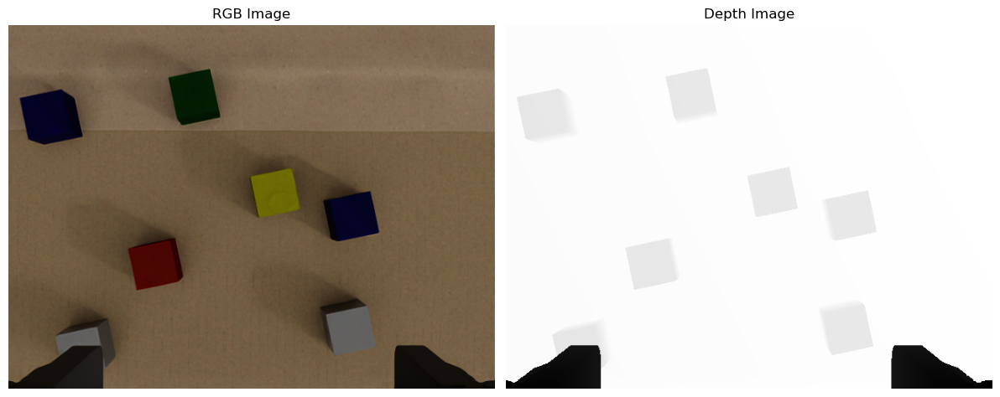

[INFO] Displayed Figure 1 (RGB and Depth).
[INFO] Downsampled point cloud from 297696 to 30000 for Figure 2.


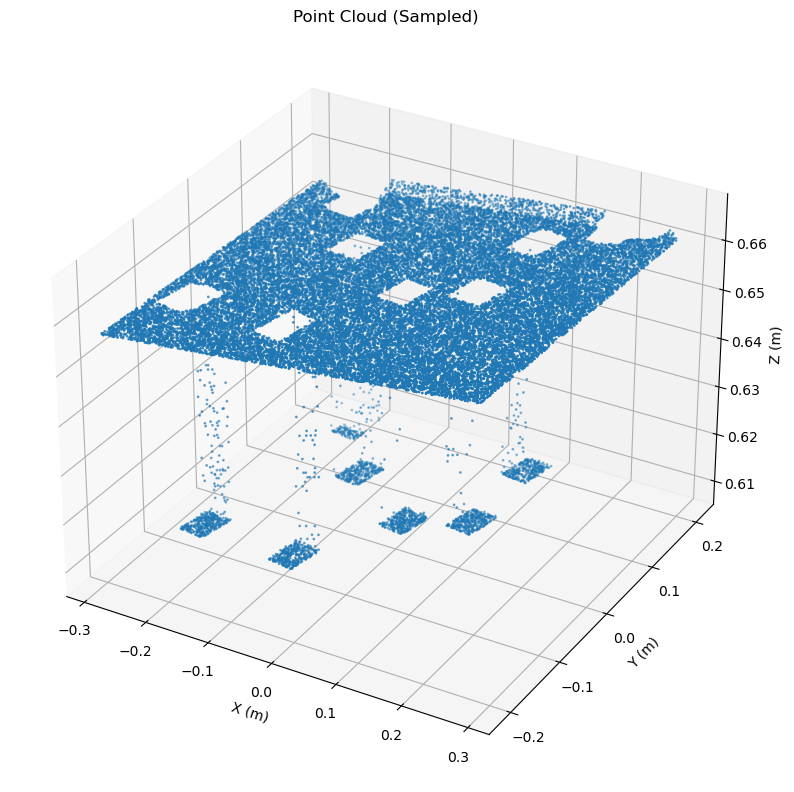

[INFO] Displayed Figure 2 (Point Cloud).
[INFO] Visualization run took 0.374 s


In [4]:
import time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Needed for 3D plots

def visualize_separate_figures(rgb_cv, depth_cv, base_cloud, show_plot=True):
    """
    Visualizes data in two separate figures:
    - Figure 1: RGB and Depth images side-by-side.
    - Figure 2: 3D Point Cloud.

    If show_plot=False, skips any display.
    Times the entire plotting run and prints the elapsed seconds.
    """
    start_time = time.time()  # Start timing

    # --- Figure 1: RGB and Depth Images ---
    if (rgb_cv is None) or (depth_cv is None):
        print("[WARN] Missing RGB or Depth image => cannot display Figure 1.")
    elif show_plot:
        try:
            fig1, axes1 = plt.subplots(1, 2, figsize=(12, 5)) # Figure for 2D images

            # Subplot 1: RGB
            axes1[0].imshow(rgb_cv) # Assumes rgb_cv is RGB
            axes1[0].set_title("RGB Image")
            axes1[0].axis("off")

            # Subplot 2: Depth
            im_depth = axes1[1].imshow(depth_cv, cmap="gray")
            axes1[1].set_title("Depth Image")
            axes1[1].axis("off")
            # Optional: Colorbar for depth
            # fig1.colorbar(im_depth, ax=axes1[1], fraction=0.046, pad=0.04)

            plt.tight_layout(pad=1.0)
            plt.show() # Show the first figure
            print("[INFO] Displayed Figure 1 (RGB and Depth).")
        except Exception as e:
            print(f"[ERROR] Failed to display Figure 1: {e}")


    # --- Figure 2: 3D Point Cloud ---
    if base_cloud is None or len(base_cloud) == 0:
        print("[WARN] Missing or empty point cloud => cannot display Figure 2.")
    elif show_plot:
        try:
            # Optionally downsample the cloud if it's large
            max_points = 30000 # Adjust as needed
            n_points = len(base_cloud)
            if n_points > max_points:
                idx = np.random.choice(n_points, max_points, replace=False)
                cloud_sample = base_cloud[idx]
                print(f"[INFO] Downsampled point cloud from {n_points} to {max_points} for Figure 2.")
            else:
                cloud_sample = base_cloud

            fig2 = plt.figure(figsize=(8, 8)) # Separate figure for 3D plot
            ax3 = fig2.add_subplot(1, 1, 1, projection="3d") # Single subplot

            if cloud_sample.shape[0] > 0:
                ax3.scatter(
                    cloud_sample[:, 0],
                    cloud_sample[:, 1],
                    cloud_sample[:, 2],
                    s=1 # Small point size
                )
            else:
                 print("[WARN] No points in cloud_sample to scatter for Figure 2.")

            ax3.set_title("Point Cloud (Sampled)")
            ax3.set_xlabel("X (m)")
            ax3.set_ylabel("Y (m)")
            ax3.set_zlabel("Z (m)")
            # Ensure equal aspect ratio for better 3D perception if appropriate
            # ax3.set_aspect('equal', adjustable='box') # Uncomment if needed
            # Optional: Set limits if auto-scaling is poor
            # ax3.set_xlim([-1, 1]); ax3.set_ylim([-1, 1]); ax3.set_zlim([0, 1.5])
            # Optional: Adjust view angle
            # ax3.view_init(elev=20., azim=-35)

            plt.tight_layout(pad=1.0)
            plt.show() # Show the second figure
            print("[INFO] Displayed Figure 2 (Point Cloud).")
        except Exception as e:
            print(f"[ERROR] Failed to display Figure 2: {e}")


    end_time = time.time()  # End timing
    elapsed = end_time - start_time
    # Only print timing if something was actually attempted
    if show_plot and ((rgb_cv is not None and depth_cv is not None) or (base_cloud is not None and len(base_cloud) > 0)):
        print(f"[INFO] Visualization run took {elapsed:.3f} s")

# --- Execute the visualization using your existing variables ---
# Ensure that 'rgb_cv', 'depth_cv', and 'base_cloud' have been
# defined and populated correctly in the cells above this one.
try:
    # Call the new function name
    visualize_separate_figures(rgb_cv, depth_cv, base_cloud, show_plot=True)
except NameError as e:
    print(f"[ERROR] Failed to execute visualization: {e}")
    print("Please ensure the variables 'rgb_cv', 'depth_cv', and 'base_cloud' exist.")
    print("You might need to re-run the cells that define these variables.")

# Step 3 Starting the Pipeline for Camera information and Optional Axes remapping

In [5]:
import time

start_time = time.time()  # Start timing

# Retrieve the camera info data from all_data (a dict presumably filled from a ROS bag)
caminfo_data = all_data.get("/camera_manipulator/camera_info", [])
if not caminfo_data:
    print("[ERROR] No camera_info => stopping.")
else:
    # Take the first item
    (_, caminfo_msg) = caminfo_data[0]
    K = caminfo_msg.k  # This is usually a list/array of 9 elements (row-major camera matrix)

    # Extract intrinsics
    fx, cx = K[0], K[2]
    fy, cy = K[4], K[5]
    print(f"[INFO] Intrinsics => fx={fx:.3f}, fy={fy:.3f}, cx={cx:.3f}, cy={cy:.3f}")

REMAP_AXES = False  # If you want to do optional axis re-mapping
print("[STEP] REMAP_AXES =", REMAP_AXES)

end_time = time.time()
elapsed = end_time - start_time
print(f"[INFO] Step took {elapsed:.3f} s")
print("[STEP] Done. Ready for next cell.")


[INFO] Intrinsics => fx=732.999, fy=753.394, cx=320.000, cy=240.000
[STEP] REMAP_AXES = False
[INFO] Step took 0.000 s
[STEP] Done. Ready for next cell.


### Step 3.1 Showing Point cloud

In [6]:
import time
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # needed for 3D scatter

def step2_visualization(show_plot=True):
    """
    Checks for 'rgb_cv' and 'base_cloud' in the global namespace,
    reports their shapes if found, and optionally displays them
    with Matplotlib. Measures the total runtime and prints it.
    
    NOTE: This function does NOT overwrite or create these variables.
    It simply references them if they exist.
    """
    start_time = time.time()

    # Check for rgb_cv
    if 'rgb_cv' not in globals():
        print("[STEP] ERROR: 'rgb_cv' not found. Please define your RGB image array.")
    else:
        if globals()['rgb_cv'] is not None:
            print("[STEP] rgb_cv shape =", globals()['rgb_cv'].shape)
        else:
            print("[STEP] rgb_cv is None.")

    # Check for base_cloud
    if 'base_cloud' not in globals():
        print("[STEP] ERROR: 'base_cloud' not found. Please define your Nx3 point array.")
    else:
        if globals()['base_cloud'] is not None:
            print("[STEP] base_cloud shape =", globals()['base_cloud'].shape)
        else:
            print("[STEP] base_cloud is None.")

    # If show_plot=False, skip any plotting
    if show_plot:
        # Plot the RGB image if it exists
        if 'rgb_cv' in globals() and globals()['rgb_cv'] is not None:
            rgb_cv = globals()['rgb_cv']
            plt.figure()
            plt.imshow(rgb_cv)
            plt.title("[STEP] Input RGB")
            plt.axis("off")
            plt.show()

        # Plot the base_cloud in 3D if it exists
        if 'base_cloud' in globals() and globals()['base_cloud'] is not None:
            base_cloud = globals()['base_cloud']
            max_points = 5000
            n_points = len(base_cloud)
            if n_points > max_points:
                idx = np.random.choice(n_points, max_points, replace=False)
                cloud_show = base_cloud[idx]
            else:
                cloud_show = base_cloud

            fig = plt.figure(figsize=(6,6))
            ax = fig.add_subplot(111, projection='3d')
            ax.scatter(cloud_show[:,0], cloud_show[:,1], cloud_show[:,2], s=1)
            ax.set_title("[STEP] Base Cloud (Scatter Preview)")
            ax.set_xlabel("X")
            ax.set_ylabel("Y")
            ax.set_zlabel("Z")
            plt.show()

    print("[STEP] Done.")

    end_time = time.time()
    elapsed = end_time - start_time
    print(f"[STEP] This step took {elapsed:.3f} s")


# Example: show the plots
step2_visualization(show_plot=False)

[STEP] rgb_cv shape = (480, 640, 3)
[STEP] base_cloud shape = (297696, 3)
[STEP] Done.
[STEP] This step took 0.000 s


# Step 4 Filtering Downsampling and Segmentation

In [7]:
import time
import numpy as np
import open3d as o3d
import pyvista as pv

def step3_and_4_plane_removal(base_cloud, MIN_Z=0.0, MAX_Z=1.2, RANSAC_DIST_THRESH=0.0085, 
                               RANSAC_N=16, RANSAC_ITER=2000, VOXEL_SIZE=0.002, PLANE_MARGIN=0.005, 
                               show_plot=True):
    """
    Combined Step 3 & 4: Plane Removal and Margin Removal from point cloud using Open3D RANSAC.
    - Filters the cloud by Z-range
    - Downsamples with voxel grid filter
    - Segments the plane
    - Removes points near the plane using a margin threshold
    - Optionally shows the result using PyVista
    Measures the total run time.
    """
    start_time = time.time()  # Start timing

    if base_cloud is None or len(base_cloud) == 0:
        print("[STEP] ERROR: no base_cloud => abort.")
        return None, None, None, None  # Returning None if no valid base_cloud is passed

    # 1) Filter out invalid or out-of-range Z
    points_array = base_cloud.copy()
    valid_mask = np.isfinite(points_array).all(axis=1)  # mask for valid points
    points_array = points_array[valid_mask]

    # Apply Z-range filtering in a single step
    zvals = points_array[:, 2]
    zrange_mask = (zvals >= MIN_Z) & (zvals <= MAX_Z)  # mask for Z range
    points_array = points_array[zrange_mask]

    print(f"[STEP] After Z filter => {points_array.shape[0]} points remain")

    # 2) Create Open3D cloud, downsample
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points_array)
    pcd_down = pcd.voxel_down_sample(VOXEL_SIZE)
    print(f"[STEP] After voxel downsample => {len(pcd_down.points)} points")

    # 3) Plane segmentation using RANSAC
    plane_model, inliers = pcd_down.segment_plane(
        distance_threshold=RANSAC_DIST_THRESH,
        ransac_n=RANSAC_N,
        num_iterations=RANSAC_ITER
    )
    print(f"[STEP] Plane model => {plane_model} [a,b,c,d]")

    # Separate the plane and object points
    plane_cloud = pcd_down.select_by_index(inliers)
    object_cloud = pcd_down.select_by_index(inliers, invert=True)
    print(f"[STEP] => {len(plane_cloud.points)} plane pts, {len(object_cloud.points)} object pts")

    # 4) Remove points near the plane from object_cloud
    a, b, c, d = plane_model
    normal_mag = np.sqrt(a*a + b*b + c*c)

    obj_pts = np.asarray(object_cloud.points)
    signed_dist = (a*obj_pts[:,0] + b*obj_pts[:,1] + c*obj_pts[:,2] + d) / normal_mag
    keep_mask = (np.abs(signed_dist) > PLANE_MARGIN)  # Keep points not within the margin
    final_obj_pts = obj_pts[keep_mask]

    final_obj = o3d.geometry.PointCloud()
    final_obj.points = o3d.utility.Vector3dVector(final_obj_pts)

    print(f"[STEP] => final object points => {len(final_obj.points)}")

    # 5) (Optional) PyVista visualization
    if show_plot:
        pv_plane = pv.PolyData(np.asarray(plane_cloud.points))
        pv_objs = pv.PolyData(np.asarray(final_obj_pts))
        plotter = pv.Plotter(notebook=True, title="[STEP 3 & 4] Plane Removal and Margin Removed")
        plotter.add_points(pv_plane, color='red', point_size=2, label="Plane")
        plotter.add_points(pv_objs, color='blue', point_size=3, label="Objects")
        plotter.add_legend()
        plotter.show()

    print("[STEP] Done.")

    end_time = time.time()
    elapsed = end_time - start_time
    print(f"[STEP] This step took {elapsed:.3f} s")

    # Return the results so they can be reused in the next step
    return plane_model, plane_cloud, object_cloud, final_obj

# Example usage:
# base_cloud = <Your Nx3 point cloud data here>
plane_model, plane_cloud, object_cloud, final_obj = step3_and_4_plane_removal(base_cloud, show_plot=True)

# You can now use plane_model, plane_cloud, object_cloud, and final_obj for further steps


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
[STEP] After Z filter => 297696 points remain
[STEP] After voxel downsample => 62285 points
[STEP] Plane model => [-0.01415641  0.00637821  0.99987945 -0.65959899] [a,b,c,d]
[STEP] => 56072 plane pts, 6213 object pts
[STEP] => final object points => 6213


Widget(value='<iframe src="http://localhost:38973/index.html?ui=P_0x7d82e5d9be80_0&reconnect=auto" class="pyvi…

[STEP] Done.
[STEP] This step took 0.841 s



# Step 5 Clustering

In [8]:
import time
import numpy as np
import open3d as o3d
import hdbscan
import pyvista as pv

def run_hdbscan_clustering(final_obj, weight=0.1, min_cluster_size=15, show_plot=True):
    """
    Performs HDBSCAN clustering on the 3D point cloud with normals.
    - Combines points and normals into a feature vector.
    - Runs HDBSCAN clustering.
    - Optionally visualizes the clusters.
    Returns the clusters and centers.
    """
    start_time = time.time()  # Start timing

    # Ensure normals are computed
    final_obj.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.005, max_nn=5))
    points = np.asarray(final_obj.points)
    normals = np.asarray(final_obj.normals)

    # Combine coordinates and normals into a feature vector
    # Scale normals with a weight factor to balance their influence relative to positions
    features = np.hstack([points, weight * normals])

    # Run HDBSCAN clustering on the feature vectors
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)
    labels = clusterer.fit_predict(features)

    unique_labels = np.unique(labels)
    clusters_3d = []
    for lbl in unique_labels:
        if lbl == -1:  # -1 indicates noise
            continue
        mask = labels == lbl
        cpts = points[mask]
        if len(cpts) > 0:
            ctr = cpts.mean(axis=0)
            clusters_3d.append((lbl, cpts, ctr))

    print(f"[INFO] HDBSCAN found {len(clusters_3d)} clusters")

    # Visualization (optional)
    if show_plot:
        plotB = pv.Plotter(notebook=True, title="HDBSCAN Clusters")
        for lbl, cpts, ctr in clusters_3d:
            color_rand = np.random.randint(0, 255, size=3).tolist()
            plotB.add_points(pv.PolyData(cpts), color=color_rand, point_size=5)
            plotB.add_mesh(pv.Sphere(radius=0.01, center=ctr), color='yellow')
        plotB.show()

    # Time taken
    end_time = time.time()
    elapsed = end_time - start_time
    print(f"[INFO] HDBSCAN step took {elapsed:.3f} s")

    # Return the clusters and their centers for future use
    return clusters_3d

# Example usage:
# final_obj = <Your Open3D PointCloud with normals computed>
clusters_3d = run_hdbscan_clustering(final_obj, show_plot=True)


[INFO] HDBSCAN found 33 clusters


Widget(value='<iframe src="http://localhost:38973/index.html?ui=P_0x7d8266c189a0_1&reconnect=auto" class="pyvi…

[INFO] HDBSCAN step took 0.747 s


# Step 7 U^2-Net Saliency

[2025-10-18 17:50:35] [STEP 7] Torch device = cuda
[INFO] Loaded U-2-Net model from /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/scripts/manipulation/resources/weights/u2net.pth to cuda
[STEP 7] Running U-2-Net inference...
[STEP 7] Displaying results in separate figures...


/home/cesar514/workspaces/isaac_ws/isaac_sim_testing/scripts/manipulation/resources/U-2-Net/model/u2net.py:23: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  src = F.upsample(src,size=tar.shape[2:],mode='bilinear')


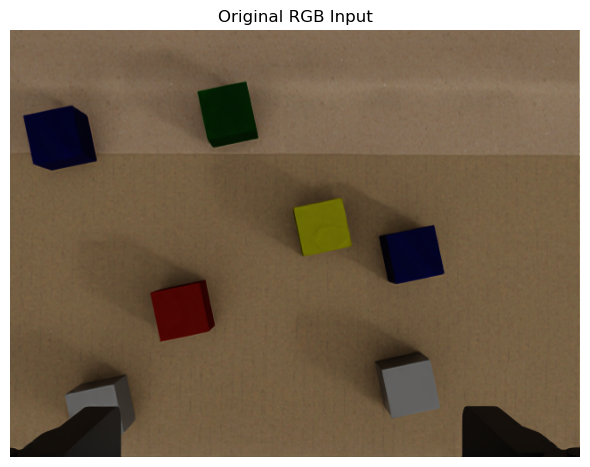

[INFO] Displayed Figure 1 (Original RGB).


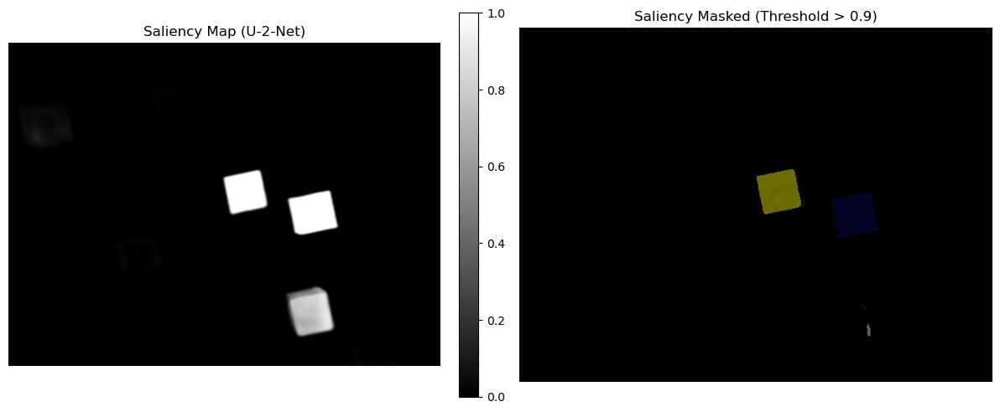

[INFO] Displayed Figure 2 (Saliency Map | Masked RGB).
[STEP 7] Processing complete.
[STEP 7] This step took 0.840 seconds.


In [9]:
import sys
import torch
import time
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Assume U-2-Net path and model loading works as before
# Add U-2-Net repo to path (relative)
U2NET_PATH = (REPO_ROOT / 'scripts' / 'manipulation' / 'resources' / 'U-2-Net').resolve()
sys.path.append(str(U2NET_PATH))
# Ensure the model definition is imported correctly
try:
    from model import U2NET
except ImportError as e:
    print(f"[ERROR] Could not import U2NET from model: {e}")
    print("Please ensure U-2-Net code is correctly placed and path added.")
    # Handle error appropriately, maybe raise the exception or exit
    raise e

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"[{time.strftime('%Y-%m-%d %H:%M:%S')}] [STEP 7] Torch device = {device}") # Added timestamp for context

def load_u2net_model(path=None): # Adjust path if needed
    if path is None:
        path = (REPO_ROOT / 'scripts' / 'manipulation' / 'resources' / 'weights' / 'u2net.pth').resolve()
    try:
        net = U2NET(3, 1)
        if not path.exists():
             raise FileNotFoundError(f"U-2-Net weights not found at {path}")
        net.load_state_dict(torch.load(str(path), map_location=device))
        net.to(device)
        net.eval()
        print(f"[INFO] Loaded U-2-Net model from {path} to {device}")
        return net
    except Exception as e:
        print(f"[ERROR] Failed to load U-2-Net model: {e}")
        raise e

# --- Attempt to load the model (handle potential errors) ---
try:
    model_u2 = load_u2net_model()
except Exception:
    print("[FATAL] Could not load U-2-Net model. Subsequent steps requiring it will fail.")
    # Handle failure, e.g., set model_u2 to None or exit
    model_u2 = None
    # sys.exit(1) # Optional: exit if the model is critical


def run_u2net(model, img_np):
    if model is None:
        print("[ERROR] U-2-Net model is not loaded. Cannot run inference.")
        return None

    from torchvision import transforms
    # Define transformations
    trans = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((320, 320)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], # Standard ImageNet mean
                             [0.229, 0.224, 0.225]) # Standard ImageNet std dev
    ])
    # Ensure input is contiguous C-style array
    if not img_np.flags['C_CONTIGUOUS']:
        img_np = np.ascontiguousarray(img_np, dtype=img_np.dtype)

    try:
        inp = trans(img_np).unsqueeze(0).to(device) # Add batch dimension and send to device
        with torch.no_grad(): # Disable gradient calculations for inference
            # Run the model inference - U2NET typically returns multiple outputs (d0 to d6 or similar)
            # d1 is often used for the primary saliency map
            outputs = model(inp)
            d1 = outputs[0] # Assuming d1 is the main output based on original code
            pred = d1[:, 0, :, :] # Extract the single channel prediction

            # Normalize the prediction map to [0, 1]
            pred_min = torch.min(pred)
            pred_max = torch.max(pred)
            # Avoid division by zero if max equals min
            if pred_max > pred_min:
                 pred = (pred - pred_min) / (pred_max - pred_min + 1e-8) # Add epsilon for stability
            else:
                 # Handle flat prediction (e.g., all same value) -> output zero map
                 pred = torch.zeros_like(pred)

            # Move prediction to CPU, convert to numpy, remove batch dim
            out_map = pred.squeeze().cpu().numpy()
            # Resize back to original image size using OpenCV
            out_map = cv2.resize(out_map, (img_np.shape[1], img_np.shape[0]), interpolation=cv2.INTER_LINEAR)
        return out_map
    except Exception as e:
        print(f"[ERROR] Exception during U-2-Net inference: {e}")
        return None


def step7_saliency(show_plot=True, saliency_threshold=0.9):
    """
    Runs U-2-Net saliency detection and optionally displays results
    in two separate figures:
    - Figure 1: Original RGB
    - Figure 2: Saliency Map | Saliency Masked RGB
    """
    start_time = time.time()

    if 'model_u2' not in globals() or model_u2 is None:
         print("[ERROR] U-2-Net model ('model_u2') not available.")
         return None, None, None

    if 'rgb_cv' not in globals() or rgb_cv is None:
        print("[STEP 7] No 'rgb_cv' variable found or it is None.")
        return None, None, None
    if not isinstance(rgb_cv, np.ndarray) or rgb_cv.ndim != 3 or rgb_cv.shape[2] != 3:
        print(f"[ERROR] 'rgb_cv' is not a valid 3-channel NumPy array. Shape: {rgb_cv.shape if isinstance(rgb_cv, np.ndarray) else type(rgb_cv)}")
        return None, None, None

    print("[STEP 7] Running U-2-Net inference...")
    sal_map = run_u2net(model_u2, rgb_cv)

    if sal_map is None:
         print("[STEP 7] U-2-Net inference failed. Cannot proceed.")
         return None, None, None

    # Clamp saliency map values to ensure they are in [0, 1]
    sal_map = np.clip(sal_map, 0.0, 1.0)

    # Threshold to create a binary saliency mask
    bin_sal = (sal_map > saliency_threshold).astype(np.uint8)

    # Create masked RGB image
    masked_rgb = rgb_cv.copy() # Make a copy to avoid modifying the original
    masked_rgb[bin_sal == 0] = 0 # Apply mask

    # --- Visualization ---
    if show_plot:
        print("[STEP 7] Displaying results in separate figures...")

        # --- Figure 1: Original RGB ---
        try:
            fig1 = plt.figure(figsize=(6, 5)) # Adjust size as needed
            plt.imshow(rgb_cv)
            plt.title("Original RGB Input")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            print("[INFO] Displayed Figure 1 (Original RGB).")
        except Exception as e:
            print(f"Error displaying Figure 1 (Original RGB): {e}")

        # --- Figure 2: Saliency Map and Masked RGB ---
        try:
            fig2, axes2 = plt.subplots(1, 2, figsize=(12, 5)) # 1 row, 2 columns

            # Plot 1: Saliency Map
            im_sal = axes2[0].imshow(sal_map, cmap='gray', vmin=0.0, vmax=1.0)
            axes2[0].set_title("Saliency Map (U-2-Net)")
            axes2[0].axis('off')
            fig2.colorbar(im_sal, ax=axes2[0], fraction=0.046, pad=0.04) # Add colorbar

            # Plot 2: Saliency Masked RGB
            axes2[1].imshow(masked_rgb)
            axes2[1].set_title(f"Saliency Masked (Threshold > {saliency_threshold})")
            axes2[1].axis('off')

            plt.tight_layout(pad=1.0)
            plt.show()
            print("[INFO] Displayed Figure 2 (Saliency Map | Masked RGB).")
        except Exception as e:
            print(f"Error displaying Figure 2 (Saliency Results): {e}")

    print("[STEP 7] Processing complete.")
    end_time = time.time()
    elapsed = end_time - start_time
    print(f"[STEP 7] This step took {elapsed:.3f} seconds.")

    # Return the results
    return sal_map, bin_sal, masked_rgb

# --- Execute the function ---
# Make sure 'rgb_cv' is defined and valid from previous cells
try:
    # Define the threshold you want to use for the binary mask
    threshold_value = 0.9
    # Call the function with the desired threshold
    sal_map, bin_sal, masked_rgb = step7_saliency(show_plot=True, saliency_threshold=threshold_value)

    if sal_map is None:
        print("[INFO] step7_saliency did not return valid results.")

except NameError as e:
     print(f"[ERROR] Failed to run step 7: {e}. Ensure 'rgb_cv' is defined.")
except Exception as e:
     print(f"[ERROR] An unexpected error occurred during step 7: {e}")

# Step 8 3D reprojection

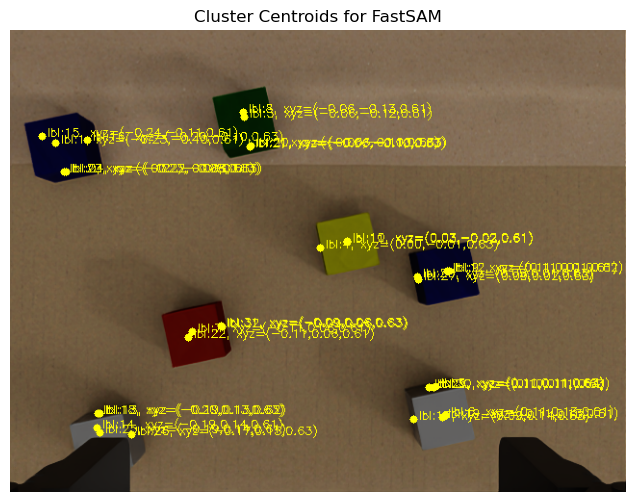


0: 768x1024 7 objects, 26.0ms
Speed: 1.7ms preprocess, 26.0ms inference, 75.0ms postprocess per image at shape (1, 3, 768, 1024)
[STEP 8] => 7 masks from FastSAM.


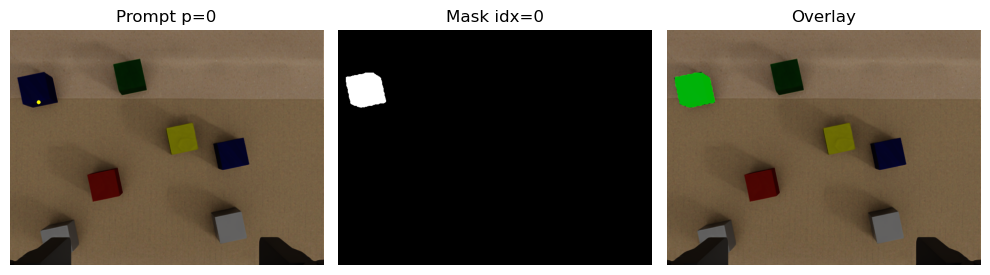

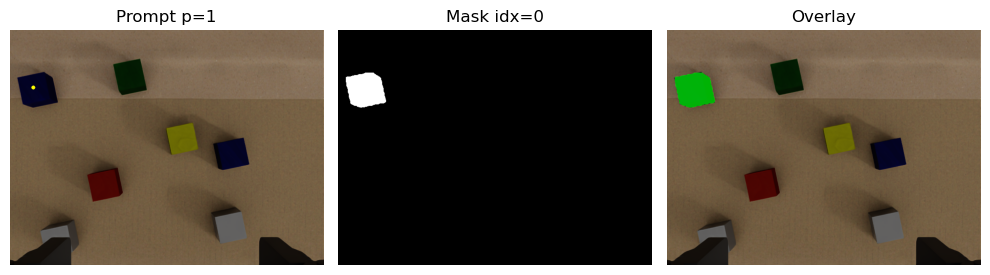

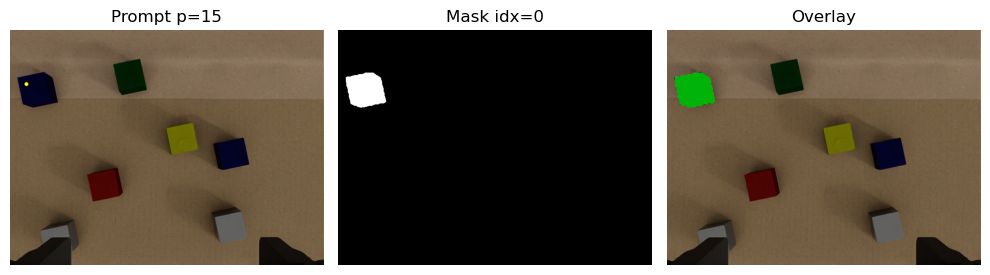

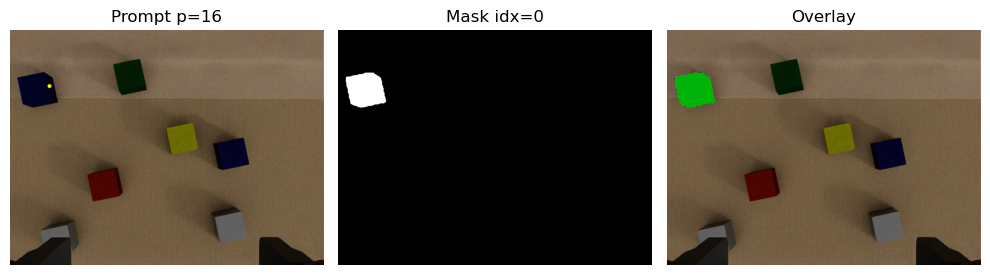

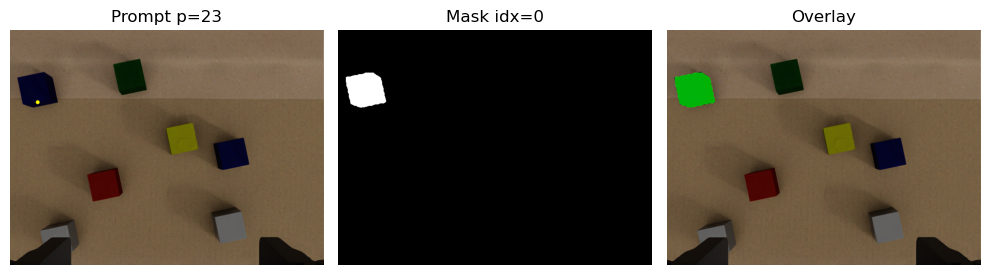

...

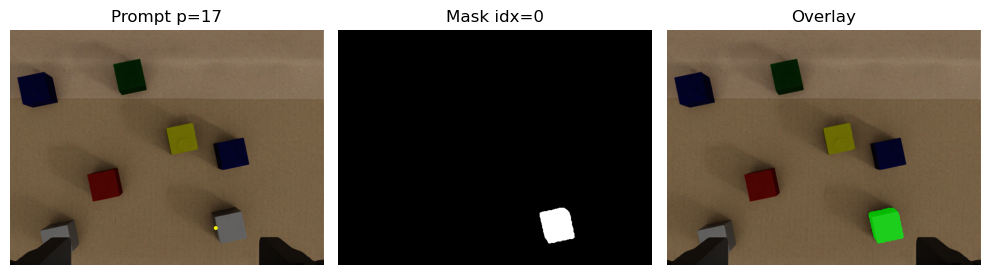

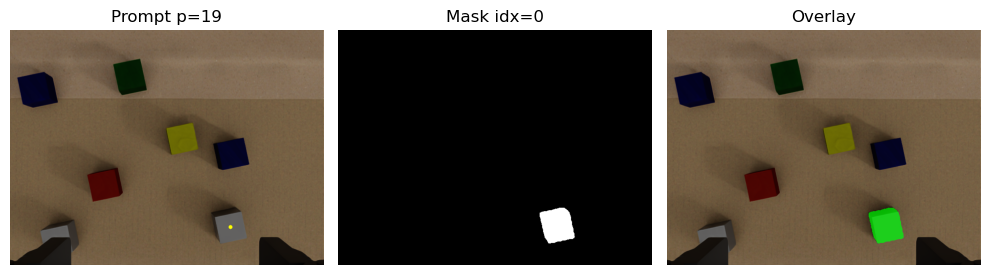

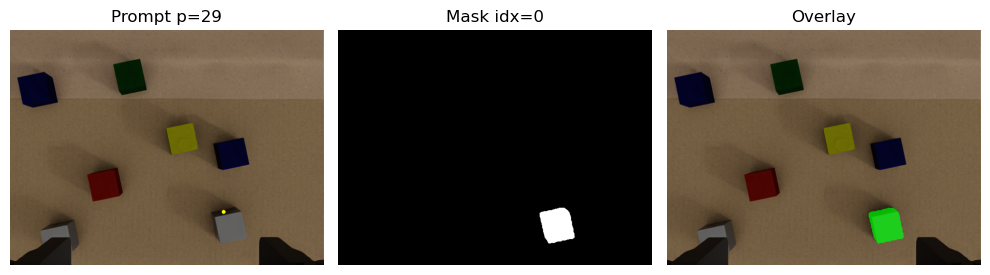

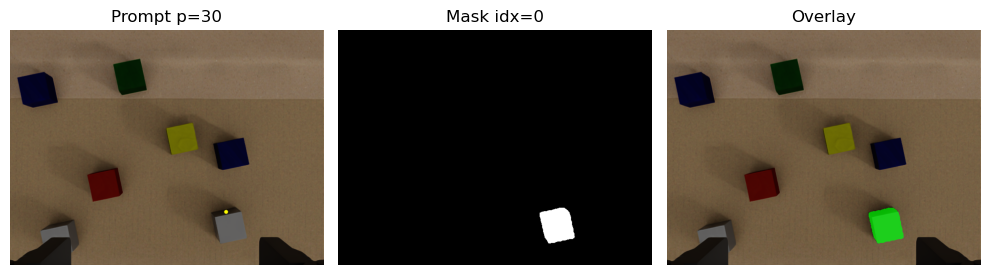

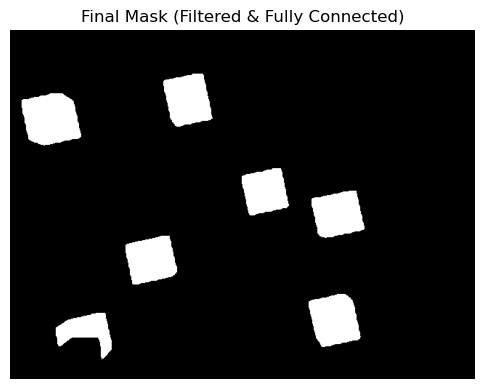

[STEP 8] This step took 3.555 seconds.


In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
import time
from ultralytics import FastSAM

##################################################################
# 9) FastSAM with cluster-based prompts
##################################################################
FASTSAM_WEIGHTS = (REPO_ROOT / 'scripts' / 'manipulation' / 'resources' / 'weights' / 'FastSAM-x.pt').resolve()
model_fs = FastSAM(str(FASTSAM_WEIGHTS))

def project_3d_to_2d(X, Y, Z, fx, fy, cx, cy, img_w, img_h):
    """Projects a 3D point (X,Y,Z) into 2D pixel coordinates."""
    if Z <= 0:
        return None
    u = int((X * fx) / Z + cx)
    v = int((Y * fy) / Z + cy)
    if (u < 0) or (v < 0) or (u >= img_w) or (v >= img_h):
        return None
    return (u, v)

def step8_run_fastsam_with_depth_filtering(
    clusters_3d, 
    rgb_cv, 
    depth_cv, 
    fx, 
    fy, 
    cx, 
    cy, 
    model_fs, 
    device,
    min_depth=0.3, 
    max_depth=2.0,
    show_intermediate=True,  # Whether to show partial masks per prompt
    show_results=True        # Whether to show centroid debug and final mask
):
    """
    1) For each 3D cluster centroid, project to 2D => build prompt for FastSAM
    2) Run FastSAM once with all prompts
    3) For each output mask, immediately filter out pixels outside [min_depth, max_depth].
    4) Discard masks that are not fully connected (i.e., >1 connected component).
    5) Merge valid masks => final_mask
    Returns final_mask (bool array, shape=H,W).
    """
    start_time = time.time()  # Start timing

    H, W = rgb_cv.shape[:2]

    # Convert to BGR for FastSAM if your rgb_cv is in RGB
    bgr_for_fs = cv2.cvtColor(rgb_cv, cv2.COLOR_RGB2BGR)

    # Build 2D prompts from cluster centroids
    all_uv_coords = []
    all_uv_labels = []
    debug_img = bgr_for_fs.copy()

    # Collect prompts for FastSAM
    for (lbl, cpts, ctr) in clusters_3d:
        uv = project_3d_to_2d(ctr[0], ctr[1], ctr[2], fx, fy, cx, cy, W, H)
        if uv is None:
            continue
        (u, v) = uv

        # Visual debug: draw small circle
        cv2.circle(debug_img, (u, v), 4, (0, 255, 255), -1)
        text_str = f"lbl:{lbl}, xyz=({ctr[0]:.2f},{ctr[1]:.2f},{ctr[2]:.2f})"
        cv2.putText(debug_img, text_str, (u + 5, v), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 255), 1)

        all_uv_coords.append([u, v])
        all_uv_labels.append(1)  # 1 => foreground prompts

    # Show centroid debug if requested
    if show_results:
        plt.figure(figsize=(8, 6))
        plt.imshow(cv2.cvtColor(debug_img, cv2.COLOR_BGR2RGB))
        plt.title("Cluster Centroids for FastSAM")
        plt.axis('off')
        plt.show()

    if len(all_uv_coords) == 0:
        print("[STEP 8] No valid 2D prompts => returning empty mask.")
        return np.zeros((H, W), dtype=bool)

    # Single run of FastSAM (batch processing for all prompts at once)
    results_list = model_fs(
        source=bgr_for_fs,
        device=device.type,
        retina_masks=True,
        imgsz=1024,
        conf=0.7,
        iou=0.3,
        points=all_uv_coords,
        labels=all_uv_labels
    )

    if len(results_list) == 0:
        print("[STEP 8] No results from FastSAM => empty mask.")
        return np.zeros((H, W), dtype=bool)

    res = results_list[0]
    ms_data = res.masks.data if (res.masks and res.masks.data is not None) else []
    print(f"[STEP 8] => {len(ms_data)} masks from FastSAM.")

    # Build a depth_ok mask to clip out-of-range pixels
    depth_ok = (depth_cv >= min_depth) & (depth_cv <= max_depth)
    valid_masks_per_prompt = defaultdict(list)

    # Store depth buffers (z-buffer) along with masks
    masks_with_depth = []

    for i, mask_tensor in enumerate(ms_data):
        mask_np = mask_tensor.cpu().numpy().astype(np.uint8)  # shape=(H,W)
        mask_bool = (mask_np == 1)

        # Filter by depth
        mask_bool = mask_bool & depth_ok

        # Skip very small masks early to save time
        coverage = np.sum(mask_bool) / (H * W)
        if coverage < 1e-8:
            continue  # Skip empty masks
        if coverage > 0.25:
            print(f"[STEP 8] Mask {i} covers {coverage * 100:.1f}% => skipping.")
            continue

        # --- Check if the mask is fully connected ---
        mask_8u = (mask_bool.astype(np.uint8)) * 255
        num_labels, labels_im = cv2.connectedComponents(mask_8u, connectivity=8)
        # If num_labels > 2 => more than one connected foreground component
        if num_labels > 2:
            print(f"[STEP 8] Mask {i} is not fully connected => skipping.")
            continue

        # Check which prompt(s) are inside this mask
        found_prompt = False
        for p, (px, py) in enumerate(all_uv_coords):
            if mask_bool[py, px]:
                valid_masks_per_prompt[p].append(mask_bool.copy())
                found_prompt = True
        if not found_prompt:
            print(f"[STEP 8] Mask {i} => no prompt => skipping.")

        # Store the depth information along with the mask
        masks_with_depth.append((mask_bool, depth_cv))

    # If requested, visualize partial masks for each prompt
    if show_intermediate:
        for p, mask_list in valid_masks_per_prompt.items():
            if len(mask_list) == 0:
                continue
            (px, py) = all_uv_coords[p]

            fig, axs = plt.subplots(len(mask_list), 3, figsize=(10, 4 * len(mask_list)))
            if len(mask_list) == 1:
                axs = [axs]
            for row_idx, mb in enumerate(mask_list):
                # (1) Prompt image
                prompt_img = rgb_cv.copy()
                cv2.circle(prompt_img, (px, py), 4, (255, 255, 0), -1)
                axs[row_idx][0].imshow(prompt_img)
                axs[row_idx][0].set_title(f"Prompt p={p}")
                axs[row_idx][0].axis('off')

                # (2) Binary mask
                axs[row_idx][1].imshow(mb, cmap='gray')
                axs[row_idx][1].set_title(f"Mask idx={row_idx}")
                axs[row_idx][1].axis('off')

                # (3) Overlay
                overlay = rgb_cv.copy()
                green_c = np.array([0, 255, 0], dtype=np.uint8)
                overlay[mb] = 0.3 * overlay[mb] + 0.7 * green_c
                axs[row_idx][2].imshow(overlay)
                axs[row_idx][2].set_title("Overlay")
                axs[row_idx][2].axis('off')
            plt.tight_layout()
            plt.show()

    # Combine all partial masks
    final_mask = np.zeros((H, W), dtype=bool)
    for mask_list in valid_masks_per_prompt.values():
        for mbool in mask_list:
            final_mask |= mbool

    # Show the final mask if requested
    if show_results:
        plt.figure(figsize=(6, 6))
        plt.imshow(final_mask, cmap='gray')
        plt.title("Final Mask (Filtered & Fully Connected)")
        plt.axis('off')
        plt.show()

    # Measure and print elapsed time
    end_time = time.time()
    elapsed = end_time - start_time
    print(f"[STEP 8] This step took {elapsed:.3f} seconds.")

    return final_mask, masks_with_depth

# Example usage:
final_mask, masks_with_depth = step8_run_fastsam_with_depth_filtering(
    clusters_3d, 
    rgb_cv, 
    depth_cv, 
    fx, fy, cx, cy, 
    model_fs, 
    device,
    min_depth=0.3, 
    max_depth=2.0,
    show_intermediate=True,  # partial prompt masks
    show_results=True        # centroids + final mask
)

fastsam_mask = final_mask


# Step 9 – Fuse U²-Net Saliency & FastSAM

[STEP 9] Probability Fusion Time: 0.005 seconds.
[STEP 9] Erosion Time: 0.001 seconds.


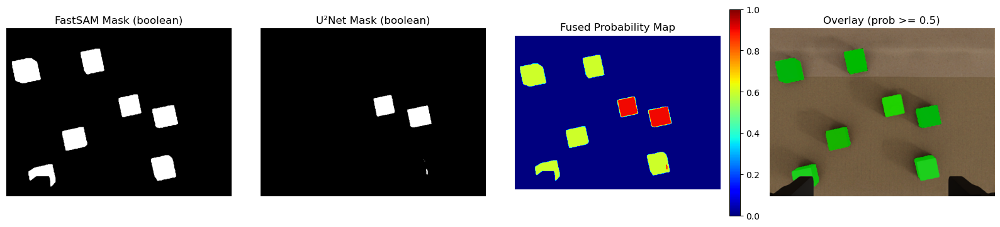

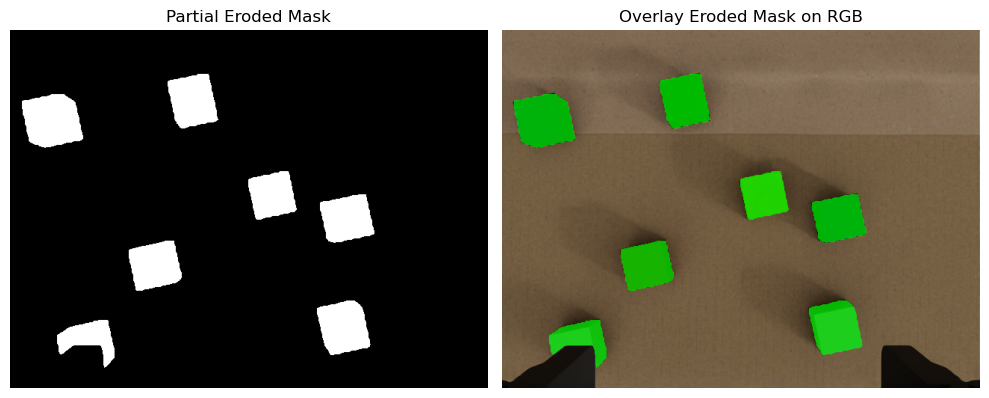

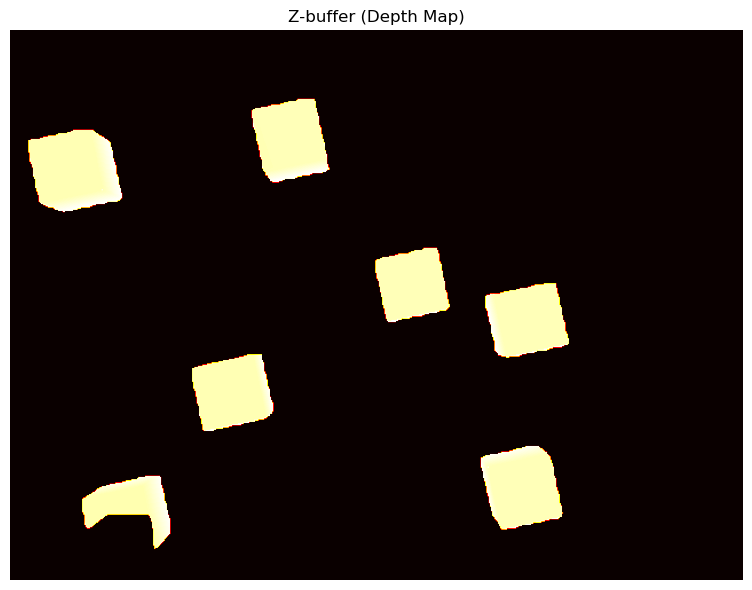

[STEP 9] Visualization Time: 0.247 seconds.


In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from collections import defaultdict
import time

def step9_probability_fusion(fastsam_mask, u2net_mask, depth_cv, p_single=0.6, p_both=0.9):
    """
    Fuses two boolean masks (fastsam_mask, u2net_mask) into a probability map.
    - If pixel is in neither => prob = 0
    - If pixel is in exactly one => prob = p_single
    - If pixel is in both => prob = p_both

    Additionally, store the corresponding depth (z-buffer) for each mask.
    """
    start_time = time.time()  # Start timing

    # Convert to float for arithmetic
    fs_float  = fastsam_mask.astype(float)  # shape=(H,W), 0.0 or 1.0
    u2n_float = u2net_mask.astype(float)    # shape=(H,W), 0.0 or 1.0

    # Intersection (both = 1)
    both_mask = fs_float * u2n_float
    # Exclusive FS
    fs_only   = fs_float * (1.0 - u2n_float)
    # Exclusive U²Net
    u2n_only  = (1.0 - fs_float) * u2n_float

    H, W = fs_float.shape
    prob_map = np.zeros((H, W), dtype=np.float32)

    # 1) Both => p_both
    prob_map[both_mask > 0.5] = p_both

    # 2) Exactly one => p_single
    prob_map[fs_only > 0.5]  = p_single
    prob_map[u2n_only > 0.5] = p_single

    # Store depth information (z-buffer) for the combined masks
    zbuffer = np.zeros_like(depth_cv)
    zbuffer[both_mask > 0.5] = depth_cv[both_mask > 0.5]  # store depth where both masks intersect
    zbuffer[fs_only > 0.5] = depth_cv[fs_only > 0.5]      # store depth where FastSAM mask is active
    zbuffer[u2n_only > 0.5] = depth_cv[u2n_only > 0.5]    # store depth where U²Net mask is active

    # Measure time taken for fusion
    end_time = time.time()
    print(f"[STEP 9] Probability Fusion Time: {end_time - start_time:.3f} seconds.")
    
    return prob_map, zbuffer

def apply_partial_erosion(prob_map, lower_thresh=0.5, upper_thresh=0.7, kernel_size=3, iterations=1):
    """
    Erodes the uncertain region using morphological erosion in OpenCV.
    """
    start_time = time.time()  # Start timing

    # Certain region
    certain_mask   = (prob_map >= upper_thresh)
    # Uncertain region
    uncertain_mask = (prob_map >= lower_thresh) & (prob_map < upper_thresh)

    # Erode the uncertain region only
    uncertain_u8 = (uncertain_mask).astype(np.uint8)*255
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    eroded_uncertain_u8 = cv2.erode(uncertain_u8, kernel, iterations=iterations)
    eroded_uncertain_bool = (eroded_uncertain_u8 > 0)

    # Final = certain or eroded uncertain
    final_mask = certain_mask | eroded_uncertain_bool

    # Measure time taken for erosion
    end_time = time.time()
    print(f"[STEP 9] Erosion Time: {end_time - start_time:.3f} seconds.")
    
    return final_mask

def step9_visualize_probability_fusion(rgb_cv, fastsam_mask, u2net_mask, prob_map,
                                       partial_eroded_mask=None, show_fastsam=True, show_u2net=True,
                                       show_prob_map=True, show_overlay=True, show_eroded_mask=True,
                                       show_zbuffer=False, zbuffer=None):
    """
    Visualizes:
      - FastSAM Mask
      - U²Net Mask
      - Probability Map
      - Overlay of Probability >= 0.5
      - (Optional) Overlay of partial-eroded mask
      - (Optional) Z-buffer (Depth Map)
    """
    start_time = time.time()  # Start timing

    fig, axs = plt.subplots(1, 4, figsize=(16,4))

    # Display FastSAM Mask
    if show_fastsam:
        axs[0].imshow(fastsam_mask, cmap='gray')
        axs[0].set_title("FastSAM Mask (boolean)")
        axs[0].axis('off')
    else:
        axs[0].axis('off')

    # Display U²Net Mask
    if show_u2net:
        axs[1].imshow(u2net_mask, cmap='gray')
        axs[1].set_title("U²Net Mask (boolean)")
        axs[1].axis('off')
    else:
        axs[1].axis('off')

    # Probability map visualization
    if show_prob_map:
        cax2 = axs[2].imshow(prob_map, cmap='jet', vmin=0.0, vmax=1.0)
        axs[2].set_title("Fused Probability Map")
        axs[2].axis('off')
        fig.colorbar(cax2, ax=axs[2], fraction=0.046, pad=0.04)
    else:
        axs[2].axis('off')

    # Probability >= 0.5 overlay
    if show_overlay:
        final_binary = (prob_map >= 0.5)
        overlay_img = rgb_cv.copy()
        green = np.array([0,255,0], dtype=np.uint8)
        overlay_img[final_binary] = 0.3 * overlay_img[final_binary] + 0.7 * green
        axs[3].imshow(overlay_img.astype(np.uint8))
        axs[3].set_title("Overlay (prob >= 0.5)")
        axs[3].axis('off')
    else:
        axs[3].axis('off')

    plt.tight_layout()
    plt.show()

    # If a partial_eroded_mask is provided, show it
    if partial_eroded_mask is not None and show_eroded_mask:
        fig2, ax2 = plt.subplots(1, 2, figsize=(10, 5))

        # Eroded mask
        ax2[0].imshow(partial_eroded_mask, cmap='gray')
        ax2[0].set_title("Partial Eroded Mask")
        ax2[0].axis('off')

        # Overlay partial eroded mask
        overlay_img2 = rgb_cv.copy()
        overlay_img2[partial_eroded_mask] = 0.3 * overlay_img2[partial_eroded_mask] + 0.7 * green
        ax2[1].imshow(overlay_img2.astype(np.uint8))
        ax2[1].set_title("Overlay Eroded Mask on RGB")
        ax2[1].axis('off')

        plt.tight_layout()
        plt.show()

    # If z-buffer (depth) is provided and show_zbuffer is True, show it
    if show_zbuffer and zbuffer is not None:
        fig3, ax3 = plt.subplots(figsize=(8, 6))
        ax3.imshow(zbuffer, cmap='hot')  # Display z-buffer (depth map)
        ax3.set_title("Z-buffer (Depth Map)")
        ax3.axis('off')
        plt.tight_layout()
        plt.show()

    # Measure time taken for visualization
    end_time = time.time()
    print(f"[STEP 9] Visualization Time: {end_time - start_time:.3f} seconds.")

# ----------------------------------------------------------------------
# Example usage in Step 9
# ----------------------------------------------------------------------
# Suppose you have:
#  - final_mask (FastSAM) from Step 8
#  - bin_sal (U²Net) from Step 7, boolean or 0/1
#  - rgb_cv: your original (H,W,3) RGB image

# 1) Build probability map
p_map, zbuffer = step9_probability_fusion(final_mask, bin_sal, depth_cv, p_single=0.6, p_both=0.9)

# 2) Erode uncertain region [0.5..0.7) 
#    => everything >= 0.7 => kept, <0.5 => 0, in [0.5..0.7) => morphological erosion
eroded_mask = apply_partial_erosion(p_map, lower_thresh=0.1, upper_thresh=0.9,
                                    kernel_size=1, iterations=1)

# 3) Visualize results
step9_visualize_probability_fusion(rgb_cv, final_mask, bin_sal, p_map,
                                   partial_eroded_mask=eroded_mask,
                                   show_fastsam=True, show_u2net=True, 
                                   show_prob_map=True, show_overlay=True, 
                                   show_eroded_mask=True, show_zbuffer=True, zbuffer=zbuffer)


###########
saliency_prob_map = p_map
###########


# Step 10 – Overlay Bounding Boxes & Masks

[OBJ 0] area_px=2402.5
   Depth_object= 0.610 m
   scale_m_per_px= 0.610 / 733.0 = 0.000832 m/px
   w_px=63.6, h_px=73.3 => w_m=0.053, h_m=0.061
   short_side_m= 0.053 => diameter_needed= 0.085
   can_grip= True

[OBJ 1] area_px=3831.5
   Depth_object= 0.614 m
   scale_m_per_px= 0.614 / 733.0 = 0.000837 m/px
   w_px=67.6, h_px=61.5 => w_m=0.057, h_m=0.051
   short_side_m= 0.051 => diameter_needed= 0.085
   can_grip= True

[OBJ 2] area_px=3527.5
   Depth_object= 0.611 m
   scale_m_per_px= 0.611 / 733.0 = 0.000834 m/px
   w_px=58.2, h_px=64.9 => w_m=0.049, h_m=0.054
   short_side_m= 0.049 => diameter_needed= 0.085
   can_grip= True

[OBJ 3] area_px=3504.5
   Depth_object= 0.615 m
   scale_m_per_px= 0.615 / 733.0 = 0.000838 m/px
   w_px=58.0, h_px=65.0 => w_m=0.049, h_m=0.054
   short_side_m= 0.049 => diameter_needed= 0.085
   can_grip= True

[OBJ 4] area_px=3078.0
   Depth_object= 0.613 m
   scale_m_per_px= 0.613 / 733.0 = 0.000837 m/px
   w_px=57.2, h_px=57.3 => w_m=0.048, h_m=0.048
   

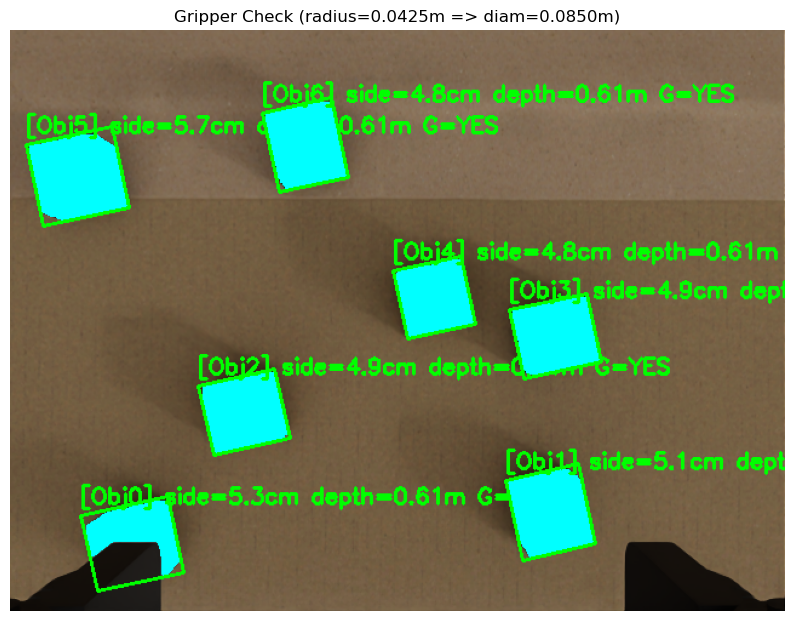

In [12]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time

def step10_check_gripper_feasibility(
    final_mask,
    depth_cv,
    fx, fy, cx, cy,
    gripper_radius=0.0425,   # ~42.5 mm => 85 mm diameter
    depth_invalid_val=0.0,
    show_results=True  # Show the results
):
    """
    Splits 'final_mask' into individual objects, approximates each object's
    median depth, and checks whether a 2-finger gripper of radius 'gripper_radius'
    can pinch it.

    Parameters:
    -----------
    final_mask : 2D boolean or uint8 array (H,W)
        Combined or eroded mask from Step 9, potentially containing multiple objects.
    depth_cv   : 2D float32 array (H,W) with depth in meters, aligned with final_mask
    fx, fy     : focal lengths (pixels) from camera intrinsics
    cx, cy     : principal point (in pixels)
    gripper_radius : float
        Half of the gripper's max opening. For example, 0.0425 => 85 mm diameter.
    depth_invalid_val : float
        Depth images might have 0 or 65535 for invalid. Filter them out as needed.
    show_results : bool
        Whether to show the results after checking feasibility

    Returns:
    --------
    results_list : list[dict] for each object, each dict containing:
          {
            'contour'      : Nx1x2 contour array (OpenCV)
            'area_pixels'  : area in pixel²
            'avg_depth'    : median depth for that object's pixels
            'px_dims'      : (w_px, h_px) from minAreaRect
            'scale_m_per_px': computed scale = depth_object / fx
            'min_side_m'   : min(w_m, h_m) in meters
            'can_grip'     : bool
            'box_pts'      : 4 corner points of minAreaRect in pixel coords
            'center_point' : (cxr, cyr) the center point of the object
            'bounding_box' : Bounding box points
          }
    """
    start_time = time.time()

    # Convert final_mask to a clean uint8 for connected-components
    mask_u8 = (final_mask > 0).astype(np.uint8)

    # 1) Find all external contours => each contour is one "object"
    contours, hierarchy = cv2.findContours(mask_u8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        print("[STEP 10] No objects found in final_mask.")
        return []

    results = []
    H, W = final_mask.shape
    center_points = []  # To store center points of objects
    bounding_boxes = []  # To store bounding boxes of objects

    for idx, cnt in enumerate(contours):
        area_px = cv2.contourArea(cnt)
        if area_px < 2.0:
            # Very small => skip
            continue

        # 2) Build a per-object mask => measure depth
        obj_mask = np.zeros((H, W), dtype=np.uint8)
        cv2.drawContours(obj_mask, [cnt], -1, color=255, thickness=-1)  # fill the contour

        # Gather depth of pixels in this object
        depth_vals = depth_cv[obj_mask > 0]
        depth_vals = depth_vals[np.isfinite(depth_vals)]
        depth_vals = depth_vals[depth_vals > depth_invalid_val]
        if len(depth_vals) < 5:
            # Not enough valid depth => skip
            continue

        # We'll use the median to reduce outliers
        depth_object = np.median(depth_vals)

        # 3) minAreaRect => bounding box in pixel coords
        rect = cv2.minAreaRect(cnt)  # => ((cxr,cyr),(w_px,h_px),angle)
        (cxr, cyr), (w_px, h_px), angle = rect
        box_pts = cv2.boxPoints(rect)
        box_pts = np.int0(box_pts)

        # 4) Convert pixel dimensions => real-world (approx)
        #    scale ~ depth / fx (assuming fx ~ fy)
        scale_m_per_px = depth_object / fx
        w_m = w_px * scale_m_per_px
        h_m = h_px * scale_m_per_px
        short_side_m = min(w_m, h_m)

        # 5) Check if short_side <= 2 * gripper_radius (the gripper's max opening)
        can_grip = (short_side_m <= 2.0 * gripper_radius)

        print(f"[OBJ {idx}] area_px={area_px:.1f}")
        print(f"   Depth_object= {depth_object:.3f} m")
        print(f"   scale_m_per_px= {depth_object:.3f} / {fx:.1f} = {scale_m_per_px:.6f} m/px")
        print(f"   w_px={w_px:.1f}, h_px={h_px:.1f} => w_m={w_m:.3f}, h_m={h_m:.3f}")
        print(f"   short_side_m= {short_side_m:.3f} => diameter_needed= {2*gripper_radius:.3f}")
        print(f"   can_grip= {can_grip}\n")

        result_dict = {
            'contour': cnt,
            'area_pixels': area_px,
            'avg_depth': float(depth_object),
            'px_dims': (w_px, h_px),
            'scale_m_per_px': float(scale_m_per_px),
            'min_side_m': float(short_side_m),
            'can_grip': can_grip,
            'box_pts': box_pts,
            'center_point': (cxr, cyr),  # Store center point
            'bounding_box': box_pts      # Store bounding box points
        }
        results.append(result_dict)

        # Store the center point and bounding box
        center_points.append((cxr, cyr))
        bounding_boxes.append(box_pts)

    end_time = time.time()
    print(f"[STEP 10] Gripper Feasibility Time: {end_time - start_time:.3f} seconds.")

    # Return center points, bounding boxes, and results
    return results, center_points, bounding_boxes


def step10_visualize_objects_grip(rgb_cv, results_list, gripper_radius=0.0425, show_results=True):
    """
    Visualizes each object with a bounding box.
    If can_grip=True => green box, else red box.
    Fills the object in yellow, and prints text about min_side and if we can grip.
    """
    # If user used simple_imgmsg_to_cv2(..., 'rgb8'), rgb_cv is in RGB order,
    # but OpenCV drawing expects BGR. So let's make a BGR copy for correct colors:
    if rgb_cv.ndim == 3 and rgb_cv.shape[2] == 3:
        overlay_bgr = cv2.cvtColor(rgb_cv, cv2.COLOR_RGB2BGR)
    else:
        # If single-channel or already BGR
        overlay_bgr = rgb_cv.copy()

    color_ok = (0, 255, 0)
    color_no = (0, 0, 255)
    color_fill = (255, 255, 0)  # yellow in BGR

    for idx, obj_res in enumerate(results_list):
        box_pts = obj_res['box_pts']
        can_grip = obj_res['can_grip']
        short_side_m = obj_res['min_side_m']
        depth_m = obj_res['avg_depth']

        # Fill the object region in yellow
        cv2.drawContours(overlay_bgr, [obj_res['contour']], -1, color_fill, thickness=-1)

        if box_pts is not None:
            if can_grip:
                ccol = color_ok
                txt_grip  = "G=YES"
            else:
                ccol = color_no
                txt_grip  = "G=NO"

            # Draw the bounding box
            for i in range(4):
                pt1 = tuple(box_pts[i])
                pt2 = tuple(box_pts[(i+1) % 4])
                cv2.line(overlay_bgr, pt1, pt2, ccol, 2)

            # Put text near the first corner
            txt_info = (f"[Obj{idx}] side={short_side_m*100:.1f}cm "
                        f"depth={depth_m:.2f}m {txt_grip}")
            # shift text slightly above the corner
            x_txt = box_pts[0][0]
            y_txt = box_pts[0][1] - 10
            cv2.putText(overlay_bgr, txt_info, (x_txt, y_txt),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, ccol, 2)

    # Convert back to RGB for matplotlib
    overlay_rgb = cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB)

    if show_results:
        plt.figure(figsize=(10, 8))
        plt.imshow(overlay_rgb)
        plt.title(f"Gripper Check (radius={gripper_radius:.4f}m => diam={2*gripper_radius:.4f}m)")
        plt.axis('off')
        plt.show()


def build_graspable_objects_mask(results_list, shape):
    """
    Creates a mask of the same shape=(H,W) that includes ONLY
    the objects that can be gripped (i.e., can_grip=True).
    """
    graspable_mask = np.zeros(shape, dtype=np.uint8)
    for idx, obj_res in enumerate(results_list):
        if obj_res['can_grip']:
            cv2.drawContours(graspable_mask, [obj_res['contour']], -1, 1, -1)
    return graspable_mask


# =========================================================
# Usage in STEP 10
# =========================================================
# Suppose you have:
#   eroded_mask    => from Step 9 (multiple objects)
#   depth_cv       => aligned depth in meters
#   fx, fy, cx, cy => camera intrinsics
#   rgb_cv         => color image in RGB (H,W,3)

if 'eroded_mask' in globals() and eroded_mask is not None:
    # 1) Run feasibility checks
    results_list, center_points, bounding_boxes = step10_check_gripper_feasibility(
        # final_mask       = fastsam_mask,
        final_mask       = eroded_mask,
        depth_cv         = depth_cv,
        fx               = fx,
        fy               = fy,
        cx               = cx,
        cy               = cy,
        gripper_radius   = 0.0425,   # 85 mm diameter
        depth_invalid_val= 0.0,
        show_results=False  # Show results after checking feasibility
    )

    # 2) Summarize
    print("\n[STEP 10] Summary of all objects:")
    for i, res in enumerate(results_list):
        print(f"Object {i}: area_px={res['area_pixels']:.1f}, depth={res['avg_depth']:.2f}m, "
              f"short_side={res['min_side_m']:.3f}m, can_grip={res['can_grip']}")

    # 3) Visualize bounding boxes in color
    step10_visualize_objects_grip(rgb_cv, results_list, gripper_radius=0.0425, show_results=True)

    # 4) Build a final mask that ONLY includes the objects that can be gripped
    graspable_mask = build_graspable_objects_mask(results_list, eroded_mask.shape)

    ###########
    # Convert graspable_mask into a float mask [0..1],
    # where 1.0 => bounding-box feasibility, 0.0 => infeasible
    bbox_mask = np.where(graspable_mask > 0, 1.0, 0.0)
    ###########

    # Show that final mask
    # plt.figure(figsize=(6, 6))
    # plt.imshow(graspable_mask, cmap='gray')
    # plt.title("Final Mask: Only Graspable Objects")
    # plt.axis('off')
    # plt.show()

else:
    print("[STEP 10] Missing 'eroded_mask' or it is None => cannot run gripper checks.")


#### called variables for latter
graspable_mask = graspable_mask
bbox_mask = bbox_mask



# Morphological Methods for grasp determination (double rectangle)

[MORPH OBJ 0] area_px=2402.5, depth=0.610, can_grip=True
[MORPH OBJ 1] area_px=3831.5, depth=0.614, can_grip=True
[MORPH OBJ 2] area_px=3527.5, depth=0.611, can_grip=True
[MORPH OBJ 3] area_px=3504.5, depth=0.615, can_grip=True
[MORPH OBJ 4] area_px=3078.0, depth=0.613, can_grip=True
[MORPH OBJ 5] area_px=4483.0, depth=0.611, can_grip=True
[MORPH OBJ 6] area_px=3610.0, depth=0.613, can_grip=True


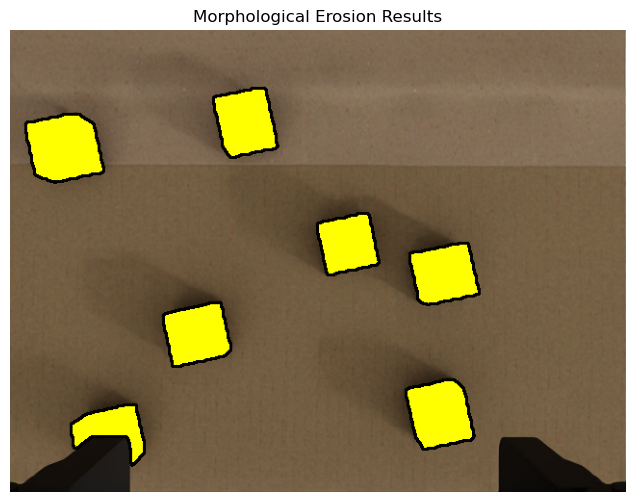


[ADV] Checking object 0 with advanced approach. shape=(480x640)
[ADV-PARALLEL] leftover components = 0
[ADV-PARALLEL] final feasible_rectangles = 6


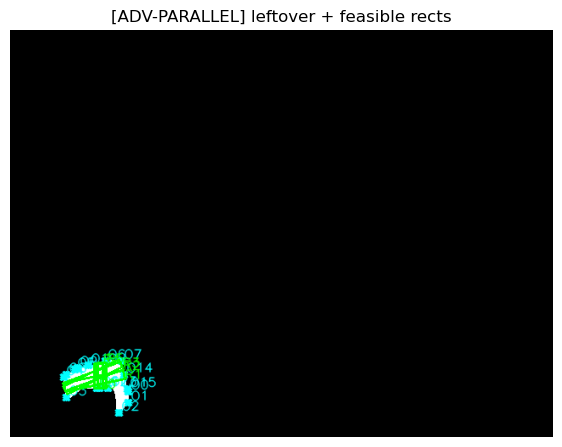


[ADV] Checking object 1 with advanced approach. shape=(480x640)
[ADV-PARALLEL] leftover components = 0
[ADV-PARALLEL] final feasible_rectangles = 23


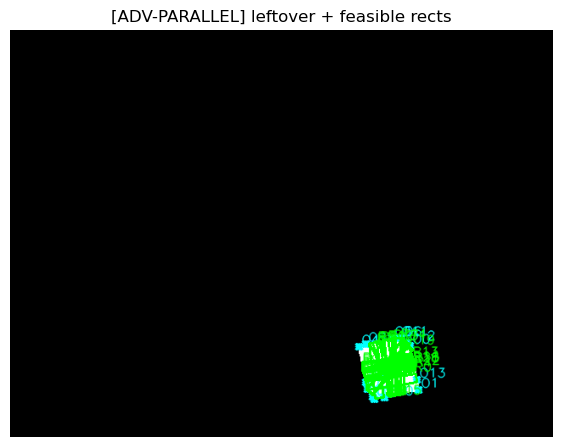


[ADV] Checking object 2 with advanced approach. shape=(480x640)
[ADV-PARALLEL] leftover components = 0
[ADV-PARALLEL] final feasible_rectangles = 26


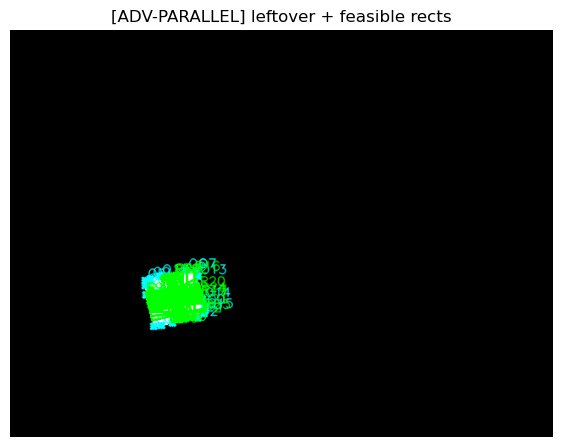


[ADV] Checking object 3 with advanced approach. shape=(480x640)
[ADV-PARALLEL] leftover components = 0
[ADV-PARALLEL] final feasible_rectangles = 24


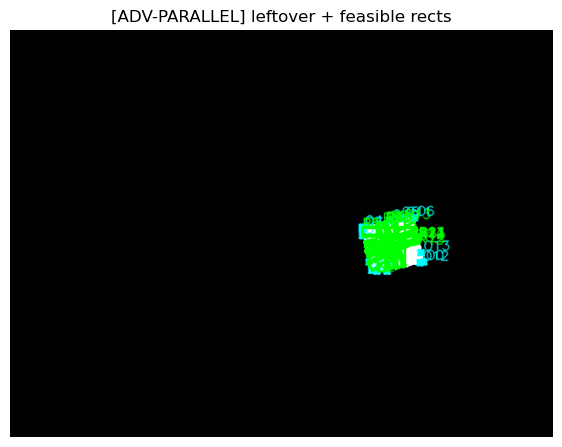


[ADV] Checking object 4 with advanced approach. shape=(480x640)
[ADV-PARALLEL] leftover components = 0
[ADV-PARALLEL] final feasible_rectangles = 19


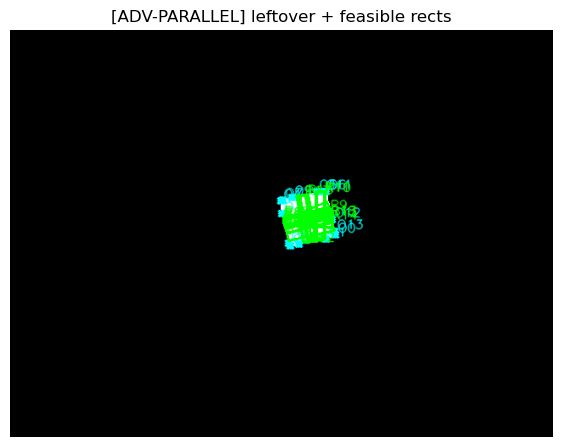


[ADV] Checking object 5 with advanced approach. shape=(480x640)
[ADV-PARALLEL] leftover components = 0
[ADV-PARALLEL] final feasible_rectangles = 24


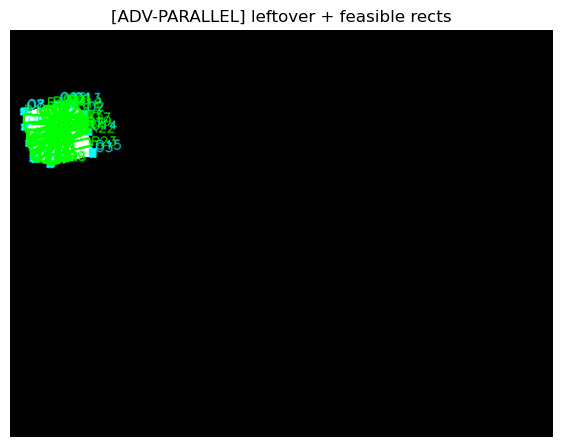


[ADV] Checking object 6 with advanced approach. shape=(480x640)
[ADV-PARALLEL] leftover components = 0
[ADV-PARALLEL] final feasible_rectangles = 24


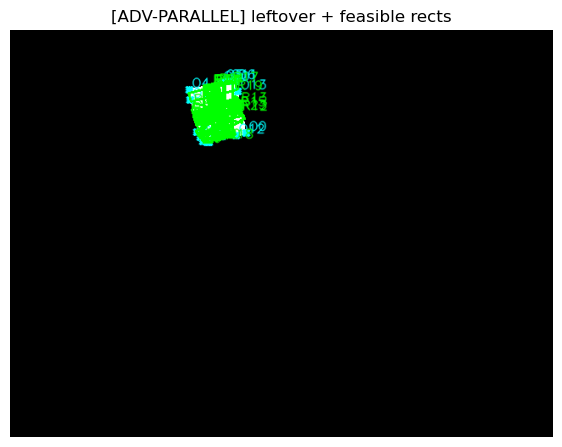

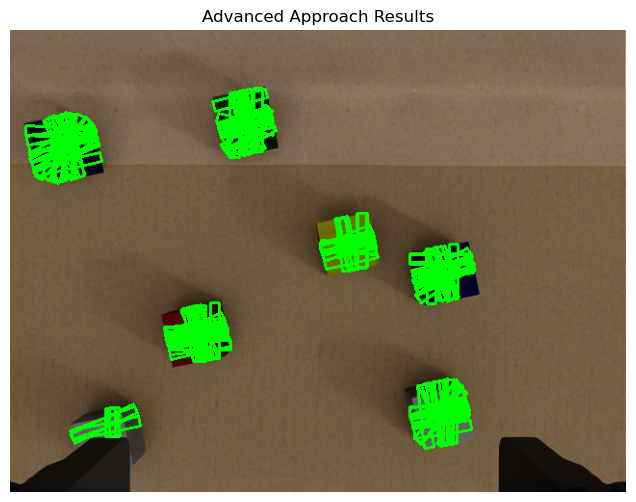


Summary Table:
Object     Morphology           Advanced            
Obj 0      Feasible             Feasible            
Obj 1      Feasible             Feasible            
Obj 2      Feasible             Feasible            
Obj 3      Feasible             Feasible            
Obj 4      Feasible             Feasible            
Obj 5      Feasible             Feasible            
Obj 6      Feasible             Feasible            

[INFO] check_and_visualize_graspability took 1.452 seconds.
[DEMO] Full code block took 1.452 seconds.



In [13]:
import time
import numpy as np
import cv2
import matplotlib.pyplot as plt

# For parallelization
from joblib import Parallel, delayed

# ==================== RAY AND CONTOUR HELPER FUNCTIONS ====================
def ray_segment_intersection(P0, d, A, B):
    """
    Compute the intersection of the ray P0 + t*d (t >= 0) with segment A->B.
    Returns (t, s, intersection_point) if intersection exists and t >= 0, 0 <= s <= 1.
    Otherwise returns None.
    """
    r = B - A
    denom = d[0]*r[1] - d[1]*r[0]
    if abs(denom) < 1e-6:
        return None
    diff = A - P0
    t = (diff[0]*r[1] - diff[1]*r[0]) / denom
    s = (diff[0]*d[1] - diff[1]*d[0]) / denom
    if t < 0 or s < 0 or s > 1:
        return None
    inter_pt = P0 + t * d
    return t, s, inter_pt


def ray_contour_intersection(P0, d, contour):
    """
    Given a ray (P0, d) and a contour (Nx2 array),
    return the intersection point on the contour closest to P0 (smallest t >= 0).
    If none found, returns None.
    """
    intersections = []
    n = len(contour)
    for i in range(n):
        A = contour[i]
        B = contour[(i+1) % n]
        res = ray_segment_intersection(P0, d, A, B)
        if res is not None:
            t, s, inter_pt = res
            intersections.append((t, inter_pt))
    if len(intersections) == 0:
        return None
    intersections.sort(key=lambda x: x[0])  # sort by param t
    return intersections[0][1]


def add_opposite_corners(corners, original_contour):
    """
    For each corner, compute the ray from the centroid in the opposite direction to that corner,
    then intersect with the original contour to get an 'opposite' point.
    If no intersection, fallback to reflection across the centroid.
    Returns an array of unique points (floats).
    """
    centroid = np.mean(corners, axis=0)
    opposites = []
    for pt in corners:
        vec = pt - centroid
        norm = np.linalg.norm(vec)
        if norm < 1e-6:
            continue
        direction = vec / norm
        d = -direction
        inter_pt = ray_contour_intersection(centroid, d, original_contour)
        if inter_pt is None:
            inter_pt = 2.0 * centroid - pt
        opposites.append(inter_pt)
    if len(opposites) == 0:
        return np.empty((0,2), dtype=np.float32)
    opposites = np.array(opposites, dtype=np.float32)
    # Remove near-duplicates by rounding
    return np.unique(np.round(opposites, 2), axis=0)


# ==================== MORPHOLOGICAL EROSION CHECK ====================
def check_gripper_feasibility_morph(
    final_mask,
    depth_cv,
    fx, fy, cx, cy,
    gripper_radius_m=0.0425,  # e.g. 42.5 mm radius => 85 mm diameter
    depth_invalid_val=0.0
):
    """
    Performs morphological erosion to check if the object can be fully eroded by a
    circular kernel approximating the gripper size.
    Returns a list of dicts with:
      'contour', 'area_pixels', 'avg_depth', 'scale_m_per_px', 'can_grip', 'eroded_mask_obj'
    """
    mask_u8 = (final_mask > 0).astype(np.uint8)
    contours, _ = cv2.findContours(mask_u8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        print("[MORPH] No objects found => returning []")
        return []

    H, W = mask_u8.shape
    results = []

    for idx, cnt in enumerate(contours):
        area_px = cv2.contourArea(cnt)
        if area_px < 2.0:
            continue

        # Build object mask
        obj_mask = np.zeros((H, W), dtype=np.uint8)
        cv2.drawContours(obj_mask, [cnt], -1, 255, -1)

        depth_vals = depth_cv[obj_mask > 0]
        depth_vals = depth_vals[np.isfinite(depth_vals)]
        depth_vals = depth_vals[depth_vals > depth_invalid_val]
        if len(depth_vals) < 5:
            continue

        depth_object = np.median(depth_vals)
        scale_m_per_px = depth_object / fx  # approximate

        # Erode with circular kernel
        gripper_diam_m = 2.0 * gripper_radius_m
        gripper_diam_px = gripper_diam_m / scale_m_per_px
        r_px = max(1, int(round(gripper_diam_px / 2.0)))
        ksize = 2*r_px + 1
        kernel = np.zeros((ksize, ksize), dtype=np.uint8)
        cv2.circle(kernel, (r_px, r_px), r_px, 1, -1)

        eroded = cv2.erode(obj_mask, kernel, iterations=1)
        can_grip = (eroded.max() == 0)

        print(f"[MORPH OBJ {idx}] area_px={area_px:.1f}, depth={depth_object:.3f}, can_grip={can_grip}")

        results.append({
            'contour'        : cnt,
            'area_pixels'    : float(area_px),
            'avg_depth'      : float(depth_object),
            'scale_m_per_px' : float(scale_m_per_px),
            'can_grip'       : can_grip,
            'eroded_mask_obj': eroded
        })

    return results


def visualize_morph_results(rgb_cv, results_list):
    """
    Overlays the morphological feasibility results:
      - Yellow fill if object is morphologically graspable,
      - Red fill if not,
      - If graspable, leftover area is marked in green,
    then shows the result with matplotlib.
    Returns the BGR image for further usage.
    """
    if rgb_cv.ndim == 3 and rgb_cv.shape[2] == 3:
        overlay_bgr = cv2.cvtColor(rgb_cv, cv2.COLOR_RGB2BGR)
    else:
        overlay_bgr = cv2.cvtColor(rgb_cv, cv2.COLOR_GRAY2BGR)

    color_yellow = (0, 255, 255)
    color_red    = (0, 0, 255)
    color_green  = (0, 255, 0)
    color_black  = (0, 0, 0)

    for obj_res in results_list:
        cnt = obj_res['contour']
        can_grip = obj_res['can_grip']
        leftover = obj_res['eroded_mask_obj']

        fill_col = color_yellow if can_grip else color_red

        cv2.drawContours(overlay_bgr, [cnt], -1, fill_col, -1)
        cv2.drawContours(overlay_bgr, [cnt], -1, color_black, 2)

        if can_grip:
            # Mark leftover in green
            idxs = (leftover > 0)
            overlay_bgr[idxs] = color_green

    out_rgb = cv2.cvtColor(overlay_bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 6))
    plt.imshow(out_rgb)
    plt.title("Morphological Erosion Results")
    plt.axis('off')
    plt.show()

    return overlay_bgr


# ==================== DEBUG DRAW FUNCTIONS ====================
def debug_show_image(title, img, size=(6, 6), show=True):
    if not show:
        return
    plt.figure(figsize=size)
    if len(img.shape) == 2:
        plt.imshow(img, cmap='gray')
    else:
        if img.shape[2] == 3:
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img_rgb)
        else:
            plt.imshow(img)
    plt.title(title)
    plt.axis('off')
    plt.show()


def debug_draw_marker(img, pt, color=(0, 255, 255), size=7, label=None):
    x, y = int(pt[0]), int(pt[1])
    cv2.drawMarker(img, (x, y), color=color,
                   markerType=cv2.MARKER_STAR,
                   markerSize=size, thickness=2, line_type=cv2.LINE_AA)
    if label:
        cv2.putText(img, label, (x+3, y-3),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    color, 1, cv2.LINE_AA)


def debug_draw_line(img, ptA, ptB, color=(255, 0, 0), thickness=2, label=None):
    xA, yA = int(ptA[0]), int(ptA[1])
    xB, yB = int(ptB[0]), int(ptB[1])
    cv2.line(img, (xA, yA), (xB, yB), color, thickness)
    if label:
        mx, my = int(0.5*(xA+xB)), int(0.5*(yA+yB))
        cv2.putText(img, label, (mx, my),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    color, 1, cv2.LINE_AA)


def debug_draw_rectangle(img, corners, color=(0, 255, 0), thickness=2, label=None):
    cI = corners.astype(int)
    for i in range(len(cI)):
        p1 = tuple(cI[i])
        p2 = tuple(cI[(i+1) % len(cI)])
        cv2.line(img, p1, p2, color, thickness)
    if label:
        px, py = cI[0][0], cI[0][1]
        cv2.putText(img, label, (px, py),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    color, 1, cv2.LINE_AA)


def debug_draw_directional_line(img, M, vx, vy, length,
                                color=(0, 0, 255), thickness=2, label=None):
    mx, my = M
    xF = mx + vx * length
    yF = my + vy * length
    cv2.line(img, (int(mx), int(my)), (int(xF), int(yF)), color, thickness)
    if label:
        cv2.putText(img, label, (int(mx), int(my)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                    color, 1, cv2.LINE_AA)


# ==================== GEOMETRY & HELPER FUNCTIONS ====================
def inside_mask(mask_u8, pt):
    x, y = int(pt[0]), int(pt[1])
    H, W = mask_u8.shape
    if x < 0 or y < 0 or x >= W or y >= H:
        return False
    return (mask_u8[y, x] > 0)


def oriented_box_corners(cx, cy, width_px, height_px, angle):
    """
    Returns an array of 4 corners for a rectangle:
      center=(cx, cy), size=(width_px x height_px), orientation=angle (radians).
    """
    w2 = width_px / 2.0
    h2 = height_px / 2.0
    pts_local = np.array([
        [-w2, -h2],
        [-w2,  h2],
        [ w2,  h2],
        [ w2, -h2]
    ], dtype=np.float32)
    c, s = np.cos(angle), np.sin(angle)
    out = []
    for px, py in pts_local:
        wx = cx + px * c - py * s
        wy = cy + px * s + py * c
        out.append((wx, wy))
    return np.array(out, dtype=np.float32)


def compute_coverage_ratio(obj_mask, corners):
    """
    Returns the fraction of rectangle area that overlaps with obj_mask>0.
    corners: Nx2 float array (rectangle corners).
    """
    if len(corners) != 4:
        return 0.0
    xs = corners[:, 0]
    ys = corners[:, 1]
    minx, maxx = int(xs.min()), int(xs.max())
    miny, maxy = int(ys.min()), int(ys.max())
    H, W = obj_mask.shape
    if minx < 0: minx = 0
    if miny < 0: miny = 0
    if maxx > W-1: maxx = W-1
    if maxy > H-1: maxy = H-1
    if minx >= maxx or miny >= maxy:
        return 0.0

    poly_mask = np.zeros((H, W), dtype=np.uint8)
    cv2.fillPoly(poly_mask, [corners.astype(np.int32)], 255)
    area_poly   = np.count_nonzero(poly_mask > 0)
    overlap_poly= np.count_nonzero((poly_mask > 0) & (obj_mask > 0))
    if area_poly < 1:
        return 0.0
    return overlap_poly / float(area_poly)


def get_leftover_components(eroded_mask_obj, eps=2.0):
    """
    Finds connected components in 'eroded_mask_obj',
    returns a list of dicts => 'mask' (uint8) and 'corners' (convex hull).
    """
    labeled = np.zeros_like(eroded_mask_obj, dtype=np.int32)
    nC, labeled, stats, centroids = cv2.connectedComponentsWithStats(eroded_mask_obj, connectivity=8)
    out = []
    for i in range(1, nC):
        area = stats[i, cv2.CC_STAT_AREA]
        if area < 2:
            continue
        cmask = (labeled == i).astype(np.uint8) * 255
        cns, _ = cv2.findContours(cmask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if not cns:
            continue
        biggest = max(cns, key=cv2.contourArea)
        approx = cv2.approxPolyDP(biggest, eps, True)
        hull = cv2.convexHull(approx)
        corners = hull.reshape(-1, 2).astype(np.float32)
        out.append({
            'mask': cmask,
            'corners': corners
        })
    return out


# -------------------- SUPPORT for ADVANCED PERP CHECK (PARALLEL) -------------------- #
def measure_perp_extent_parallel(mask_u8, Mx, My, vx, vy):
    """
    Measures how far we can extend from (Mx, My) along (vx, vy) inside mask_u8.
    Returns distance in pixels.
    """
    H, W = mask_u8.shape
    dmag = np.hypot(vx, vy)
    if dmag < 1e-9:
        return 0.0
    vxn, vyn = vx / dmag, vy / dmag
    step_size = 1.0
    t = 0.0
    while True:
        t += step_size
        x = Mx + vxn * t
        y = My + vyn * t
        ix, iy = int(round(x)), int(round(y))
        if ix < 0 or iy < 0 or ix >= W or iy >= H:
            return t - step_size
        if mask_u8[iy, ix] == 0:
            return t - step_size
        if t > 10000:
            return t


def check_one_pair(A, B, original_obj_mask, mm_per_px, finger_width_mm,
                   max_gripper_diam_mm, desired_cov=0.99):
    """
    Checks feasibility for one corner pair (A,B). Returns (feasible_bool, corners_rect, midpoint).
    """
    # Midpoint
    Mx = 0.5 * (A[0] + B[0])
    My = 0.5 * (A[1] + B[1])

    # Must be inside
    if not inside_mask(original_obj_mask, (Mx, My)):
        return (False, None, (Mx, My))

    dx, dy = (B[0] - A[0]), (B[1] - A[1])

    # Perp
    nx, ny = -dy, dx
    distUp = measure_perp_extent_parallel(original_obj_mask, Mx, My, nx, ny)
    distDn = measure_perp_extent_parallel(original_obj_mask, Mx, My, -nx, -ny)
    total_perp = distUp + distDn

    # Check max opening
    if (total_perp * mm_per_px) > max_gripper_diam_mm:
        return (False, None, (Mx, My))

    # Build rectangle => coverage check
    dmag = np.hypot(nx, ny)
    if dmag < 1e-9:
        return (False, None, (Mx, My))

    vxn, vyn = nx / dmag, ny / dmag
    new_center_x = Mx + vxn * (distUp - distDn) / 2.0
    new_center_y = My + vyn * (distUp - distDn) / 2.0

    finger_w_px  = finger_width_mm / mm_per_px
    max_g_px     = max_gripper_diam_mm /  mm_per_px
    long_side_px = min(total_perp, max_g_px)
    angle_line   = np.arctan2(dy, dx) + np.pi / 2.0

    corners_rect = oriented_box_corners(
        new_center_x, new_center_y,
        long_side_px, finger_w_px,
        angle_line
    )
    cov_main = compute_coverage_ratio(original_obj_mask, corners_rect)
    if cov_main < desired_cov:
        return (False, None, (Mx, My))

    # Check bigger rectangle (extra mm)
    extra_mm = 2.0
    extra_px = extra_mm / mm_per_px
    corners_rect_extra = oriented_box_corners(
        new_center_x, new_center_y,
        long_side_px + 2 * extra_px,
        finger_w_px,
        angle_line
    )
    cov_extra = compute_coverage_ratio(original_obj_mask, corners_rect_extra)
    extended_spills_out = (cov_extra < 0.95)
    feasible = (cov_main >= desired_cov) and extended_spills_out

    return (feasible, corners_rect, (Mx, My))


def advanced_perp_check_with_lines_parallel(
    original_obj_mask,
    leftover_obj_mask,
    scale_m_per_px,
    gripper_radius_m=0.0425,
    finger_width_mm=8.25,
    debug=False,
    show_images=False,
    skip_dist_px=10.0,
    n_jobs=-1
):
    """
    Parallel advanced approach. 
    Gathers corner pairs from leftover + original corners => check pinch feasibility.
    Returns (any_feasible, feasible_rectangles).
    """
    comps = get_leftover_components(leftover_obj_mask, eps=2.0)
    if debug:
        print(f"[ADV-PARALLEL] leftover components = {len(comps)}")

    cns, _ = cv2.findContours(original_obj_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    original_contour = None
    if cns:
        original_contour = max(cns, key=cv2.contourArea).reshape(-1,2).astype(np.float32)

    # corners from original hull
    original_corners = []
    if cns:
        biggest = max(cns, key=cv2.contourArea)
        approxO = cv2.approxPolyDP(biggest, 2.0, True)
        hullO   = cv2.convexHull(approxO)
        original_corners = hullO.reshape(-1, 2).astype(np.float32)

    # Opposite corners if possible
    if original_contour is not None and len(original_corners) > 0:
        extra = add_opposite_corners(original_corners, original_contour)
        original_corners = np.vstack([original_corners, extra])

    leftover_all = []
    for cID, cData in enumerate(comps):
        leftover_all.append((cID, cData['corners']))
    leftover_all.append((-1, original_corners))

    mm_per_px = scale_m_per_px * 1000.0
    max_gripper_diam_mm = gripper_radius_m * 2.0 * 1000.0

    pair_list = []
    for i in range(len(leftover_all)):
        cIDi, cornersI = leftover_all[i]
        for j in range(i, len(leftover_all)):
            cIDj, cornersJ = leftover_all[j]
            for idxA, A in enumerate(cornersI):
                for idxB, B in enumerate(cornersJ):
                    if (i == j) and (idxB <= idxA):
                        continue
                    pair_list.append((A, B))

    results = Parallel(n_jobs=n_jobs, batch_size=64, backend='loky')(
        delayed(check_one_pair)(
            A, B, original_obj_mask, mm_per_px, finger_width_mm,
            max_gripper_diam_mm
        )
        for (A,B) in pair_list
    )

    feasible_rectangles = []
    feasible_midpoints  = []
    any_feasible = False

    for (feasible, corners_rect, (mx,my)) in results:
        if not feasible:
            continue

        # skip duplicates if midpoint near an existing one
        skip_it = False
        for fm in feasible_midpoints:
            dx = mx - fm[0]
            dy = my - fm[1]
            if (dx*dx + dy*dy) < (skip_dist_px*skip_dist_px):
                skip_it = True
                break

        if not skip_it:
            feasible_midpoints.append((mx, my))
            feasible_rectangles.append(corners_rect)

    if len(feasible_rectangles) > 0:
        any_feasible = True

    if debug:
        print(f"[ADV-PARALLEL] final feasible_rectangles = {len(feasible_rectangles)}")

    if debug and show_images:
        base_dbg = cv2.normalize(original_obj_mask, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        base_dbg = cv2.cvtColor(base_dbg, cv2.COLOR_GRAY2BGR)
        for cID, cData in enumerate(comps):
            for i, pt in enumerate(cData['corners']):
                debug_draw_marker(base_dbg, pt, (0, 255, 255), label=f"L{cID}_{i}")
        for i, pt in enumerate(original_corners):
            debug_draw_marker(base_dbg, pt, (255, 255, 0), label=f"O{i}")

        for i, rect in enumerate(feasible_rectangles):
            debug_draw_rectangle(base_dbg, rect, color=(0,255,0), thickness=2, label=f"R{i}")

        debug_show_image("[ADV-PARALLEL] leftover + feasible rects", base_dbg, (7,7), True)

    return (any_feasible, feasible_rectangles)


def advanced_perp_check_with_lines(
    original_obj_mask,
    leftover_obj_mask,
    scale_m_per_px,
    gripper_radius_m=0.0425,
    finger_width_mm=8.25,
    debug=False,
    show_images=False
):
    """
    Single-thread approach for reference.
    """
    feasible_rectangles = []
    comps = get_leftover_components(leftover_obj_mask, eps=2.0)

    if debug:
        print(f"[ADV] Found leftover components: {len(comps)}")

    cns, _ = cv2.findContours(original_obj_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    original_contour = None
    if cns:
        original_contour = max(cns, key=cv2.contourArea).reshape(-1,2).astype(np.float32)

    original_corners = []
    if cns:
        biggest = max(cns, key=cv2.contourArea)
        approxO = cv2.approxPolyDP(biggest, 2.0, True)
        hullO   = cv2.convexHull(approxO)
        original_corners = hullO.reshape(-1,2).astype(np.float32)

    if original_contour is not None and len(original_corners) > 0:
        extra = add_opposite_corners(original_corners, original_contour)
        original_corners = np.vstack([original_corners, extra])

    mm_per_px = scale_m_per_px * 1000.0
    max_gripper_diam_mm = gripper_radius_m * 2.0 * 1000.0
    any_feasible = False

    leftover_all = []
    for cID, cData in enumerate(comps):
        leftover_all.append((cID, cData['corners']))
    leftover_all.append((-1, original_corners))

    def measure_perp_extent(Mx, My, vx, vy):
        H, W = original_obj_mask.shape
        dmag = np.hypot(vx, vy)
        if dmag < 1e-9:
            return 0.0
        vxn, vyn = vx / dmag, vy / dmag
        step_size = 1.0
        t = 0.0
        while True:
            t += step_size
            x = Mx + vxn * t
            y = My + vyn * t
            ix, iy = int(round(x)), int(round(y))
            if ix < 0 or iy < 0 or ix >= W or iy >= H:
                return t - step_size
            if original_obj_mask[iy, ix] == 0:
                return t - step_size
            if t > 10000:
                return t

    desired_cov = 0.99

    for i in range(len(leftover_all)):
        cIDi, cornersI = leftover_all[i]
        for j in range(i, len(leftover_all)):
            cIDj, cornersJ = leftover_all[j]
            for idxA, A in enumerate(cornersI):
                for idxB, B in enumerate(cornersJ):
                    if (i == j) and (idxB <= idxA):
                        continue

                    Mx = 0.5*(A[0]+B[0])
                    My = 0.5*(A[1]+B[1])
                    if not inside_mask(original_obj_mask, (Mx, My)):
                        continue
                    dx, dy = (B[0]-A[0]), (B[1]-A[1])

                    nx, ny = -dy, dx
                    distUp = measure_perp_extent(Mx, My, nx, ny)
                    distDn = measure_perp_extent(Mx, My, -nx, -ny)
                    total_perp = distUp + distDn
                    if (total_perp * mm_per_px) > max_gripper_diam_mm:
                        continue

                    dmag = np.hypot(nx, ny)
                    if dmag < 1e-9:
                        continue

                    vxn, vyn = nx / dmag, ny / dmag
                    new_center_x = Mx + vxn*(distUp-distDn)/2.0
                    new_center_y = My + vyn*(distUp-distDn)/2.0
                    finger_w_px = finger_width_mm / mm_per_px
                    max_g_px    = max_gripper_diam_mm / mm_per_px
                    long_side_px= min(total_perp, max_g_px)
                    angle_line  = np.arctan2(dy, dx) + np.pi/2.0

                    corners_rect = oriented_box_corners(
                        new_center_x, new_center_y,
                        long_side_px, finger_w_px,
                        angle_line
                    )
                    cov = compute_coverage_ratio(original_obj_mask, corners_rect)
                    if cov >= desired_cov:
                        any_feasible = True
                        feasible_rectangles.append(corners_rect)

    return any_feasible, feasible_rectangles


# ==================== COMBINED USAGE EXAMPLE ====================
def check_and_visualize_graspability(
    eroded_mask,
    depth_cv,
    rgb_cv,
    fx, fy, cx, cy,
    gripper_diam_mm=85.0,
    finger_width_mm=8.25,
    debug=True,
    show_images=False,
    show_other_results=True,
    use_parallel_adv=True,
    skip_dist_px=10.0,
    n_jobs=-1
):
    """
    1) Morphological approach => morphological_mask
    2) Visualize morphological results
    3) For each object => advanced approach => advanced_object_mask
    4) All feasible rectangles => advanced_rectangles_mask
    5) Print summary table and measure runtime
    Returns (morphological_mask, advanced_object_mask, advanced_rectangles_mask)
    """
    start_time = time.time()

    if eroded_mask is None:
        print("[INFO] Missing 'eroded_mask'. Exiting.")
        return None, None, None

    H, W = eroded_mask.shape

    # Convert diameter mm => radius m
    gripper_radius_m = (gripper_diam_mm / 1000.0) / 2.0

    # ---- 1) Morphological approach
    results_morph = check_gripper_feasibility_morph(
        # final_mask       = fastsam_mask,
        final_mask       = eroded_mask,
        depth_cv         = depth_cv,
        fx               = fx,
        fy               = fy,
        cx               = cx,
        cy               = cy,
        gripper_radius_m = gripper_radius_m,
        depth_invalid_val= 0.0
    )

    # morphological_mask => 1 where can_grip is True
    morphological_mask = np.zeros((H, W), dtype=np.uint8)
    for obj_res in results_morph:
        if obj_res['can_grip']:
            cv2.drawContours(morphological_mask, [obj_res['contour']], -1, 1, -1)

    # ---- 2) Visualize morphological results
    if show_other_results:
        visualize_morph_results(rgb_cv, results_morph)

    # ---- 3) Advanced approach
    feasible_rects_all = []
    advanced_object_mask = np.zeros((H, W), dtype=np.uint8)

    for idx, obj_res in enumerate(results_morph):
        # Create leftover mask from morphological approach
        leftover_obj_mask = (obj_res['eroded_mask_obj'] > 0).astype(np.uint8) * 255
        original_obj_mask = np.zeros((H, W), dtype=np.uint8)
        cv2.drawContours(original_obj_mask, [obj_res['contour']], -1, 255, -1)

        scale_m_per_px = obj_res['scale_m_per_px']

        if debug:
            print(f"\n[ADV] Checking object {idx} with advanced approach. shape=({H}x{W})")

        if use_parallel_adv:
            adv_feasible, rects = advanced_perp_check_with_lines_parallel(
                original_obj_mask = original_obj_mask,
                leftover_obj_mask = leftover_obj_mask,
                scale_m_per_px    = scale_m_per_px,
                gripper_radius_m  = gripper_radius_m,
                finger_width_mm   = finger_width_mm,
                debug             = debug,
                show_images       = show_images,
                skip_dist_px      = skip_dist_px,
                n_jobs            = n_jobs
            )
        else:
            adv_feasible, rects = advanced_perp_check_with_lines(
                original_obj_mask = original_obj_mask,
                leftover_obj_mask = leftover_obj_mask,
                scale_m_per_px    = scale_m_per_px,
                gripper_radius_m  = gripper_radius_m,
                finger_width_mm   = finger_width_mm,
                debug             = debug,
                show_images       = show_images
            )

        # Store whether advanced was feasible for this object
        obj_res["adv_feasible"] = adv_feasible

        if adv_feasible:
            # fill entire object region
            cv2.drawContours(advanced_object_mask, [obj_res['contour']], -1, 1, -1)

        feasible_rects_all.extend(rects)

    # ---- 4) advanced_rectangles_mask
    advanced_rectangles_mask = np.zeros((H, W), dtype=np.uint8)
    for rect in feasible_rects_all:
        corners_int = rect.astype(np.int32)
        cv2.fillPoly(advanced_rectangles_mask, [corners_int], 1)

    # (Optional) visualize feasible rectangles in color
    if show_other_results:
        final_img_bgr = rgb_cv.copy()
        if final_img_bgr.ndim == 2:
            final_img_bgr = cv2.cvtColor(final_img_bgr, cv2.COLOR_GRAY2BGR)
        else:
            final_img_bgr = cv2.cvtColor(final_img_bgr, cv2.COLOR_RGB2BGR)

        for rect in feasible_rects_all:
            debug_draw_rectangle(final_img_bgr, rect, color=(0,255,0), thickness=2)

        final_img_rgb = cv2.cvtColor(final_img_bgr, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(8,6))
        plt.imshow(final_img_rgb)
        plt.title("Advanced Approach Results")
        plt.axis('off')
        plt.show()

    # ---- 5) Print summary table
    print("\nSummary Table:")
    print("{:<10} {:<20} {:<20}".format("Object", "Morphology", "Advanced"))
    for i, obj in enumerate(results_morph):
        morph_status = "Feasible" if obj["can_grip"] else "Not Feasible"
        adv_status   = "Feasible" if obj.get("adv_feasible", False) else "Not Feasible"
        print("{:<10} {:<20} {:<20}".format(f"Obj {i}", morph_status, adv_status))

    end_time = time.time()
    print(f"\n[INFO] check_and_visualize_graspability took {end_time - start_time:.3f} seconds.")

    # Return the three masks for subsequent usage:
    return morphological_mask, advanced_object_mask, advanced_rectangles_mask


# --------------- EXAMPLE USAGE ---------------
if 'eroded_mask' in globals():
    # Suppose you have eroded_mask, depth_cv, rgb_cv, fx, fy, cx, cy, etc.
    start_time_demo = time.time()

    morph_mask, adv_obj_mask, adv_rect_mask = check_and_visualize_graspability(
        eroded_mask         = eroded_mask,
        depth_cv            = depth_cv,
        rgb_cv              = rgb_cv,
        fx                  = fx,
        fy                  = fy,
        cx                  = cx,
        cy                  = cy,
        gripper_diam_mm     = 85.0,
        finger_width_mm     = 8.25,
        debug               = True,
        show_images         = True,
        show_other_results  = True,
        use_parallel_adv    = True,
        skip_dist_px        = 1.0,
        n_jobs              = 4
    )

    end_time_demo = time.time()
    print(f"[DEMO] Full code block took {(end_time_demo - start_time_demo):.3f} seconds.\n")

    # morph_mask, adv_obj_mask, adv_rect_mask are now available
else:
    print("[INFO] 'eroded_mask' not in globals => skipping example usage.")


# Initial Proability Guesses

[Reproject step] => 1.246s


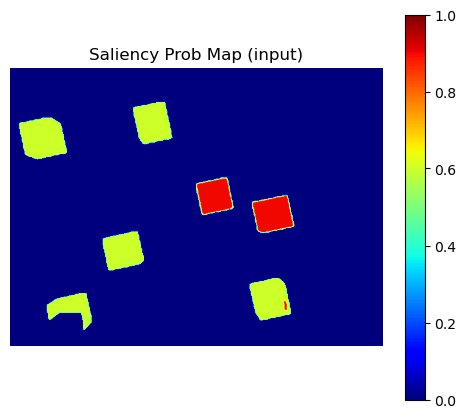

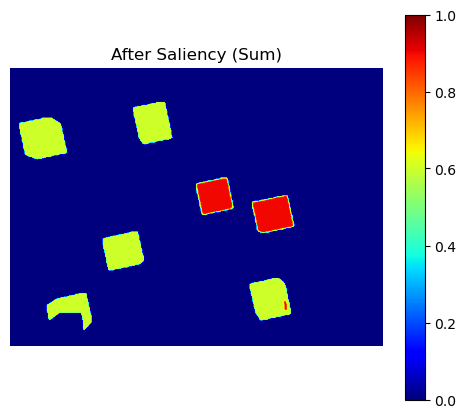

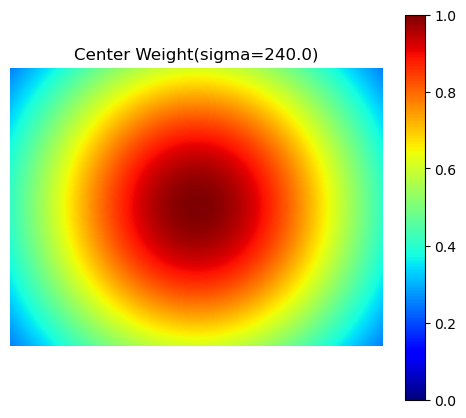

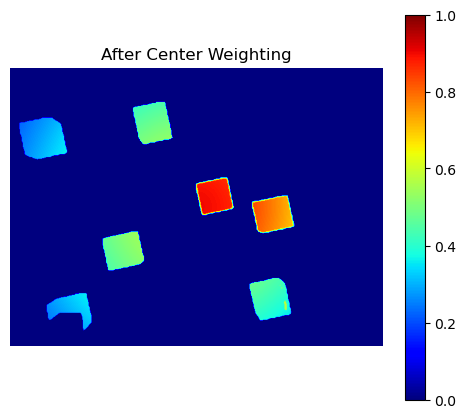

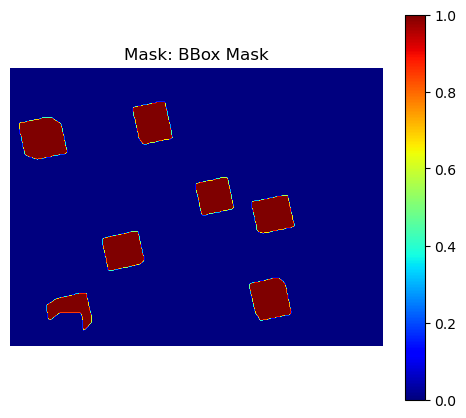

...

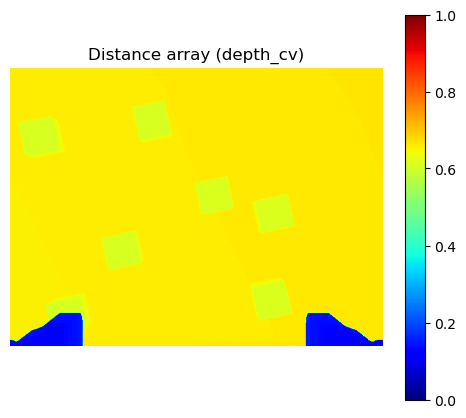

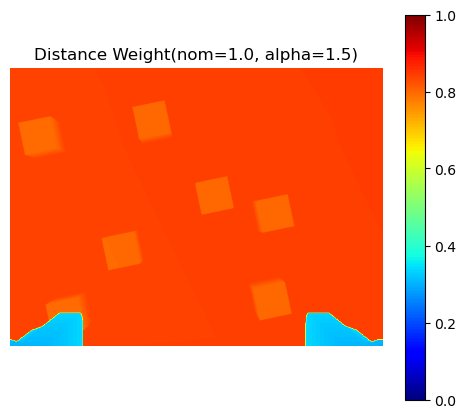

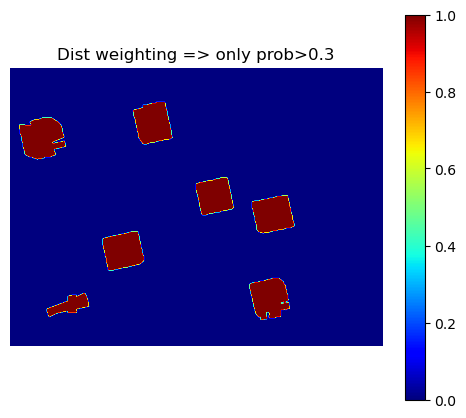

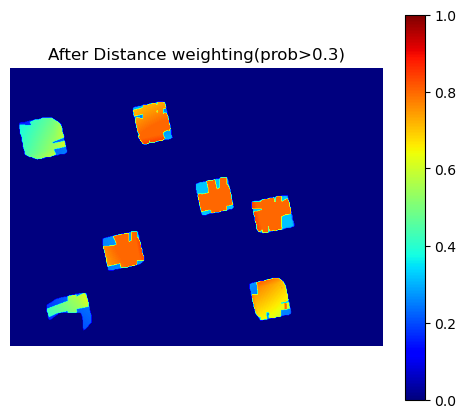

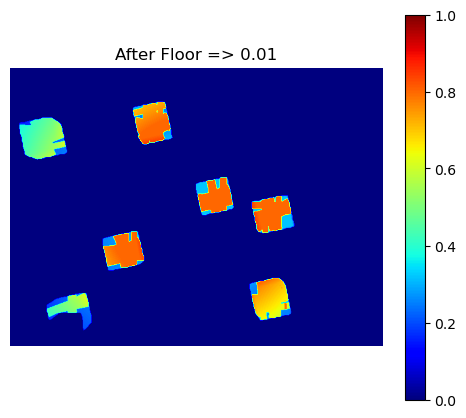

[final_fusion_pipeline] TOT => 0.735s
[final_fusion_pipeline] => 0.735s


Widget(value='<iframe src="http://localhost:38973/index.html?ui=P_0x7d7ca601e2c0_2&reconnect=auto" class="pyvi…

Widget(value='<iframe src="http://localhost:38973/index.html?ui=P_0x7d7ca60b74c0_3&reconnect=auto" class="pyvi…

[Threshold step] => 0.365s
[do_final_fusion_and_display] => TOT => 2.729s


In [14]:
import numpy as np
import matplotlib.pyplot as plt
import pyvista as pv
import time
import cv2
from collections import defaultdict
import struct

###########################################################
# BFS + transform code (unchanged logic)
###########################################################
def transform_to_4x4(ts):
    """
    Convert geometry_msgs/TransformStamped => 4x4 matrix
    """
    def quat_to_matrix(x, y, z, w):
        xx = x*x; yy = y*y; zz = z*z
        xy = x*y; xz = x*z; yz = y*z
        xw = x*w; yw = y*w; zw = z*w
        return np.array([
            [1 - 2*(yy+zz),   2*(xy-zw),     2*(xz+yw)],
            [2*(xy+zw),       1 - 2*(xx+zz), 2*(yz-xw)],
            [2*(xz-yw),       2*(yz+xw),     1 - 2*(xx+yy)]
        ], dtype=np.float32)

    t = ts.transform.translation
    r = ts.transform.rotation
    R = quat_to_matrix(r.x, r.y, r.z, r.w)
    M = np.eye(4, dtype=np.float32)
    M[:3,:3] = R
    M[0,3],M[1,3],M[2,3] = t.x, t.y, t.z
    return M

def build_tf_times(all_tf_data):
    from collections import defaultdict
    tf_dict = defaultdict(list)
    for (t_s, tfmsg) in all_tf_data:
        for trans_stamped in tfmsg.transforms:
            p = trans_stamped.header.frame_id
            c = trans_stamped.child_frame_id
            M = transform_to_4x4(trans_stamped)
            tf_dict[(p,c)].append((t_s, M))
    for k in tf_dict:
        tf_dict[k].sort(key=lambda x: x[0])
    return tf_dict

def pick_closest_transform(trans_list, t_img):
    if not trans_list:
        return None
    best = None
    best_dt = float('inf')
    for (tf_time, M) in trans_list:
        dt = abs(tf_time - t_img)
        if dt<best_dt:
            best_dt = dt
            best = M
    return best

def build_snapshot_graph(tf_dict, t_img):
    from collections import defaultdict
    snap = defaultdict(dict)
    for (p,c), arr in tf_dict.items():
        M = pick_closest_transform(arr, t_img)
        if M is None:
            continue
        snap[p][c] = M
        snap[c][p] = np.linalg.inv(M)
    return snap

def find_transform_path(snap, source_frame, target_frame):
    from collections import deque
    if source_frame not in snap or target_frame not in snap:
        return None, None
    visited = set([source_frame])
    queue = deque()
    queue.append((source_frame, np.eye(4, dtype=np.float32), [source_frame]))
    while queue:
        fr, Tmat, path = queue.popleft()
        if fr==target_frame:
            return path, Tmat
        for neigh, M_edge in snap[fr].items():
            if neigh not in visited:
                visited.add(neigh)
                T_new = Tmat @ M_edge
                queue.append((neigh, T_new, path+[neigh]))
    return None, None

def transform_points(M, points):
    """
    Nx3 => Nx3
    """
    if len(points)==0:
        return points
    arr = np.hstack([points, np.ones((len(points),1), dtype=np.float32)])
    out = (M @ arr.T).T
    valid = (np.abs(out[:,3])>1e-9)
    out[valid,:3] /= out[valid,3:4]
    return out[:,:3]

###########################################################
# Depth reproject => Nx3
###########################################################
def depth_msg_to_cv2(depth_msg):
    h,w = depth_msg.height, depth_msg.width
    arr = np.frombuffer(depth_msg.data, dtype=np.float32)
    if len(arr)!=(h*w):
        print("[ERR] mismatch => None")
        return None
    return arr.reshape((h,w))

def reproject_all_depth(depth_img, fx, fy, cx, cy):
    H,W = depth_img.shape
    out = np.zeros((H*W, 3), dtype=np.float32)
    idx=0
    for v in range(H):
        for u in range(W):
            z = depth_img[v,u]
            if np.isfinite(z) and z>0:
                X = (u - cx)/fx * z
                Y = (v - cy)/fy * z
                out[idx] = [X,Y,z]
            else:
                out[idx] = [np.nan, np.nan, np.nan]
            idx+=1
    return out

def create_unfiltered_cloud(
    all_data,
    depth_topic="/resulting_depth_image",
    caminfo_topic="/camera_manipulator/camera_info",
    source_frame="camera_manipulator_sub",
    target_frame="base_link",
    do_forced_flip=False
):
    # tf_data = all_data.get("/tf", []) + all_data.get("/tf_static", [])
    tf_data = all_data.get("/tf", [])
    if not tf_data:
        print("[ERR] no TF => None")
        return None,(0,0),None
    tf_dict = build_tf_times(tf_data)

    depth_data = all_data.get(depth_topic, [])
    if not depth_data:
        print("[ERR] no depth => None")
        return None,(0,0),None
    (t_s, depth_msg) = depth_data[0]
    depth_cv = depth_msg_to_cv2(depth_msg)
    if depth_cv is None:
        return None,(0,0),None
    H,W = depth_cv.shape

    caminfo_data = all_data.get(caminfo_topic, [])
    if not caminfo_data:
        print("[ERR] no caminfo => None")
        return None,(0,0),None
    (_, caminfo_msg) = caminfo_data[0]
    K = caminfo_msg.k
    fx, cx = K[0], K[2]
    fy, cy = K[4], K[5]

    reprojected_cam = reproject_all_depth(depth_cv, fx, fy, cx, cy)

    snap = build_snapshot_graph(tf_dict, t_s)
    path, M_cam2target = find_transform_path(snap, source_frame, target_frame)
    if M_cam2target is None:
        print("[WARN] BFS not found => returning camera coords Nx3")
        cloud_out = reprojected_cam
    else:
        cloud_out = transform_points(M_cam2target, reprojected_cam)

    if do_forced_flip:
        cloud_out[:,0] = -cloud_out[:,0]
        cloud_out[:,2] = -cloud_out[:,2]

    return cloud_out,(H,W), depth_cv


###########################################################
# 2D display helper
###########################################################
def show_2d(title, arr2d, vmin=0.0, vmax=1.0, cmap='jet'):
    plt.figure(figsize=(6,5))
    plt.title(title)
    cax = plt.imshow(arr2d, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(cax)
    plt.axis('off')
    plt.show()

###########################################################
# center weighting & distance weighting
###########################################################
def build_center_weight(H, W, sigma):
    """
    w_center = exp( -(dist^2)/(2*sigma^2) )
    smaller sigma => narrower center
    """
    y_indices, x_indices = np.indices((H,W))
    xc = (W-1)/2
    yc = (H-1)/2
    dist2 = (x_indices - xc)**2 + (y_indices - yc)**2
    return np.exp(-dist2/(2.0*sigma*sigma))

def build_distance_weight(distance_2d, nominal=1.0, alpha=1.0):
    """
    w_dist = exp( - alpha*(distance - nominal)^2 )
    ignoring invalid => 0
    """
    w = np.exp(-alpha*((distance_2d - nominal)**2))
    w[~np.isfinite(distance_2d)] = 0.0
    return w

###########################################################
# final_fusion_pipeline
###########################################################
def final_fusion_pipeline(
    # user-named masks
    saliency_prob_map,  # shape(H,W)
    bbox_mask,
    morph_mask,
    adv_obj_mask,
    adv_rect_mask,
    depth_cv,  # shape(H,W) => your "distance" array
    # factors
    included_factor=1.3,
    excluded_factor=0.7,
    # center
    sigma_center=100.0,
    # distance weighting
    distance_nominal=1.0,
    distance_alpha=1.5,
    distance_threshold=0.3,  # only apply if prob>0.3
    # floor
    floor_value=0.01,
    show_intermediate=True
):
    """
    Steps:
      1) current=0 => current += saliency_prob_map => clamp => show
      2) center weighting => multiply => show
      3) bounding box => multiply approach => if bbox>0 => *included_factor else => *excluded_factor
      4) morph => same
      5) adv_obj => same
      6) adv_rect => same
      7) distance weighting => only if prob>distance_threshold => multiply => show
      8) floor => 0.01 => show
      return final
    """

    start_time = time.time()

    # Step 1) sum approach => current=0, current += saliency_prob_map
    H,W = saliency_prob_map.shape
    current = np.zeros((H,W), dtype=np.float32)

    if show_intermediate:
        show_2d("Saliency Prob Map (input)", saliency_prob_map)

    sum_arr = current + saliency_prob_map
    np.clip(sum_arr, 0.0, 1.0, out=sum_arr)
    current = sum_arr
    if show_intermediate:
        show_2d("After Saliency (Sum)", current)

    # Step 2) center weighting => multiply
    center_w = build_center_weight(H,W,sigma_center)
    cRes = current*center_w
    np.clip(cRes, 0.0,1.0, out=cRes)
    current = cRes
    if show_intermediate:
        show_2d(f"Center Weight(sigma={sigma_center})", center_w)
        show_2d("After Center Weighting", current)

    def multiply_mask(label, current, mask2d):
        # if mask2d>0 => * included_factor else => *excluded_factor
        if show_intermediate:
            show_2d(f"Mask: {label}", mask2d)

        out = current.copy()
        included = (mask2d>0)
        excluded = ~included
        out[included] *= included_factor
        out[excluded] *= excluded_factor
        np.clip(out,0.0,1.0,out=out)

        if show_intermediate:
            show_2d(f"After {label} multiply approach", out)
        return out

    # Step 3) bounding box => multiply
    current = multiply_mask("BBox Mask", current, bbox_mask)
    # Step 4) morph
    current = multiply_mask("Morph Mask", current, morph_mask)
    # Step 5) adv_obj
    current = multiply_mask("Adv Obj Mask", current, adv_obj_mask)
    # Step 6) adv_rect
    current = multiply_mask("Adv Rect Mask", current, adv_rect_mask)

    # Step 7) distance weighting => only if prob>distance_threshold => multiply
    dist_w = build_distance_weight(depth_cv, nominal=distance_nominal, alpha=distance_alpha)
    # mask => (current> distance_threshold)
    maskDist = (current>distance_threshold)

    if show_intermediate:
        show_2d("Distance array (depth_cv)", depth_cv)
        show_2d(f"Distance Weight(nom={distance_nominal}, alpha={distance_alpha})", dist_w)
        temp_m = np.zeros_like(current)
        temp_m[maskDist] = 1.0
        show_2d(f"Dist weighting => only prob>{distance_threshold}", temp_m)

    outD = current.copy()
    outD[maskDist] *= dist_w[maskDist]
    np.clip(outD,0.0,1.0,out=outD)

    if show_intermediate:
        show_2d(f"After Distance weighting(prob>{distance_threshold})", outD)
    current = outD

    # Step 8) floor => 0.01 => if pixel>0 => clamp => show
    floorA = current.copy()
    pos = (floorA>0)
    floorA[pos] = np.maximum(floorA[pos], floor_value)
    np.clip(floorA,0.0,1.0,out=floorA)
    if show_intermediate:
        show_2d(f"After Floor => {floor_value}", floorA)

    end_time = time.time()
    print(f"[final_fusion_pipeline] TOT => {(end_time - start_time):.3f}s")
    return floorA


###########################################################
# do_final_fusion_and_display => main
###########################################################
def do_final_fusion_and_display(
    # from bag
    all_data,
    # EXACT user-named variables
    saliency_prob_map,  # 1) sum approach
    bbox_mask,          # multiply approach
    morph_mask,
    adv_obj_mask,
    adv_rect_mask,
    depth_cv,           # used for distance weighting
    # BFS frames
    source_frame="camera_manipulator_sub",
    target_frame="base_link",
    do_forced_flip=False,
    # factors
    included_factor=1.3,
    excluded_factor=0.7,
    sigma_center=100.0,
    distance_nominal=1.0,
    distance_alpha=1.5,
    distance_threshold=0.3,
    floor_value=0.01,
    threshold_prob=0.01,
    show_intermediate=True,
    show_3d=True,
    pyvista_notebook=False
):
    """
    1) Reproject Nx3 => no filtering
    2) final_fusion_pipeline => final2d with your specific order:
       - sum sal => center => multiply approach(bbox,morph,adv_obj,adv_rect)
         => distance weighting(prob>0.3) => floor=0.01
    3) flatten => attach => threshold => show 3D
    returns (cloud, final2d)
    """
    t0 = time.time()

    # A) reproject
    stA = time.time()
    cloud_full,(H,W), depth_local = create_unfiltered_cloud(
        all_data,
        source_frame=source_frame,
        target_frame=target_frame,
        do_forced_flip=do_forced_flip
    )
    etA = time.time()
    print(f"[Reproject step] => {(etA - stA):.3f}s")

    if cloud_full is None:
        print("[ERR] no cloud => abort.")
        return None,None

    # partial shape
    def partial_crop(arr2d):
        hh = min(H, arr2d.shape[0])
        ww = min(W, arr2d.shape[1])
        return arr2d[:hh,:ww]

    # ensure all have shape <=(H,W)
    sal2d  = partial_crop(saliency_prob_map)
    bbx2d  = partial_crop(bbox_mask)
    mrp2d  = partial_crop(morph_mask)
    obj2d  = partial_crop(adv_obj_mask)
    rct2d  = partial_crop(adv_rect_mask)
    dep2d  = partial_crop(depth_cv)  # user passing "depth_cv" as distance

    # B) final pipeline
    stB = time.time()
    final_2d = final_fusion_pipeline(
        saliency_prob_map = sal2d,
        bbox_mask         = bbx2d,
        morph_mask        = mrp2d,
        adv_obj_mask      = obj2d,
        adv_rect_mask     = rct2d,
        depth_cv          = dep2d,
        included_factor   = included_factor,
        excluded_factor   = excluded_factor,
        sigma_center      = sigma_center,
        distance_nominal  = distance_nominal,
        distance_alpha    = distance_alpha,
        distance_threshold= distance_threshold,
        floor_value       = floor_value,
        show_intermediate = show_intermediate
    )
    etB = time.time()
    print(f"[final_fusion_pipeline] => {(etB - stB):.3f}s")

    hh,ww= final_2d.shape
    n_mask= hh*ww
    n_cloud= len(cloud_full)
    min_len= min(n_mask, n_cloud)
    final_flat= final_2d.ravel()[:min_len]
    sub_cloud = cloud_full[:min_len]

    # C) optional 3D
    if show_3d:
        # entire
        pA = pv.PolyData(sub_cloud)
        pA["prob"] = final_flat
        plotA = pv.Plotter(notebook=pyvista_notebook)
        plotA.add_mesh(pA, scalars="prob", show_scalar_bar=True)
        plotA.add_text("3D unthresholded", font_size=12)
        plotA.show()

        # threshold => threshold_prob => 0.01
        stT = time.time()
        keep = (final_flat>=threshold_prob) & ~np.isnan(sub_cloud[:,0]) & ~np.isnan(sub_cloud[:,1]) & ~np.isnan(sub_cloud[:,2])
        sub_pts  = sub_cloud[keep]
        sub_prob = final_flat[keep]
        pB = pv.PolyData(sub_pts)
        pB["prob"] = sub_prob
        plotB = pv.Plotter(notebook=pyvista_notebook)
        plotB.add_mesh(pB, scalars="prob", show_scalar_bar=True)
        plotB.add_text(f"3D threshold >= {threshold_prob}", font_size=12)
        plotB.show()
        etT = time.time()
        print(f"[Threshold step] => {(etT - stT):.3f}s")

    t1 = time.time()
    print(f"[do_final_fusion_and_display] => TOT => {(t1 - t0):.3f}s")

    return cloud_full, final_2d


###########################################################
# Example usage
###########################################################
# Suppose you have:
#   all_data => from your ROS bag read
#   saliency_prob_map => shape(H,W)   # sum approach first
#   bbox_mask, morph_mask, adv_obj_mask, adv_rect_mask => shape(H,W) # multiply approach
#   depth_cv => shape(H,W), used as "distance"
#
# Then do:
#
cloud_full, final2d = do_final_fusion_and_display(
    all_data,
    saliency_prob_map = saliency_prob_map,
    bbox_mask     = bbox_mask,
    morph_mask    = morph_mask,
    adv_obj_mask  = adv_obj_mask,
    adv_rect_mask = adv_rect_mask,
    depth_cv      = depth_cv,
    source_frame  = "base_link",
    target_frame  = "base_link",
    do_forced_flip= False,
    included_factor=1.2,
    excluded_factor=0.4,
    sigma_center=240.0,
    distance_nominal=1.0,
    distance_alpha=1.5,
    distance_threshold=0.3,
    floor_value=0.01,
    threshold_prob=0.05,
    show_intermediate=True,
    show_3d=True,
    pyvista_notebook=True
)
#
# Explanation:
#   1) current=0 => sum sal => clamp => display
#   2) multiply center weighting => display
#   3) masks(bbox,morph,adv_obj,adv_rect) => multiply approach => included =>*1.3, excluded=>*0.7 => display each
#   4) distance weighting => only if prob>0.3 => multiply => display
#   5) floor => 0.01 => display
#   6) flatten => show Nx3 => threshold(prob>=0.01) => final


# Probability Normalizartion

[INFO] Building label map: threshold=0.01, min_size=10, otsu_below=0.1
[INFO] → 7 objects


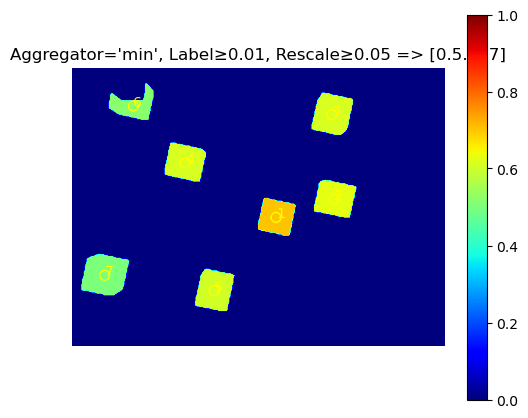

Widget(value='<iframe src="http://localhost:38973/index.html?ui=P_0x7d7c76088e20_4&reconnect=auto" class="pyvi…


--- Shapes ---
obj_label_map   : (480, 640)
aggregator_2d   : (480, 640)
final2d_map     : (480, 640)
final3d_cloud_full   : (307200, 3)
final3d_probs_full   : (307200,)
final3d_cloud_subset : (25243, 3)
final3d_probs_subset : (25243,)

--- Some Sample Values ---
final2d_map:
 [[          0           0           0 ...           0           0           0]
 [          0           0           0 ...           0           0           0]
 [          0           0           0 ...           0           0           0]
 ...
 [          0           0           0 ...           0           0           0]
 [          0           0           0 ...           0           0           0]
 [          0           0           0 ...           0           0           0]]
final3d_probs_full:
 [[        nan         nan         nan ...         nan         nan         nan]
 [        nan         nan         nan ...         nan         nan         nan]
 [        nan         nan         nan ...         nan         

In [15]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pyvista as pv

###############################################################################
# 1) Build an object label map by thresholding + connectedComponents (+ Otsu)
###############################################################################
def build_obj_label_map_from_saliency(
    saliency_map,
    threshold=0.05,
    connectivity=8,
    min_size=20,
    otsu_apply_below=0.30          # ← NEW PARAM
):
    """
    1) Threshold saliency_map => binary foreground ( > threshold => 1).
    2) Use connectedComponents to label each region => label_map.
    3) Remove tiny components (size < min_size), re-label => label=1..N
       label=0 => background
    4) NEW: for every remaining blob, look only at pixels whose probability
       is below `otsu_apply_below`; run Otsu on that subset.  Pixels below the
       blob-specific Otsu split are cleared so low-probability halos cannot
       connect brighter blobs.
    """
    bin_map = (saliency_map > threshold).astype(np.uint8)
    num_labels, label_map = cv2.connectedComponents(bin_map, connectivity=connectivity)
    if num_labels <= 1:
        return label_map
    
    # Remove small components
    for label_id in range(1, num_labels):
        mask = (label_map == label_id)
        if np.count_nonzero(mask) < min_size:
            label_map[mask] = 0
    
    # -------- per-blob Otsu only on low-probability pixels -------------------
    for label_id in range(1, label_map.max() + 1):
        blob_mask = (label_map == label_id)
        if not blob_mask.any():
            continue
        
        low_band = blob_mask & (saliency_map < otsu_apply_below)
        if np.count_nonzero(low_band) < 3:           # need a few samples
            continue
        
        vals_uint8 = (saliency_map[low_band] * 255).astype(np.uint8)
        otsu_val, _ = cv2.threshold(vals_uint8, 0, 255,
                                    cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        otsu_thr = otsu_val / 255.0
        
        # clear only low-band pixels that are below Otsu threshold
        label_map[low_band & (saliency_map < otsu_thr)] = 0
    # ------------------------------------------------------------------------

    # Re-label => contiguous 1..N
    _, relabeled_map = cv2.connectedComponents(
        (label_map > 0).astype(np.uint8), connectivity=connectivity
    )
    return relabeled_map


###############################################################################
# 2) Assign aggregator value (mean, median, max, min, or custom) to each object
###############################################################################
def assign_obj_value_to_objects(
    obj_label_map,
    saliency_map,
    aggregator='mean'
):
    """
    aggregator can be a string in {'mean','median','max','min'} or a custom callable.
    
    Returns:
      aggregator_2d: shape (H,W) - each object's pixels replaced by aggregator(object_pixels).
      object_vals  : a list of (object_id, aggregator_value), sorted descending by aggregator_value.
    """
    H, W = saliency_map.shape
    aggregator_2d = np.zeros_like(saliency_map, dtype=np.float32)
    
    if isinstance(aggregator, str):
        aggregator = aggregator.lower()
        if aggregator == 'mean':
            func = np.mean
        elif aggregator == 'median':
            func = np.median
        elif aggregator == 'max':
            func = np.max
        elif aggregator == 'min':
            func = np.min
        else:
            raise ValueError(f"Unknown aggregator string '{aggregator}'")
    elif callable(aggregator):
        func = aggregator
    else:
        raise TypeError("aggregator must be a string or callable")
    
    obj_ids = np.unique(obj_label_map)
    obj_ids = obj_ids[obj_ids != 0]  # skip background=0
    
    object_vals = []
    for oid in obj_ids:
        mask = (obj_label_map == oid)
        if not np.any(mask):
            continue
        
        vals = saliency_map[mask]
        agg_val = func(vals)
        
        aggregator_2d[mask] = agg_val
        object_vals.append((oid, agg_val))
    
    object_vals.sort(key=lambda x: x[1], reverse=True)
    return aggregator_2d, object_vals


###############################################################################
# 3) Collect additional info: 2D centroid, 3D centroid, etc.
###############################################################################
def collect_object_details_2d_centroid(
    obj_label_map,
    saliency_map,
    cloud_full,
    aggregator_2d
):
    """
    For each object, gather:
      - object_id
      - aggregator_val
      - avg_prob (raw average from saliency_map)
      - centroid_2D: (mean_u, mean_v)
      - centroid_3D
      - sample_3D_pixel: 3D point at the *rounded* centroid
    Sort by descending aggregator_val.
    """
    H, W = saliency_map.shape
    lbl_flat = obj_label_map.ravel()
    sal_flat = saliency_map.ravel()
    
    details = []
    obj_ids = np.unique(lbl_flat)
    obj_ids = obj_ids[obj_ids != 0]
    
    for oid in obj_ids:
        mask = (lbl_flat == oid)
        if not np.any(mask):
            continue
        
        # aggregator value => from aggregator_2d
        agg_val = aggregator_2d.ravel()[mask][0]
        
        ys, xs = np.where(obj_label_map == oid)
        mean_u = float(np.mean(xs))
        mean_v = float(np.mean(ys))
        
        # 3D centroid
        obj_points_3d = cloud_full[mask]
        valid_3d = np.isfinite(obj_points_3d).all(axis=1)
        obj_points_3d = obj_points_3d[valid_3d]
        if len(obj_points_3d) > 0:
            centroid_3D = np.mean(obj_points_3d, axis=0)
        else:
            centroid_3D = np.array([np.nan, np.nan, np.nan], dtype=np.float32)
        
        # 3D point from the pixel-rounded centroid
        HxW = W * H
        cx = int(round(mean_u))
        cy = int(round(mean_v))
        if 0 <= cx < W and 0 <= cy < H:
            centroid_idx = cy*W + cx
            sample_3D_pixel = cloud_full[centroid_idx]
        else:
            sample_3D_pixel = np.array([np.nan, np.nan, np.nan], dtype=np.float32)
        
        actual_avg_prob = np.mean(sal_flat[mask])
        
        details.append({
            "object_id": oid,
            "aggregator_val": agg_val,
            "avg_prob": actual_avg_prob,
            "centroid_2D": (mean_u, mean_v),
            "centroid_3D": centroid_3D,
            "sample_3D_pixel": sample_3D_pixel
        })
    
    details.sort(key=lambda d: d["aggregator_val"], reverse=True)
    return details


###############################################################################
# 4) Visualization in 2D
###############################################################################
def visualize_2d_map_with_centroids(
    aggregator_2d_map,
    obj_details,
    title="2D Aggregator Map"
):
    plt.figure(figsize=(6,5))
    plt.title(title)
    cax = plt.imshow(aggregator_2d_map, vmin=0.0, vmax=1.0, cmap='jet')
    plt.colorbar(cax)
    plt.axis('off')
    
    # Mark each centroid
    for rank, d in enumerate(obj_details, start=1):
        (cx_u, cx_v) = d["centroid_2D"]
        plt.scatter([cx_u], [cx_v], s=50, facecolors='none', edgecolors='yellow')
        plt.text(cx_u, cx_v, str(rank), color='yellow', fontsize=10)
    
    plt.gca().invert_yaxis()
    plt.show()


###############################################################################
# 5) Visualization in 3D
###############################################################################
def visualize_3d_objects_with_centroids(
    cloud_points,
    aggregator_2d_map,
    obj_details,
    threshold_prob=0.01,
    notebook_mode=True
):
    """
    aggregator_2d_map => flatten => aggregator_flat
    keep points >= threshold_prob
    show them in PyVista
    """
    aggregator_flat = aggregator_2d_map.ravel()
    keep = (aggregator_flat >= threshold_prob)
    keep &= np.isfinite(cloud_points).all(axis=1)
    
    filtered_points = cloud_points[keep]
    filtered_probs = aggregator_flat[keep]
    
    pcloud = pv.PolyData(filtered_points)
    pcloud["prob"] = filtered_probs
    
    plotter = pv.Plotter(notebook=notebook_mode)
    plotter.add_mesh(pcloud, scalars="prob", show_scalar_bar=True)
    
    # Add centroid spheres + labels
    for rank, d in enumerate(obj_details, start=1):
        c3d = d["centroid_3D"]
        if not np.all(np.isfinite(c3d)):
            continue
        sphere = pv.Sphere(radius=0.02, center=c3d)
        plotter.add_mesh(sphere)
        plotter.add_point_labels([c3d], [f"{rank}"], point_size=20)
    
    plotter.add_text("3D Objects (Aggregators)", font_size=10)
    plotter.show()


###############################################################################
# 6) Overlay centroids on an existing RGB image
###############################################################################
def visualize_objects_on_rgb(
    rgb_img,
    obj_details,
    title="Objects on RGB",
    circle_color='yellow',
    circle_size=50,
    text_color='yellow'
):
    # Convert to float [0..1] if needed
    if rgb_img.dtype not in (np.float32, np.float64):
        display_img = rgb_img.astype(np.float32)
        if display_img.max() > 1.0:
            display_img /= 255.0
    else:
        display_img = rgb_img
    
    plt.figure(figsize=(6,5))
    plt.title(title)
    plt.imshow(display_img)
    plt.axis('off')
    
    for rank, d in enumerate(obj_details, start=1):
        (cx_u, cx_v) = d["centroid_2D"]
        plt.scatter([cx_u], [cx_v], s=circle_size, facecolors='none', edgecolors=circle_color)
        plt.text(cx_u, cx_v, str(rank), color=text_color, fontsize=10)
    
    plt.show()


###############################################################################
# 7) Master function: keep both a full-shape Nx3 cloud and a subset
###############################################################################
def do_object_processing_and_visualization(
    final2d,
    cloud_full,
    aggregator='mean',
    threshold_for_label=0.05,  # used for building label map
    min_size=20,
    threshold_for_rescale=0.2, # aggregator≥this => rescale
    rescale_min=0.5,
    rescale_max=0.7,
    threshold_for_3d=0.05,     # aggregator_2d_norm≥this => displayed in 3D
    otsu_apply_below=0.30,     # ← PASS-THROUGH
    show_2d=True,
    show_3d=True
):
    """
    1) Label objects with threshold_for_label
    2) aggregator_2d => aggregator function over each labeled object
    3) aggregator_2d_norm => 
        - if aggregator_2d >= threshold_for_rescale => linear map to [rescale_min..rescale_max]
        - else => keep aggregator_2d as is
    4) visualize aggregator_2d_norm in 2D and 3D (where aggregator_2d_norm>=threshold_for_3d)
    5) produce:
       - final2d_map => aggregator_2d_norm, shape (H,W)
       - final3d_cloud_full => Nx3 same shape as cloud_full. 
         If aggregator_2d_norm < threshold_for_3d, we set row => np.nan
       - final3d_probs_full => aggregator_2d_norm.ravel(). For aggregator_2d_norm < threshold_for_3d => np.nan
       - final3d_cloud_subset => only the valid points with aggregator_2d_norm≥threshold_for_3d
       - final3d_probs_subset => aggregator_2d_norm≥threshold_for_3d
    """
    H, W = final2d.shape
    
    # 1) label
    print(f"[INFO] Building label map: threshold={threshold_for_label}, "
          f"min_size={min_size}, otsu_below={otsu_apply_below}")
    obj_label_map = build_obj_label_map_from_saliency(
        saliency_map=final2d,
        threshold=threshold_for_label,
        connectivity=8,
        min_size=min_size,
        otsu_apply_below=otsu_apply_below
    )
    print(f"[INFO] → {int(obj_label_map.max())} objects")
    
    # 2) aggregator
    aggregator_2d, _ = assign_obj_value_to_objects(
        obj_label_map, final2d, aggregator=aggregator
    )
    
    # 3) details
    obj_details = collect_object_details_2d_centroid(
        obj_label_map, final2d, cloud_full, aggregator_2d
    )
    
    # ------------------------------------------------------------------
    #  aggregator_2d_norm => keep aggregator_2d for < threshold_for_rescale
    #                      => map aggregator_2d≥threshold_for_rescale to [rescale_min..rescale_max]
    # ------------------------------------------------------------------
    aggregator_2d_norm = aggregator_2d.copy()
    mask = (aggregator_2d >= threshold_for_rescale)
    if np.any(mask):
        old_min = aggregator_2d[mask].min()
        old_max = aggregator_2d[mask].max()
        if old_max > old_min:
            scale = (rescale_max - rescale_min) / (old_max - old_min)
            aggregator_2d_norm[mask] = (rescale_min
                                        + (aggregator_2d_norm[mask] - old_min) * scale)
        else:
            aggregator_2d_norm[mask] = rescale_min
    
    # 4) visualize in 2D & 3D
    if show_2d:
        visualize_2d_map_with_centroids(
            aggregator_2d_map=aggregator_2d_norm,
            obj_details=obj_details,
            title=(
                f"Aggregator='{aggregator}', Label≥{threshold_for_label}, "
                f"Rescale≥{threshold_for_rescale} => [{rescale_min}..{rescale_max}]"
            )
        )
    if show_3d:
        visualize_3d_objects_with_centroids(
            cloud_points=cloud_full,
            aggregator_2d_map=aggregator_2d_norm,
            obj_details=obj_details,
            threshold_prob=threshold_for_3d,
            notebook_mode=True
        )
    
    # 5) build final 3D data
    aggregator_flat_norm = aggregator_2d_norm.ravel()
    final3d_cloud_full = cloud_full.copy()
    final3d_probs_full = aggregator_flat_norm.copy()
    
    below_3d_mask = (aggregator_flat_norm < threshold_for_3d) | ~np.isfinite(final3d_cloud_full).all(axis=1)
    final3d_cloud_full[below_3d_mask] = np.array([np.nan, np.nan, np.nan], dtype=np.float32)
    final3d_probs_full[below_3d_mask] = np.nan
    
    #    b) final3d_cloud_subset => the actual subset aggregator_2d_norm≥threshold_for_3d
    keep_3d = ~below_3d_mask
    final3d_cloud_subset = final3d_cloud_full[keep_3d]
    final3d_probs_subset = final3d_probs_full[keep_3d]
    
    # final2d_map => aggregator_2d_norm
    final2d_map = aggregator_2d_norm
    
    return (
        obj_label_map,           # integer label map
        aggregator_2d,           # original aggregator
        obj_details,
        final2d_map,             # aggregator_2d_norm, shape (H,W)
        final3d_cloud_full,      # Nx3, shape preserved, with NaNs for below threshold
        final3d_probs_full,      # Nx, with NaNs for below threshold
        final3d_cloud_subset,    # Mx3, only threshold-passing rows
        final3d_probs_subset     # Mx, only threshold-passing
    )


###############################################################################
# Example usage
###############################################################################
if __name__ == "__main__":
    # final2d (H×W float) and cloud_full (H×W×3 float) must exist
    out = do_object_processing_and_visualization(
        final2d              = final2d,
        cloud_full           = cloud_full,
        aggregator           = 'min',
        threshold_for_label  = 0.01,
        min_size             = 10,
        threshold_for_rescale=0.05,
        rescale_min          = 0.5,
        rescale_max          = 0.7,
        threshold_for_3d     = 0.01,
        otsu_apply_below     = 0.10,   # ← control selective Otsu
        show_2d              = True,
        show_3d              = True
    )

    (
        obj_label_map,
        aggregator_2d,
        obj_details,
        final2d_map,
        final3d_cloud_full,
        final3d_probs_full,
        final3d_cloud_subset,
        final3d_probs_subset
    ) = out
    H, W = obj_label_map.shape
    print("\n--- Shapes ---")
    print("obj_label_map   :", obj_label_map.shape)
    print("aggregator_2d   :", aggregator_2d.shape)
    print("final2d_map     :", final2d_map.shape)
    print("final3d_cloud_full   :", final3d_cloud_full.shape)
    print("final3d_probs_full   :", final3d_probs_full.shape)
    print("final3d_cloud_subset :", final3d_cloud_subset.shape)
    print("final3d_probs_subset :", final3d_probs_subset.shape)

    print("\n--- Some Sample Values ---")
    print("final2d_map:\n", final2d_map)
    print("final3d_probs_full:\n", final3d_probs_full.reshape(H, W))
    print("final3d_cloud_full:\n", final3d_cloud_full[:10], "...")

# Remapping (ICP)

In [16]:
#!/usr/bin/env python3
import os
import sys
import math
import struct
import numpy as np


# ---------------------------------------------------------------------------
# Compatibility shim for libraries that still expect `np.float`, `np.int`, etc.
# Must appear *before* any import that eventually brings in tf_transformations.
# ---------------------------------------------------------------------------
if not hasattr(np, "float"):
    np.float = float        # type: ignore[attr-defined]
if not hasattr(np, "int"):
    np.int = int            # type: ignore[attr-defined]
if not hasattr(np, "bool"):
    np.bool = bool          # type: ignore[attr-defined]


import pyvista as pv
import open3d as o3d
from collections import defaultdict, deque
from scipy.spatial import cKDTree

# ROS message imports
from sensor_msgs.msg import PointCloud2, Image, CameraInfo
from tf2_msgs.msg import TFMessage

###############################################################################
# Utility functions (shared by both pipelines)
###############################################################################
def transform_to_4x4(ts):
    """
    Convert geometry_msgs/TransformStamped to a 4x4 matrix.
    """
    def quat_to_matrix(x, y, z, w):
        xx = x*x; yy = y*y; zz = z*z
        xy = x*y; xz = x*z; yz = y*z
        xw = x*w; yw = y*w; zw = z*w
        return np.array([
            [1 - 2*(yy+zz),   2*(xy-zw),     2*(xz+yw)],
            [2*(xy+zw),       1 - 2*(xx+zz), 2*(yz-xw)],
            [2*(xz-yw),       2*(yz+xw),     1 - 2*(xx+yy)]
        ], dtype=np.float32)
    t = ts.transform.translation
    r = ts.transform.rotation
    R = quat_to_matrix(r.x, r.y, r.z, r.w)
    M = np.eye(4, dtype=np.float32)
    M[:3, :3] = R
    M[0,3], M[1,3], M[2,3] = t.x, t.y, t.z
    return M

def build_tf_times(tf_data):
    tf_dict = defaultdict(list)
    for (stamp_s, tfmsg) in tf_data:
        for trans_stamped in tfmsg.transforms:
            p = trans_stamped.header.frame_id
            c = trans_stamped.child_frame_id
            M = transform_to_4x4(trans_stamped)
            tf_dict[(p, c)].append((stamp_s, M))
    for k in tf_dict:
        tf_dict[k].sort(key=lambda x: x[0])
    return tf_dict

def pick_closest_transform(trans_list, t_query):
    if not trans_list:
        return None
    best = None
    best_dt = float('inf')
    for (t_s, M) in trans_list:
        dt = abs(t_s - t_query)
        if dt < best_dt:
            best_dt = dt
            best = M
    return best

def build_snapshot_graph(tf_dict_times, t_query):
    snap = defaultdict(dict)
    for (p, c), arr in tf_dict_times.items():
        M = pick_closest_transform(arr, t_query)
        if M is None:
            continue
        snap[p][c] = M
        snap[c][p] = np.linalg.inv(M)
    return snap

def find_transform_bfs(graph, source_frame, target_frame):
    if source_frame not in graph or target_frame not in graph:
        return None
    visited = set([source_frame])
    queue = deque()
    queue.append((source_frame, np.eye(4, dtype=np.float32)))
    while queue:
        frame, T_accum = queue.popleft()
        if frame == target_frame:
            return T_accum
        for neighbor, M_edge in graph[frame].items():
            if neighbor not in visited:
                visited.add(neighbor)
                queue.append((neighbor, T_accum @ M_edge))
    return None

def transform_points(M, pts):
    if pts.shape[0] == 0:
        return pts
    arr_h = np.hstack([pts, np.ones((len(pts), 1), dtype=np.float32)])
    out = (M @ arr_h.T).T
    valid = (np.abs(out[:, 3]) > 1e-9)
    out[valid, :3] /= out[valid, 3, None]
    return out[:, :3]

###############################################################################
# Additional functions used by the pipeline
###############################################################################
def build_matrix(x, y, z, roll, pitch, yaw):
    """
    Build a 4x4 homogeneous transform from translation + roll/pitch/yaw.
    """
    M = np.eye(4, dtype=np.float64)
    from tf_transformations import quaternion_from_euler, quaternion_matrix
    q = quaternion_from_euler(roll, pitch, yaw)
    R = quaternion_matrix(q)
    M[0:3, 0:3] = R[0:3, 0:3]
    M[0, 3] = x
    M[1, 3] = y
    M[2, 3] = z
    return M

def quaternion_to_matrix(w, x, y, z):
    """
    Return 4x4 homogeneous rotation matrix from quaternion (w,x,y,z).
    """
    n = math.sqrt(w*w + x*x + y*y + z*z)
    if n < 1e-12:
        return np.eye(4, dtype=np.float64)
    w /= n; x /= n; y /= n; z /= n
    xx, yy, zz = x*x, y*y, z*z
    xy, xz, yz = x*y, x*z, y*z
    wx, wy, wz = w*x, w*y, w*z

    mat = np.eye(4, dtype=np.float64)
    mat[0, 0] = 1 - 2*(yy+zz)
    mat[0, 1] = 2*(xy - wz)
    mat[0, 2] = 2*(xz + wy)
    mat[1, 0] = 2*(xy + wz)
    mat[1, 1] = 1 - 2*(xx+zz)
    mat[1, 2] = 2*(yz - wx)
    mat[2, 0] = 2*(xz - wy)
    mat[2, 1] = 2*(yz + wx)
    mat[2, 2] = 1 - 2*(xx+yy)
    return mat

def compose_transforms(T1, T2):
    """Return the composed transform T1 @ T2."""
    return T1 @ T2

def try_build_map_base_link(transforms_dict, map_frame, odom_frame, base_link_frame):
    """
    Return T_map_base from either a direct key (map->base_link) or as a chain
    of (map->odom) and (odom->base_link).
    """
    direct_key = (map_frame, base_link_frame)
    if direct_key in transforms_dict:
        print(f"Found direct transform for {map_frame} -> {base_link_frame}")
        return transforms_dict[direct_key]

    mo_key = (map_frame, odom_frame)
    ob_key = (odom_frame, base_link_frame)
    if mo_key in transforms_dict and ob_key in transforms_dict:
        print(f"Found chain {map_frame} -> {odom_frame}, {odom_frame} -> {base_link_frame}")
        T_map_odom = transforms_dict[mo_key]
        T_odom_base = transforms_dict[ob_key]
        return compose_transforms(T_map_odom, T_odom_base)
    return None

###############################################################################
# Main function
###############################################################################
def main(
    # Parameters for probability cloud transformation:
    prob_source_frame="camera_manipulator_sub",
    prob_base_frame="base_link",
    prob_final_frame="map",
    # Parameters for merged cloud transformation (initial phase):
    merged_source_frame="base_link",
    merged_base_frame="base_link",
    merged_final_frame="map",
    # Common parameters:
    offset_x=0.0,
    offset_y=0.0,
    offset_z=0.0,
    do_icp=False,
    z_min=0.4,
    z_max=0.95,
    show_plot=True,
    # Additional rotation offset for depth image point cloud.
    depth_rot_offset=np.eye(4, dtype=np.float32)
):
    """
    Process the ROS bag data:
      1) Transform the probability cloud (final3d_cloud_full) from its source frame
         via an intermediate (base) to its final frame.
      2) Transform the last /merged_cloud message from its source frame via an intermediate
         (base) to its final frame.
      3) Run ICP to refine alignment.
      4) Transfer probabilities from the ICP-refined probability cloud to the merged cloud.
      5) Revert the initial transformation for the merged cloud (map → base_link) and then
         apply a second transformation (map → base_link → base_link) so that the final merged
         cloud is in the base_link frame.
      6) Visualize only the merged clouds.
    Returns:
      final_map, final_probs, merged_cloud_final, merged_cloud_probabilities_final, T_icp
    """
    global all_data

    odom_frame = "odom"

    # A) Retrieve t_img_sec from /resulting_depth_image.
    depthimg_data = all_data.get("/resulting_depth_image", [])
    if not depthimg_data:
        print("[ERROR] no /resulting_depth_image => cannot proceed.")
        sys.exit(1)
    (t_img_sec, depth_msg) = depthimg_data[0]
    print(f"[INFO] Using t_img_sec={t_img_sec:.6f} from /resulting_depth_image")

    # B) Get probability cloud, full geometry cloud, and saliency map from globals.
    if ("final3d_cloud_full" not in globals()
            or "final2d_map" not in globals()
            or "cloud_full" not in globals()):
        print("[ERROR] 'final3d_cloud_full', 'final2d_map', or 'cloud_full' not found => cannot proceed.")
        sys.exit(1)
    prob_cloud = final3d_cloud_full    # Nx3 array
    geom_cloud = cloud_full            # Nx3 array (full depth geometry)
    saliency_2d = final2d_map          # (H,W) array

    geom_cloud = np.asarray(geom_cloud)
    if geom_cloud.ndim == 3:
        geom_cloud = geom_cloud.reshape(-1, 3)
    elif geom_cloud.ndim != 2 or geom_cloud.shape[1] != 3:
        print(f"[ERROR] 'cloud_full' has unexpected shape {geom_cloud.shape}; expected (?, 3).")
        sys.exit(1)

    H, W = saliency_2d.shape
    n2d = H * W
    n3d = prob_cloud.shape[0]
    ngeom = geom_cloud.shape[0]
    print(f"[INFO] prob_cloud shape={prob_cloud.shape}, geom_cloud shape={geom_cloud.shape}, final2d_map shape={saliency_2d.shape}")
    min_len = min(n2d, n3d, ngeom)
    final_probs = saliency_2d.ravel()[:min_len]
    if n3d > min_len:
        prob_cloud = prob_cloud[:min_len, :]
    if ngeom > min_len:
        geom_cloud = geom_cloud[:min_len, :]

    # Apply rotation offset if needed.
    prob_cloud = transform_points(depth_rot_offset, prob_cloud)
    geom_cloud = transform_points(depth_rot_offset, geom_cloud)

    # Process dynamic TF messages.
    transforms_dict = {}
    tf_topic = "/tf"
    if tf_topic in all_data:
        tf_msgs_sorted = sorted(all_data[tf_topic], key=lambda x: x[0])
        for t_s, tf_msg in tf_msgs_sorted:
            for tr in tf_msg.transforms:
                p = tr.header.frame_id
                c = tr.child_frame_id
                tx = tr.transform.translation.x; ty = tr.transform.translation.y; tz = tr.transform.translation.z
                rx = tr.transform.rotation.x; ry = tr.transform.rotation.y; rz = tr.transform.rotation.z; rw = tr.transform.rotation.w
                T_p_c = build_matrix(tx, ty, tz, 0, 0, 0)
                R_p_c = quaternion_to_matrix(rw, rx, ry, rz)
                T_p_c[:3, :3] = R_p_c[:3, :3]
                transforms_dict[(p, c)] = T_p_c
    else:
        print(f"[WARN] No TF data found under topic '{tf_topic}'.")

    # Build TF snapshot.
    tf_data = all_data.get(tf_topic, [])
    if not tf_data:
        print("[WARN] no TF data => using identity for probability cloud.")
        base_pts = prob_cloud
        geom_map = geom_cloud
        final_map = prob_cloud
        snapshot = {}
    else:
        tf_dict_times = build_tf_times(tf_data)
        snapshot = build_snapshot_graph(tf_dict_times, t_img_sec)
        T_prob_source_to_base = find_transform_bfs(snapshot, prob_source_frame, prob_base_frame)
        if T_prob_source_to_base is None:
            print(f"[WARN] No transform found from '{prob_source_frame}' to '{prob_base_frame}', using identity.")
            T_prob_source_to_base = np.eye(4, dtype=np.float32)
        base_pts = transform_points(T_prob_source_to_base, prob_cloud)
        geom_base = transform_points(T_prob_source_to_base, geom_cloud)
        T_local = np.eye(4, dtype=np.float32)
        T_local[0, 3], T_local[1, 3], T_local[2, 3] = offset_x, offset_y, offset_z
        base_pts = transform_points(T_local, base_pts)
        geom_base = transform_points(T_local, geom_base)
        T_prob_base_to_final = find_transform_bfs(snapshot, prob_base_frame, prob_final_frame)
        if T_prob_base_to_final is None:
            print(f"[WARN] No transform found from '{prob_base_frame}' to '{prob_final_frame}', using identity.")
            T_prob_base_to_final = np.eye(4, dtype=np.float32)
        final_map = transform_points(T_prob_base_to_final, base_pts)
        geom_map = transform_points(T_prob_base_to_final, geom_base)

    print(f"[INFO] final_map shape={final_map.shape}, geom_map shape={geom_map.shape}")

    # Process the last /merged_cloud message.
    merged_data = all_data.get("/merged_cloud", [])
    if not merged_data:
        fixed_merged_cloud = np.zeros((0, 3), dtype=np.float32)
        print("[WARN] no /merged_cloud messages => skipping merged cloud.")
    else:
        last_t, mrg_msg = merged_data[-1]
        print(f"[INFO] Processing last /merged_cloud message (frame: '{mrg_msg.header.frame_id}', stamp: {last_t:.6f})")
        if mrg_msg.header.frame_id != merged_source_frame:
            print(f"[WARN] /merged_cloud frame_id is '{mrg_msg.header.frame_id}', expected '{merged_source_frame}'.")
        fields = {f.name: f for f in mrg_msg.fields}
        x_off = fields["x"].offset
        y_off = fields["y"].offset
        z_off = fields["z"].offset
        step = mrg_msg.point_step
        raw = mrg_msg.data
        n_m = len(raw) // step
        arrm = []
        for i in range(n_m):
            idx = i * step
            xv = struct.unpack_from('f', raw, idx + x_off)[0]
            yv = struct.unpack_from('f', raw, idx + y_off)[0]
            zv = struct.unpack_from('f', raw, idx + z_off)[0]
            arrm.append((xv, yv, zv))
        merged_local = np.array(arrm, dtype=np.float32)
        T_merged_source_to_base = find_transform_bfs(snapshot, merged_source_frame, merged_base_frame)
        if T_merged_source_to_base is None:
            print(f"[WARN] No transform found from '{merged_source_frame}' to '{merged_base_frame}', using identity.")
            T_merged_source_to_base = np.eye(4, dtype=np.float32)
        base_merged = transform_points(T_merged_source_to_base, merged_local)
        T_merged_base_to_final = find_transform_bfs(snapshot, merged_base_frame, merged_final_frame)
        if T_merged_base_to_final is None:
            print(f"[WARN] No transform found from '{merged_base_frame}' to '{merged_final_frame}', using identity.")
            T_merged_base_to_final = np.eye(4, dtype=np.float32)
        fixed_merged_cloud = transform_points(T_merged_base_to_final, base_merged)

    print(f"[INFO] fixed_merged_cloud shape={fixed_merged_cloud.shape}")

    # Filter Z-range.
    geom_map_filtered = geom_map
    if geom_map.shape[0] > 0:
        maskG = np.isfinite(geom_map).all(axis=1)
        maskG &= (geom_map[:, 2] >= z_min) & (geom_map[:, 2] <= z_max)
        geom_map_filtered = geom_map[maskG]

    if final_map.shape[0] > 0:
        maskF = np.isfinite(final_map).all(axis=1)
        maskF &= (final_map[:, 2] >= z_min) & (final_map[:, 2] <= z_max)
        final_map = final_map[maskF]
        final_probs = final_probs[maskF]

    if fixed_merged_cloud.shape[0] > 0:
        maskM = np.isfinite(fixed_merged_cloud).all(axis=1)
        maskM &= (fixed_merged_cloud[:, 2] >= z_min) & (fixed_merged_cloud[:, 2] <= z_max)
        fixed_merged_cloud = fixed_merged_cloud[maskM]

    print(f"[INFO] After Z filter: final_map shape={final_map.shape}, geom_map shape={geom_map_filtered.shape}, fixed_merged_cloud shape={fixed_merged_cloud.shape}")

    # Optionally run ICP.
    T_icp = np.eye(4)
    if do_icp and geom_map_filtered.shape[0] >= 20 and fixed_merged_cloud.shape[0] >= 20:
        print("[INFO] Running single-pass ICP (full geometry onto fixed_merged_cloud)")
        pcd_geom = o3d.geometry.PointCloud()
        pcd_geom.points = o3d.utility.Vector3dVector(geom_map_filtered.astype(np.float64))
        pcd_merged = o3d.geometry.PointCloud()
        pcd_merged.points = o3d.utility.Vector3dVector(fixed_merged_cloud.astype(np.float64))
        threshold = 0.01
        trans_init = np.eye(4)
        criteria = o3d.pipelines.registration.ICPConvergenceCriteria(max_iteration=500)
        reg_icp = o3d.pipelines.registration.registration_icp(
            pcd_geom,
            pcd_merged,
            threshold,
            trans_init,
            o3d.pipelines.registration.TransformationEstimationPointToPoint(),
            criteria
        )
        T_icp = reg_icp.transformation
        print(f"[ICP] fitness={reg_icp.fitness:.3f}, RMSE={reg_icp.inlier_rmse:.3f}")
        print("T_icp =\n", T_icp)
        T_icp_float = T_icp.astype(np.float32)
        geom_map_filtered = transform_points(T_icp_float, geom_map_filtered.astype(np.float32)).astype(np.float64, copy=False)
        final_map = transform_points(T_icp_float, final_map.astype(np.float32)).astype(np.float64, copy=False)
        print(f"[INFO] After ICP: final_map shape={final_map.shape}, geom_map shape={geom_map_filtered.shape}")
    else:
        print("[INFO] Skipping ICP step.")

    # --- Transfer probabilities ---
    prob_thresh = 0.003
    valid_mask = ~np.isnan(final_probs)
    if np.sum(valid_mask) == 0:
        print("[WARN] All probability values are NaN; cannot transfer probabilities.")
        merged_cloud_probabilities = np.full(fixed_merged_cloud.shape[0], np.nan)
    else:
        final_map_valid = final_map[valid_mask]
        final_probs_valid = final_probs[valid_mask]
        tree = cKDTree(final_map_valid)
        dists, idxs = tree.query(fixed_merged_cloud, k=1)
        merged_cloud_probabilities = np.full(fixed_merged_cloud.shape[0], np.nan)
        valid_nn = dists <= prob_thresh
        merged_cloud_probabilities[valid_nn] = final_probs_valid[idxs[valid_nn]]
    print("[INFO] Probability transfer completed based on ICP alignment.")

    # Revert merged cloud transformation.
    T_revert = find_transform_bfs(snapshot, "map", "base_link")
    if T_revert is None:
        print("[WARN] No transform found from 'map' to 'base_link'; using identity.")
        T_revert = np.eye(4, dtype=np.float32)
    merged_cloud_reverted = transform_points(T_revert, fixed_merged_cloud)
    
    # Apply second transformation (demonstrative loop).
    T_second = find_transform_bfs(snapshot, "map", "base_link")
    if T_second is None:
        print("[WARN] No second transform found from 'map' to 'base_link'; using identity.")
        T_second = np.eye(4, dtype=np.float32)
    merged_cloud_final = transform_points(T_second, merged_cloud_reverted)
    
    merged_cloud_probabilities_final = merged_cloud_probabilities.copy()

    # Visualization: Only display the merged clouds.
    if show_plot:
        p_merged_geom = pv.PolyData(merged_cloud_final)
        p_merged_prob = pv.PolyData(merged_cloud_final)
        p_merged_prob["prob"] = merged_cloud_probabilities_final
        plotter = pv.Plotter(notebook=True, window_size=[1200, 800])
        plotter.add_points(p_merged_geom,
                           color="red",
                           point_size=3,
                           render_points_as_spheres=True,
                           label="Merged Cloud Geometry (Reverted)")
        plotter.add_points(p_merged_prob,
                           scalars="prob",
                           point_size=16,
                           render_points_as_spheres=True,
                           label="Merged Cloud with Probabilities (Reverted)")
        plotter.add_legend(bcolor=None, border=True)
        plotter.add_axes(interactive=True)
        plotter.show_grid(color='lightgray')
        plotter.show_bounds(grid='front', location='outer', all_edges=True)
        plotter.show_axes()
        plotter.show()
        
    print("[INFO] Done. Returning final_map, final_probs, merged cloud geometry, merged cloud probabilities, T_icp...")
    return final_map, final_probs, merged_cloud_final, merged_cloud_probabilities_final, T_icp

###############################################################################
# Usage Example
###############################################################################
if __name__ == "__main__":
    depth_offset = build_matrix(0, 0, 0, math.radians(0), math.radians(0), math.radians(0))
    
    aligned_cloud, aligned_probs, merged_cloud_geom, merged_cloud_probs, icp_transform = main(
        prob_source_frame="camera_manipulator_sub",
        prob_base_frame="base_link",
        prob_final_frame="map",
        merged_source_frame="base_link",
        merged_base_frame="base_link",
        merged_final_frame="map",
        # offset_x=1.18,
        # offset_y=-1.1305,
        # offset_x=1.1,#for original isaac sim setup
        # offset_y=-1.21, #for original isaac sim setup
        # offset_z=0.00, # For original isaac sim setup
        offset_x=1.105, # for new isaac sim setup
        offset_y=-1.2, # for new isaac sim setup
        offset_z=0.02, # For new isaac sim setup
        do_icp=True,
        z_min=-2.5,
        z_max=2.5,
        show_plot=True,
        depth_rot_offset=depth_offset
    )
    # Make the three merged cloud variables available as globals.
    # globals()['merged_cloud_geom'] = merged_cloud_geom
    # globals()['merged_cloud_probs'] = merged_cloud_probs
    # globals()['merged_cloud'] = merged_cloud_geom  # Using the geometry as the merged cloud.
    
    print("\n--- Post Main ---")
    print("aligned_cloud shape:", aligned_cloud.shape)
    print("aligned_probs shape:", aligned_probs.shape)
    print("merged_cloud_geom shape:", merged_cloud_geom.shape)
    print("merged_cloud_probs shape:", merged_cloud_probs.shape)
    print("icp_transform:\n", icp_transform)


[INFO] Using t_img_sec=1760557471.339680 from /resulting_depth_image
[INFO] prob_cloud shape=(307200, 3), geom_cloud shape=(307200, 3), final2d_map shape=(480, 640)
[INFO] final_map shape=(307200, 3), geom_map shape=(307200, 3)
[INFO] Processing last /merged_cloud message (frame: 'base_link', stamp: 1760557493.868306)
[INFO] fixed_merged_cloud shape=(4722, 3)
[INFO] After Z filter: final_map shape=(25243, 3), geom_map shape=(307200, 3), fixed_merged_cloud shape=(4722, 3)
[INFO] Running single-pass ICP (full geometry onto fixed_merged_cloud)
[ICP] fitness=0.969, RMSE=0.004
T_icp =
 [[    0.99985    0.016463   0.0044149  -0.0047907]
 [  -0.016415     0.99981   -0.010762    -0.24368]
 [ -0.0045912    0.010688     0.99993    -0.10173]
 [          0           0           0           1]]
[INFO] After ICP: final_map shape=(25243, 3), geom_map shape=(307200, 3)
[INFO] Probability transfer completed based on ICP alignment.


Widget(value='<iframe src="http://localhost:38973/index.html?ui=P_0x7d7ca67687f0_5&reconnect=auto" class="pyvi…

[INFO] Done. Returning final_map, final_probs, merged cloud geometry, merged cloud probabilities, T_icp...

--- Post Main ---
aligned_cloud shape: (25243, 3)
aligned_probs shape: (25243,)
merged_cloud_geom shape: (4722, 3)
merged_cloud_probs shape: (4722,)
icp_transform:
 [[    0.99985    0.016463   0.0044149  -0.0047907]
 [  -0.016415     0.99981   -0.010762    -0.24368]
 [ -0.0045912    0.010688     0.99993    -0.10173]
 [          0           0           0           1]]


# Addint the visualization of the trajectory

--- Starting Processing using pre-loaded 'all_data' ---
--- Processing TF Data from all_data ---
[INFO] Processing 11733 dynamic TF messages...
[INFO] Processed 242291 individual transforms from dynamic TF.
[INFO] Recorded 122 poses for 'ghost_gripper' relative to 'map'.

--- Calculating Final Ghost Transformation ---
[INFO] Using latest transform map -> ghost_gripper for ghost mesh.

--- Defining Gripper Link Structure ---

--- Computing Relative Link Poses via BFS ---
Computed relative transforms for 10 links.

--- Loading and Transforming Gripper Meshes ---
[WARN] Mesh file NOT FOUND for link 'gripper_base_link': /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/src/kmr_description/meshes/gripper/robotiq_85_base_link_fine.STL
[WARN] Mesh file NOT FOUND for link 'gripper_right_inner_knuckle': /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/src/kmr_description/meshes/gripper/inner_knuckle_fine.STL
[WARN] Mesh file NOT FOUND for link 'gripper_left_inner_knuckle': /home/cesar514

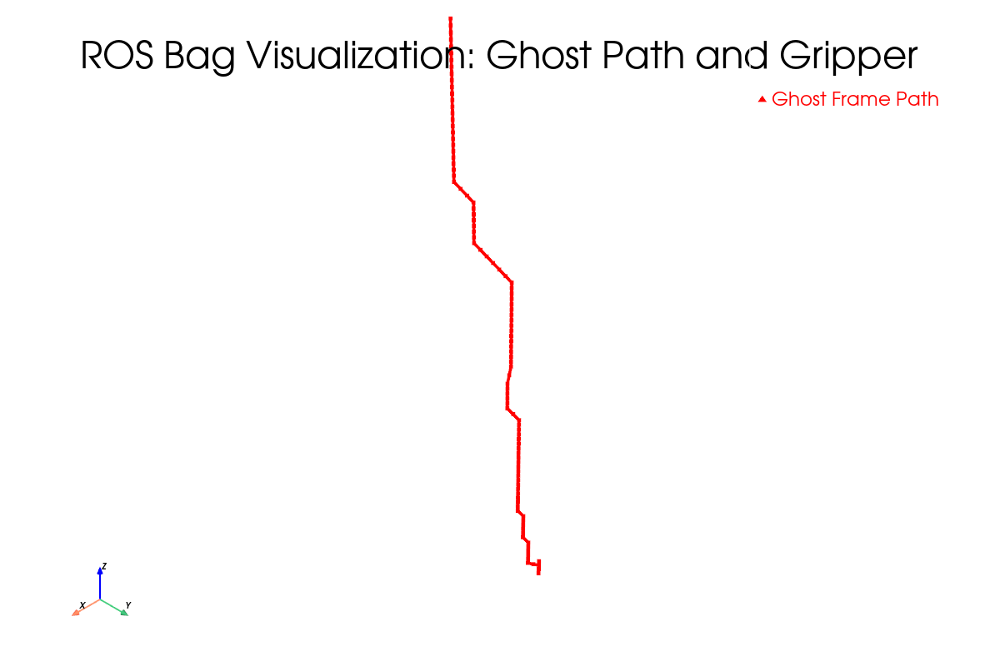


--- Plot window closed. Cell 2 finished. ---


In [17]:
# === Cell 2: Process Pre-loaded Data and Visualize ===

# --- Imports needed specifically for this cell's logic ---
import pyvista as pv
try:
    pv.set_jupyter_backend('static')
except Exception:
    pass
from stl import mesh as stl_mesh  # Requires numpy-stl
from math import pi
import numpy as np  # Ensure numpy is available
import os  # Needed for setting environment variable

# --- Parameters (User Configuration) ---
# --- REQUIRED: Path to the SOURCE directory containing the 'kmr_description' package ---
package_base_path = (REPO_ROOT / 'src').resolve()  # <-- automatically derived
package_base_path = (REPO_ROOT / 'src').resolve()  # <-- automatically derived

# --- Topics and Frames (Verify these match your data and goals) ---
tf_topic = "/tf"
tf_static_topic = "/tf_static"
map_frame = "map"
base_link_frame = "base_link"      # Target frame for transforms
odom_frame = "odom"                # Intermediate frame for map->odom->base_link
ghost_frame = "ghost_gripper"      # Frame name for the gripper/ghost visualization

##############################################################################
# 1) Utility: Convert PointCloud2 => array (Unused in this version)
##############################################################################
def pointcloud2_to_xyz_array(pc_msg):
    """Convert a PointCloud2 (with float32 x,y,z) into a list of (x,y,z)."""
    if len(pc_msg.fields) < 3:
        print("[WARN] This PointCloud2 has fewer than 3 fields => no x,y,z parse.")
        return []
    field_map = {f.name: f for f in pc_msg.fields}
    for required in ["x", "y", "z"]:
        if required not in field_map:
            print(f"[WARN] Missing {required} in fields => no parse.")
            return []

    x_off = field_map["x"].offset
    y_off = field_map["y"].offset
    z_off = field_map["z"].offset
    step = pc_msg.point_step
    buff = pc_msg.data

    n_points = len(buff) // step
    points = []
    for i in range(n_points):
        idx = i * step
        x_val = struct.unpack_from('f', buff, idx + x_off)[0]
        y_val = struct.unpack_from('f', buff, idx + y_off)[0]
        z_val = struct.unpack_from('f', buff, idx + z_off)[0]
        points.append((x_val, y_val, z_val))
    return points

##############################################################################
# 2) Quaternions => 4x4 matrix, transform, etc.
##############################################################################
def quaternion_to_matrix(w, x, y, z):
    """Return 4x4 homogeneous rotation matrix from quaternion (w,x,y,z)."""
    n = (w*w + x*x + y*y + z*z) ** 0.5
    if n < 1e-12:
        return np.eye(4, dtype=np.float64)
    w /= n; x /= n; y /= n; z /= n
    xx, yy, zz = x*x, y*y, z*z
    xy, xz, yz = x*y, x*z, y*z
    wx, wy, wz = w*x, w*y, w*z

    mat = np.eye(4, dtype=np.float64)
    mat[0, 0] = 1 - 2*(yy + zz)
    mat[0, 1] = 2*(xy - wz)
    mat[0, 2] = 2*(xz + wy)
    mat[1, 0] = 2*(xy + wz)
    mat[1, 1] = 1 - 2*(xx + zz)
    mat[1, 2] = 2*(yz - wx)
    mat[2, 0] = 2*(xz - wy)
    mat[2, 1] = 2*(yz + wx)
    mat[2, 2] = 1 - 2*(xx + yy)
    return mat

def transform_point(pt, T):
    """Apply 4x4 matrix T to (x,y,z)."""
    x, y, z = pt
    v4 = np.array([x, y, z, 1.0], dtype=np.float64)
    res = T @ v4
    return (res[0], res[1], res[2])

##############################################################################
# 3) BFS chain approach for ghost submeshes
##############################################################################
def build_matrix(x, y, z, roll, pitch, yaw):
    """
    Build a 4x4 homogeneous transform from translation + roll/pitch/yaw,
    using tf_transformations.
    """
    M = np.eye(4, dtype=np.float64)
    from tf_transformations import quaternion_from_euler, quaternion_matrix
    q = quaternion_from_euler(roll, pitch, yaw)  # [x, y, z, w]
    R = quaternion_matrix(q)
    M[0:3, 0:3] = R[0:3, 0:3]
    M[0, 3] = x
    M[1, 3] = y
    M[2, 3] = z
    return M

def compute_link_poses(link_data):
    """
    BFS approach: each link_data entry = {
      'parent': some_link,
      'joint_xyz': (dx,dy,dz),
      'joint_rpy': (rr,pp,yy),
      'mesh': 'package://...'
    }
    => returns a dict: link_name => 4x4 transform from ghost_base => link.
    """
    transforms = {'ghost_base': np.eye(4, dtype=np.float64)}
    pending = set(link_data.keys())

    while pending:
        found_something = False
        for link_name in list(pending):
            parent = link_data[link_name].get('parent', None)
            if parent is None:
                if link_name not in transforms:
                    transforms[link_name] = np.eye(4, dtype=np.float64)
                pending.remove(link_name)
                found_something = True
            elif parent in transforms:
                dx, dy, dz = link_data[link_name]['joint_xyz']
                rr, pp, yy = link_data[link_name]['joint_rpy']
                parent_tf = transforms[parent]
                child_rel = build_matrix(dx, dy, dz, rr, pp, yy)
                child_abs = parent_tf @ child_rel
                transforms[link_name] = child_abs
                pending.remove(link_name)
                found_something = True
        if not found_something:
            break
    return transforms

def parse_package_uri(package_uri: str):
    """
    Convert 'package://kmr_description/meshes/gripper/foo.STL' => local filesystem path.
    Adjust prefix if needed. Using env var PACKAGE_KMR_DESCRIPTION for user-specific path.
    """
    if not package_uri.startswith("package://"):
        return ""
    no_prefix = package_uri[len("package://"):]
    parts = no_prefix.split('/', 1)
    if len(parts) < 2:
        return ""
    package_name = parts[0]
    relative_path = parts[1]

    local_prefix = os.environ.get("PACKAGE_KMR_DESCRIPTION", str(package_base_path))
    if package_name == "kmr_description":
        return os.path.join(local_prefix, "kmr_description", relative_path)
    else:
        return os.path.join(local_prefix, package_name, relative_path)

##############################################################################
# 4) Building map->base_link chain logic
##############################################################################
def compose_transforms(T1, T2):
    """If T1 is e.g. map->odom, T2 is odom->base_link => map->base_link is T1@T2."""
    return T1 @ T2

def try_build_map_base_link(transforms_dict, map_frame, odom_frame, base_link_frame):
    """
    Look for either (map->base_link) directly or (map->odom) + (odom->base_link).
    Return T_map_base (4x4) if found, else None.
    """
    direct_key = (map_frame, base_link_frame)
    if direct_key in transforms_dict:
        print(f"Found direct transform for {map_frame} -> {base_link_frame}")
        return transforms_dict[direct_key]

    mo_key = (map_frame, odom_frame)
    ob_key = (odom_frame, base_link_frame)
    if mo_key in transforms_dict and ob_key in transforms_dict:
        print(f"Found chain {map_frame} -> {odom_frame}, {odom_frame} -> {base_link_frame}")
        T_map_odom = transforms_dict[mo_key]
        T_odom_base = transforms_dict[ob_key]
        return compose_transforms(T_map_odom, T_odom_base)
    return None

# --- Check if all_data exists (it should if Cell 1 ran) ---
if 'all_data' not in locals():
    raise NameError("Variable 'all_data' not found. Please ensure Cell 1 has been executed successfully.")
if not all_data:
    print("[ERROR] 'all_data' dictionary is empty or None. Cannot proceed. Check Cell 1 output.")
    raise ValueError("'all_data' is empty or None.")

print("--- Starting Processing using pre-loaded 'all_data' ---")

# --- Process Transforms Data ---
print("--- Processing TF Data from all_data ---")
transforms_dict = {}  # Stores latest (parent, child) -> 4x4 matrix
ghost_poses = []      # Stores (t_s, x, y, z) of ghost_frame relative to map_frame

if tf_topic in all_data:
    print(f"[INFO] Processing {len(all_data[tf_topic])} dynamic TF messages...")
    tf_msgs_sorted = sorted(all_data[tf_topic], key=lambda x: x[0])
    processed_count = 0
    for t_s, tf_msg in tf_msgs_sorted:
        for tr in tf_msg.transforms:
            p = tr.header.frame_id
            c = tr.child_frame_id
            tx = tr.transform.translation.x
            ty = tr.transform.translation.y
            tz = tr.transform.translation.z
            rx = tr.transform.rotation.x
            ry = tr.transform.rotation.y
            rz = tr.transform.rotation.z
            rw = tr.transform.rotation.w
            
            # Calculate T_parent_child transform
            T_p_c = build_matrix(tx, ty, tz, 0, 0, 0)
            R_p_c = quaternion_to_matrix(rw, rx, ry, rz)
            T_p_c[:3, :3] = R_p_c[:3, :3]
            
            transforms_dict[(p, c)] = T_p_c
            processed_count += 1

            if p == map_frame and c == ghost_frame:
                ghost_x, ghost_y, ghost_z = T_p_c[0, 3], T_p_c[1, 3], T_p_c[2, 3]
                ghost_poses.append((t_s, ghost_x, ghost_y, ghost_z))
                
    print(f"[INFO] Processed {processed_count} individual transforms from dynamic TF.")
    if ghost_poses:
         print(f"[INFO] Recorded {len(ghost_poses)} poses for '{ghost_frame}' relative to '{map_frame}'.")
    else:
         print(f"[WARN] No poses recorded for '{ghost_frame}' relative to '{map_frame}'.")
else:
    print(f"[WARN] Dynamic TF topic '{tf_topic}' not found in all_data.")

ghost_poses.sort(key=lambda x: x[0])

# --- Compute Final Ghost Transformation ---
print("\n--- Calculating Final Ghost Transformation ---")
T_map_ghost_final = np.identity(4)
final_map_ghost_key = (map_frame, ghost_frame)
if final_map_ghost_key in transforms_dict:
    T_map_ghost_final = transforms_dict[final_map_ghost_key]
    print(f"[INFO] Using latest transform {map_frame} -> {ghost_frame} for ghost mesh.")
else:
    print(f"[WARN] Could not find final transform {map_frame} -> {ghost_frame}. Ghost mesh at origin.")

# --- Define Robot Link Structure (Gripper) ---
print("\n--- Defining Gripper Link Structure ---")
link_data = {
    'ghost_base': {'parent': None, 'joint_xyz': (0.0, 0.0, 0.0), 'joint_rpy': (0.0, 0.0, 0.0), 'mesh': None},
    'gripper_base_link': {'parent': 'ghost_base', 'joint_xyz': (0.0, 0.0, 0.0), 'joint_rpy': (0.0, 0.0, 0.0),
                           'mesh': "package://kmr_description/meshes/gripper/robotiq_85_base_link_fine.STL"},
    'gripper_left_outer_knuckle': {'parent': 'gripper_base_link', 'joint_rpy': (0.0, 0.0, 0.0),
                                   'joint_xyz': (0.0306011444260539, 0.0, 0.0627920162695395),
                                   'mesh': "package://kmr_description/meshes/gripper/outer_knuckle_fine.STL"},
    'gripper_left_outer_finger': {'parent': 'gripper_left_outer_knuckle', 'joint_rpy': (0.0, 0.0, 0.0),
                                  'joint_xyz': (0.0316910442266543, 0.0, -0.00193396375724605),
                                  'mesh': "package://kmr_description/meshes/gripper/outer_finger_fine.STL"},
    'gripper_left_inner_knuckle': {'parent': 'gripper_base_link', 'joint_rpy': (0.0, 0.0, 0.0),
                                   'joint_xyz': (0.0127000000001501, 0.0, 0.0693074999999639),
                                   'mesh': "package://kmr_description/meshes/gripper/inner_knuckle_fine.STL"},
    'gripper_left_inner_finger': {'parent': 'gripper_left_inner_knuckle', 'joint_rpy': (0.0, 0.0, 0.0),
                                  'joint_xyz': (0.034585310861294, 0.0, 0.0454970193817975),
                                  'mesh': "package://kmr_description/meshes/gripper/inner_finger_fine.STL"},
    'gripper_right_inner_knuckle': {'parent': 'gripper_base_link', 'joint_rpy': (0.0, 0.0, pi),
                                    'joint_xyz': (-0.0126999999998499, 0.0, 0.0693075000000361),
                                    'mesh': "package://kmr_description/meshes/gripper/inner_knuckle_fine.STL"},
    'gripper_right_inner_finger': {'parent': 'gripper_right_inner_knuckle', 'joint_rpy': (0.0, 0.0, 0.0),
                                   'joint_xyz': (0.0341060475457406, 0.0, 0.0458573878541688),
                                   'mesh': "package://kmr_description/meshes/gripper/inner_finger_fine.STL"},
    'gripper_right_outer_knuckle': {'parent': 'gripper_base_link', 'joint_rpy': (0.0, 0.0, pi),
                                    'joint_xyz': (-0.0306011444258893, 0.0, 0.0627920162695395),
                                    'mesh': "package://kmr_description/meshes/gripper/outer_knuckle_fine.STL"},
    'gripper_right_outer_finger': {'parent': 'gripper_right_outer_knuckle', 'joint_rpy': (0.0, 0.0, 0.0),
                                   'joint_xyz': (0.0317095909367246, 0.0, -0.0016013564954687),
                                   'mesh': "package://kmr_description/meshes/gripper/outer_finger_fine.STL"},
}

# --- Compute Gripper Link Poses Relative to ghost_base ---
print("\n--- Computing Relative Link Poses via BFS ---")
chain_transforms = compute_link_poses(link_data)
print(f"Computed relative transforms for {len(chain_transforms)} links.")

# --- Load and Transform Gripper Meshes ---
print("\n--- Loading and Transforming Gripper Meshes ---")
stl_meshes_final = []
for link_name, T_ghostbase_link in chain_transforms.items():
    if link_name == 'ghost_base':
        continue
    link_info = link_data.get(link_name)
    stl_uri = link_info.get('mesh')
    if not link_info or not stl_uri:
        continue
    local_stl_path = parse_package_uri(stl_uri)
    if not local_stl_path or not os.path.isfile(local_stl_path):
        print(f"[WARN] Mesh file NOT FOUND for link '{link_name}': {local_stl_path}")
        continue
    T_map_link_final = T_map_ghost_final @ T_ghostbase_link
    try:
        mesh_pv = pv.read(local_stl_path)
        mesh_pv.transform(T_map_link_final, inplace=True)
        stl_meshes_final.append(mesh_pv)
    except Exception as e:
        print(f"[ERROR] Failed load/transform STL '{local_stl_path}': {e}")
print(f"Loaded and transformed {len(stl_meshes_final)} gripper meshes.")

# --- Visualization with PyVista ---
print("\n--- Preparing Visualization ---")
plotter = pv.Plotter(notebook=True, window_size=[1200, 800])
plotter.background_color = 'white'
plotter.add_title("ROS Bag Visualization: Ghost Path and Gripper")
plotter.add_axes(interactive=True)

# Plot Ghost Path
if len(ghost_poses) > 1:
    coords = np.array([[gx, gy, gz] for (_, gx, gy, gz) in ghost_poses])
    lines = np.hstack([[2, i, i + 1] for i in range(len(coords) - 1)]).astype(int)
    if lines.size > 0:
        ghost_path_poly = pv.PolyData(coords)
        ghost_path_poly.lines = lines
        plotter.add_mesh(ghost_path_poly, color="red", line_width=4, label="Ghost Frame Path")
        print("[PLOT] Added Ghost Path.")
elif len(ghost_poses) == 1:
    coord = np.array([[ghost_poses[0][1], ghost_poses[0][2], ghost_poses[0][3]]])
    plotter.add_points(coord, color="blue", point_size=5.0 * 2.5, render_points_as_spheres=True, label="Ghost Final Pose")
    print("[PLOT] Added single Ghost Pose.")

# Plot Gripper Meshes
if stl_meshes_final:
    gripper_color = "silver"
    for i, subm in enumerate(stl_meshes_final):
        label = "Gripper Mesh" if i == 0 else None
        plotter.add_mesh(subm, color=gripper_color, opacity=0.9, show_edges=False, label=label)
    print(f"[PLOT] Added {len(stl_meshes_final)} Gripper Meshes.")

plotter.add_legend(bcolor=None, border=True)
print("\n--- Displaying PyVista Plot ---")
plotter.show()
print("\n--- Plot window closed. Cell 2 finished. ---")


[WARN] No gripper/end effector meshes found.


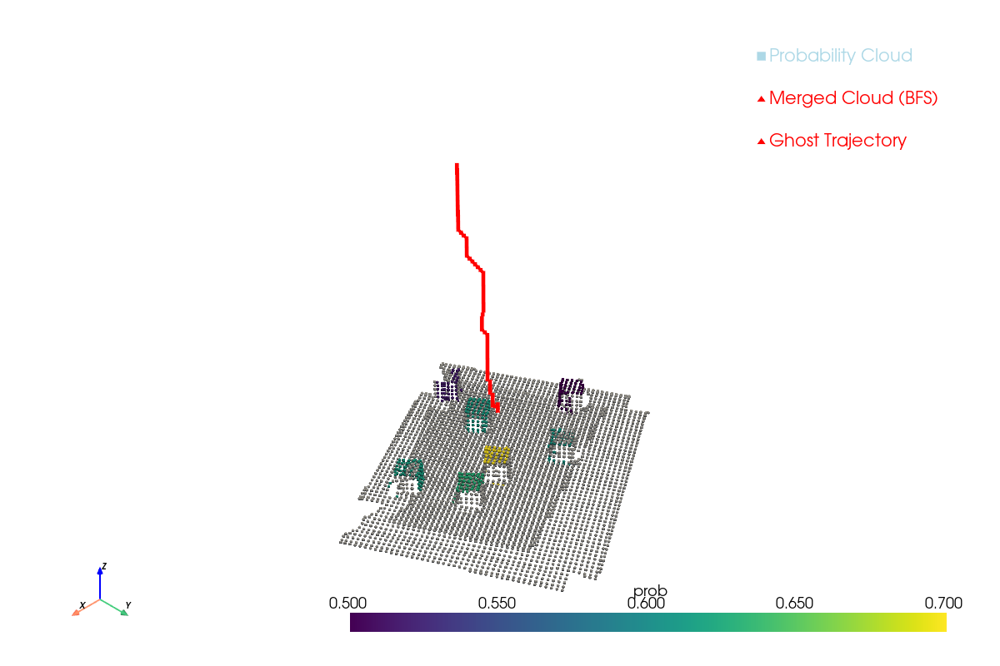

In [18]:
#!/usr/bin/env python3
import pyvista as pv
import numpy as np

def visualize_all(final_map, final_probs, fixed_merged_cloud, ghost_poses, stl_meshes_final):
    """
    Unified visualization:
      - final_map: Nx3 array (probability cloud)
      - final_probs: probability scalar for each point in final_map
      - fixed_merged_cloud: Nx3 array (BFS processed merged cloud)
      - ghost_poses: list of tuples (t_s, x, y, z) for ghost trajectory
      - stl_meshes_final: list of PyVista meshes (gripper/end effector)
    """
    plotter = pv.Plotter(notebook=True, window_size=[1200, 800])
    
    # 1. Probability Cloud (Overlay)
    if final_map.size > 0:
        p_prob = pv.PolyData(final_map)
        p_prob["prob"] = final_probs
        plotter.add_points(p_prob, scalars="prob", render_points_as_spheres=True,
                           point_size=4, label="Probability Cloud")
    else:
        print("[WARN] final_map (probability cloud) is empty.")
    
    # 2. Merged Cloud (BFS processed)
    if fixed_merged_cloud.size > 0:
        p_bfs = pv.PolyData(fixed_merged_cloud)
        plotter.add_points(p_bfs, color="red", render_points_as_spheres=True,
                           point_size=3, label="Merged Cloud (BFS)")
    else:
        print("[WARN] fixed_merged_cloud is empty.")
    
    # 3. Ghost Trajectory (Trajectory of the ghost frame)
    if len(ghost_poses) > 1:
        # Extract (x,y,z) coordinates from ghost poses
        coords = np.array([[x, y, z] for (_, x, y, z) in ghost_poses])
        # Create line connectivity between consecutive points
        lines = np.hstack([[2, i, i+1] for i in range(len(coords)-1)]).astype(np.int64)
        ghost_path = pv.PolyData(coords)
        ghost_path.lines = lines
        plotter.add_mesh(ghost_path, color="red", line_width=4, label="Ghost Trajectory")
    elif len(ghost_poses) == 1:
        coord = np.array([[ghost_poses[0][1], ghost_poses[0][2], ghost_poses[0][3]]])
        plotter.add_points(coord, color="blue", render_points_as_spheres=True,
                           point_size=10, label="Ghost Pose")
    else:
        print("[WARN] No ghost poses available.")
    
    # 4. End Effector (Gripper) Meshes
    if stl_meshes_final:
        for idx, mesh in enumerate(stl_meshes_final):
            label = "End Effector" if idx == 0 else None
            plotter.add_mesh(mesh, color="silver", opacity=0.9, show_edges=False, label=label)
    else:
        print("[WARN] No gripper/end effector meshes found.")
    
    plotter.add_legend(bcolor="white", border=True)
    plotter.show_axes()
    plotter.show()

if __name__ == "__main__":
    
    try:
        ghost_poses  # List of (t_s, x, y, z) from ghost frame TF processing
    except NameError:
        print("Variable 'ghost_poses' not defined.")
        ghost_poses = []
    
    try:
        stl_meshes_final  # List of gripper/end effector meshes
    except NameError:
        print("Variable 'stl_meshes_final' not defined.")
        stl_meshes_final = []
    
    # Ensure arrays are numpy arrays if needed.
    
    visualize_all(merged_cloud_geom, merged_cloud_probs, merged_cloud_geom, ghost_poses, stl_meshes_final)


# Other variables

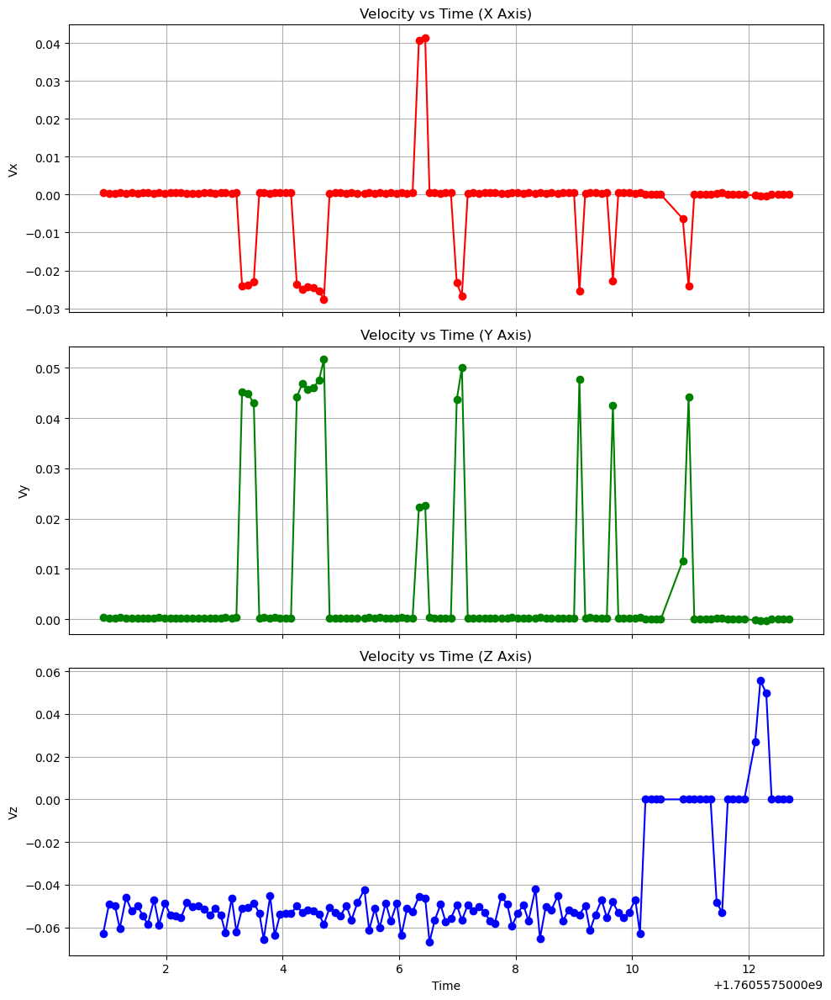

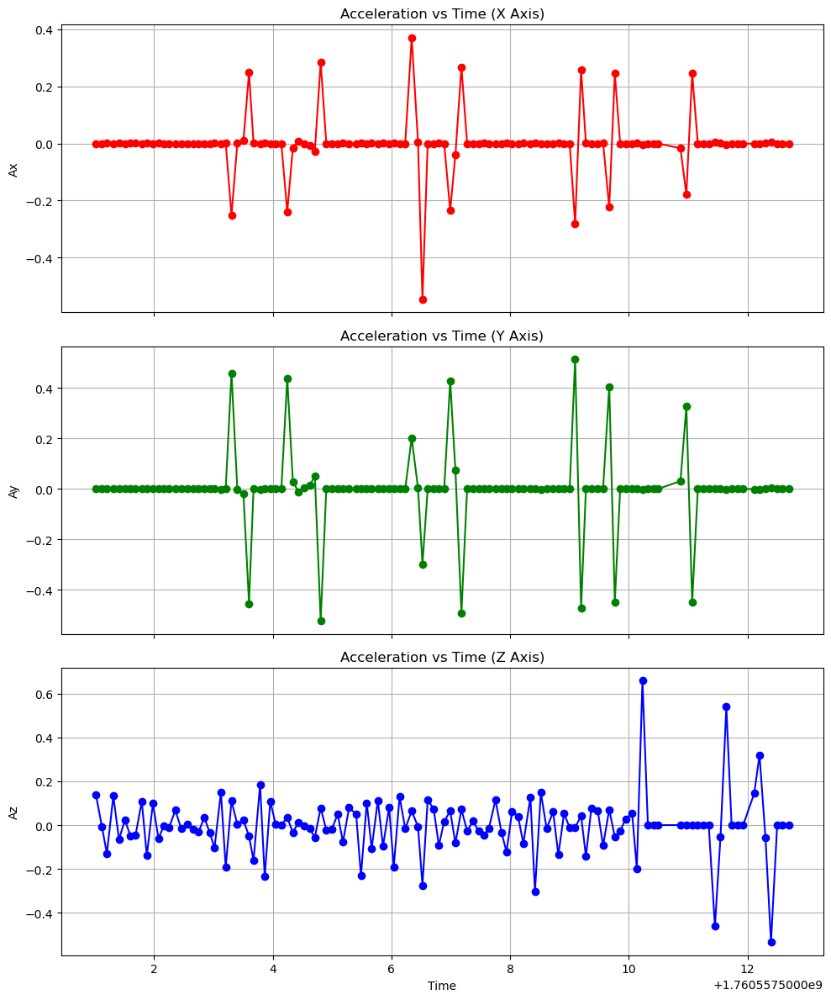

In [19]:
import matplotlib.pyplot as plt
import numpy as np

def compute_velocities(poses):
    """
    Compute velocities from ghost poses.
    Each pose is assumed to be a tuple (t, x, y, z).
    Velocity is computed between consecutive poses.
    Returns a list of tuples (t, vx, vy, vz) where t is the timestamp of the second pose.
    """
    velocities = []
    for i in range(1, len(poses)):
        t1, x1, y1, z1 = poses[i-1]
        t2, x2, y2, z2 = poses[i]
        dt = t2 - t1
        if dt == 0:
            vx, vy, vz = 0.0, 0.0, 0.0
        else:
            vx = (x2 - x1) / dt
            vy = (y2 - y1) / dt
            vz = (z2 - z1) / dt
        velocities.append((t2, vx, vy, vz))
    return velocities

def compute_accelerations(vels):
    """
    Compute accelerations from a list of velocities.
    Each velocity is a tuple (t, vx, vy, vz).
    Returns a list of tuples (t, ax, ay, az) where t is the timestamp of the second velocity.
    """
    accelerations = []
    for i in range(1, len(vels)):
        t1, vx1, vy1, vz1 = vels[i-1]
        t2, vx2, vy2, vz2 = vels[i]
        dt = t2 - t1
        if dt == 0:
            ax, ay, az = 0.0, 0.0, 0.0
        else:
            ax = (vx2 - vx1) / dt
            ay = (vy2 - vy1) / dt
            az = (vz2 - vz1) / dt
        accelerations.append((t2, ax, ay, az))
    return accelerations

# Assume ghost_poses is already defined globally.
# For example:
# ghost_poses = [
#    (1742505170.2360647, -4.49285, -7.17490, 1.28935),
#    (1742505170.2863219, -4.49288, -7.17489, 1.28435),
#    ... (more poses) ...
# ]

# Compute velocities and accelerations from ghost_poses.
velocities = compute_velocities(ghost_poses)
accelerations = compute_accelerations(velocities)

# Extract time and components for velocities.
t_vel = np.array([v[0] for v in velocities])
vx = np.array([v[1] for v in velocities])
vy = np.array([v[2] for v in velocities])
vz = np.array([v[3] for v in velocities])

# Extract time and components for accelerations.
t_acc = np.array([a[0] for a in accelerations])
ax = np.array([a[1] for a in accelerations])
ay = np.array([a[2] for a in accelerations])
az = np.array([a[3] for a in accelerations])

# Create separate 2D plots for velocity components.
fig_vel, axs_vel = plt.subplots(3, 1, figsize=(10, 12), sharex=True)
axs_vel[0].plot(t_vel, vx, marker='o', linestyle='-', color='r')
axs_vel[0].set_ylabel('Vx')
axs_vel[0].set_title('Velocity vs Time (X Axis)')
axs_vel[0].grid(True)

axs_vel[1].plot(t_vel, vy, marker='o', linestyle='-', color='g')
axs_vel[1].set_ylabel('Vy')
axs_vel[1].set_title('Velocity vs Time (Y Axis)')
axs_vel[1].grid(True)

axs_vel[2].plot(t_vel, vz, marker='o', linestyle='-', color='b')
axs_vel[2].set_ylabel('Vz')
axs_vel[2].set_title('Velocity vs Time (Z Axis)')
axs_vel[2].set_xlabel('Time')
axs_vel[2].grid(True)

fig_vel.tight_layout()
plt.show()

# Create separate 2D plots for acceleration components.
fig_acc, axs_acc = plt.subplots(3, 1, figsize=(10, 12), sharex=True)
axs_acc[0].plot(t_acc, ax, marker='o', linestyle='-', color='r')
axs_acc[0].set_ylabel('Ax')
axs_acc[0].set_title('Acceleration vs Time (X Axis)')
axs_acc[0].grid(True)

axs_acc[1].plot(t_acc, ay, marker='o', linestyle='-', color='g')
axs_acc[1].set_ylabel('Ay')
axs_acc[1].set_title('Acceleration vs Time (Y Axis)')
axs_acc[1].grid(True)

axs_acc[2].plot(t_acc, az, marker='o', linestyle='-', color='b')
axs_acc[2].set_ylabel('Az')
axs_acc[2].set_title('Acceleration vs Time (Z Axis)')
axs_acc[2].set_xlabel('Time')
axs_acc[2].grid(True)

fig_acc.tight_layout()
plt.show()


# Evolving Probability Trajectory

[INFO] HDBSCAN 4-D → 7 clusters
[INFO] Saved goals → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_goals.txt
[INFO] Saved correct list → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_correct.txt
[INFO] Saved probability log → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_.txt
[INFO] Saved variables log   → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_variables.txt


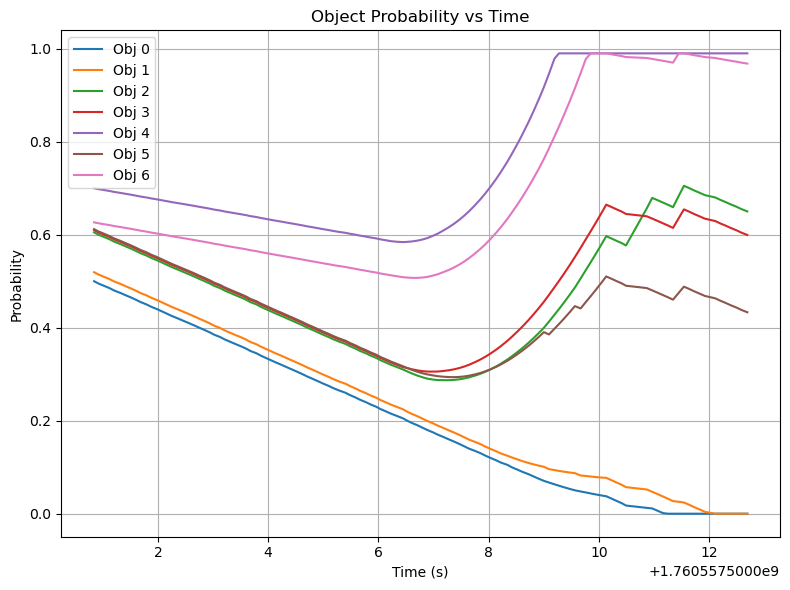

[INFO] Saved probability vs time plot → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_prob_vs_time.png


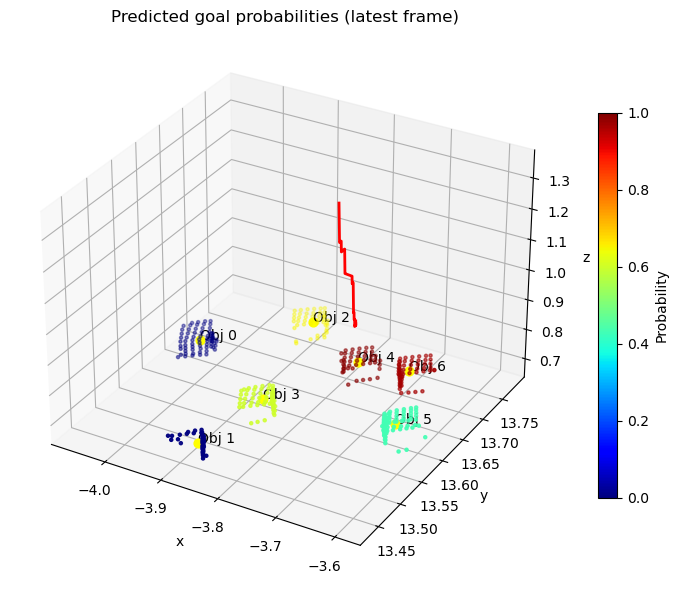

[INFO] Saved static 3-D snapshot → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_probabilities.png


Widget(value='<iframe src="http://localhost:38973/index.html?ui=P_0x7d7da87625f0_8&reconnect=auto" class="pyvi…

[INFO] 3-D animation → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_probabilities.mp4


[INFO] 2-D animation → /home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_prob_vs_time.mp4


In [20]:
# JUPYTER CELL ───────────────────────────────────────────────────────────────
# Full pipeline + STATIC-camera animations
#   – Algorithm unchanged: 4-D HDBSCAN + advanced probability update
#   – Only objects that start < 0.05 get reduced growth & 0.3 clamp
#   – 3-D video: static camera, cloud recolours, trajectory grows each frame
#   – 2-D video: probability-vs-time chart
# ────────────────────────────────────────────────────────────────────────────

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as mpla
import pyvista as pv
from pathlib import Path
import hdbscan
import shutil
from IPython.display import Video, display

# ────────────────────────────────────────────────────────────────────────────
# 0. Movie-writer helper (mp4 if ffmpeg present, else gif)
# ────────────────────────────────────────────────────────────────────────────
def choose_writer(fps=30):
    if shutil.which("ffmpeg"):
        from matplotlib.animation import FFMpegWriter
        return FFMpegWriter(fps=fps), "mp4"
    print("[WARN] FFmpeg not found – falling back to GIF")
    from matplotlib.animation import PillowWriter
    return PillowWriter(fps=fps), "gif"

# ────────────────────────────────────────────────────────────────────────────
# 1. Parameters & helpers  (algorithm exactly as spec)
# ────────────────────────────────────────────────────────────────────────────
MIN_PROB = 0.01
MIN_CLUSTER_SIZE = 15
MIN_SAMPLES = 10
PROB_SCALE = 2.0
ALPHA_GROWTH, ALPHA_DECAY = 0.08, 0.8
VEL_SCALE, ACC_SCALE = 0.1, 0.05
DIST_OFFSET, DT_DEFAULT = 0.1, 0.004
MAX_PROB_CUTOFF, MAX_PROB_FOR_LOW_START = 0.99, 0.3
REDUCED_GROWTH_FACTOR = 10.0
TOP_K = 2
GOAL_BIAS_STRONG, GOAL_BIAS_WEAK = 0.002, 0.005
GRIPPER_RADIUS, GRIPPER_HEIGHT = 0.085/3.0, 0.100
PRED_HORIZON = 0.3

def predict_eef(p, v, a, dt_h):
    """Forward kinematic prediction p + v·dt + 0.5 a·dt² (vectorised)."""
    return p + v*dt_h + 0.5*a*(dt_h**2)

def dist_to_cyl(p, e):
    dz = max(p[2]-e[2], 0, e[2]-GRIPPER_HEIGHT - p[2])
    dr = max(np.hypot(*(p[:2]-e[:2])) - GRIPPER_RADIUS, 0)
    return np.hypot(dz, dr)

def update_prob(old, d_now, d_prev, v_mag, a_mag, dt, goal_bias, low_start):
    approaching = (d_now - d_prev) < 0 or d_now < 0.005
    ag = ALPHA_GROWTH / REDUCED_GROWTH_FACTOR if low_start else ALPHA_GROWTH
    growth = ag/(d_now+DIST_OFFSET)*(1+VEL_SCALE*v_mag+ACC_SCALE*a_mag)
    if not approaching: growth *= 0.3
    decay = ALPHA_DECAY*(d_now+DIST_OFFSET)*(1+0.3*VEL_SCALE*v_mag+0.3*ACC_SCALE*a_mag)
    if not approaching: decay *= 1.5
    cand = max(old - goal_bias, old + dt*(growth-decay))
    cand = np.clip(cand, 0, MAX_PROB_CUTOFF)
    if low_start and cand > MAX_PROB_FOR_LOW_START: cand = MAX_PROB_FOR_LOW_START
    return cand



def write_step_log(log_file, elapsed, absolute_t, objects, top_label, tags):
    entries = []
    for obj in objects:
        entry = "[object {label}] {prob:.6f}".format(label=obj['label'], prob=obj['prob'])
        if obj['label'] == top_label:
            entry += " [TOP1]"
        entries.append(entry)
    tag_str = " " + " ".join("[{0}]".format(tag) for tag in tags) if tags else ""
    log_file.write("{:.6f}  {:.6f}  ".format(elapsed, absolute_t))
    log_file.write("  ".join(entries) + tag_str + "\n")


def compute_velocities(poses):
    velocities = []
    for i in range(1, len(poses)):
        t1, x1, y1, z1 = poses[i-1]
        t2, x2, y2, z2 = poses[i]
        dt = t2 - t1
        velocities.append((t2,
                           (x2 - x1)/dt if dt else 0.0,
                           (y2 - y1)/dt if dt else 0.0,
                           (z2 - z1)/dt if dt else 0.0))
    return velocities

# ────────────────────────────────────────────────────────────────────────────
# 2. 4-D HDBSCAN clustering
# ────────────────────────────────────────────────────────────────────────────
mask = (merged_cloud_probs >= MIN_PROB) & (~np.isnan(merged_cloud_probs))
pts3, probs = merged_cloud_geom[mask], merged_cloud_probs[mask]
pts4 = np.column_stack((pts3, probs*PROB_SCALE))

objects = []
if pts4.size:
    labels = hdbscan.HDBSCAN(min_cluster_size=MIN_CLUSTER_SIZE,
                             min_samples=MIN_SAMPLES).fit_predict(pts4)
    for lbl in np.unique(labels[labels >= 0]):
        idx = labels == lbl
        centroid = pts3[idx].mean(axis=0)
        p_mean = float(probs[idx].mean())
        objects.append(dict(label=int(lbl), centroid=centroid, prob=p_mean,
                            indices=np.where(mask)[0][idx],
                            dist_prev=None,
                            started_below_005=(p_mean < 0.05),
                            history=[]))
print(f"[INFO] HDBSCAN 4-D → {len(objects)} clusters")

base_prefix = Path(name)
base_dir = base_prefix.parent
base_stem = base_prefix.name

objects.sort(key=lambda o: o["label"])
for idx, obj in enumerate(objects):
    obj["label"] = idx

goals_path = base_dir / f"{base_stem}goals.txt"
with open(goals_path, "w") as fh:
    for obj in objects:
        c = obj["centroid"]
        fh.write(f"[object {obj['label']}][{c[0]:.4f},{c[1]:.4f},{c[2]:.4f}]\n")
print(f"[INFO] Saved goals → {goals_path}")

correct_path = base_dir / f"{base_stem}correct.txt"
with open(correct_path, "w") as fh:
    for obj in objects:
        fh.write(f"[object {obj['label']}]\n")
print(f"[INFO] Saved correct list → {correct_path}")

# ────────────────────────────────────────────────────────────────────────────
# 3. Probability evolution (records prob_series for animation)
# ────────────────────────────────────────────────────────────────────────────
path_pts = np.empty((0, 3))
prob_series = []

if not objects or not ghost_poses:
    print("[WARN] No objects or ghost_poses – skipping evolution.")
else:
    velocities = compute_velocities(ghost_poses)
    t_arr = np.array([p[0] for p in ghost_poses])
    x_gp, y_gp, z_gp = (np.array([p[k] for p in ghost_poses]) for k in (1, 2, 3))

    vx_gp = np.zeros_like(t_arr)
    vy_gp = np.zeros_like(t_arr)
    vz_gp = np.zeros_like(t_arr)
    if velocities:
        vx_gp[1:], vy_gp[1:], vz_gp[1:] = zip(*[(v[1], v[2], v[3]) for v in velocities])

    log_path = base_dir / f"{base_stem}.txt"
    var_path = base_dir / f"{base_stem}variables.txt"
    step_log = open(log_path, "w", encoding="utf-8")
    step_log.write("# elapsed_s  time_s  [object n] prob [TOP1] …  <tags>\n")
    var_log = open(var_path, "w")
    var_log.write("# time_s elapsed_s [x,y,z,vx,vy,vz,ax,ay,az]\n")

    t0 = t_arr[0]
    eef0 = np.array([x_gp[0], y_gp[0], z_gp[0]])
    for obj in objects:
        obj["dist_prev"] = dist_to_cyl(obj["centroid"], eef0)
        obj["history"].append((t0, obj["prob"]))

    top_prev = max(objects, key=lambda obj: obj["prob"])["label"]
    above60_flag = False
    above80_flag = False
    write_step_log(step_log, 0.0, t0, objects, top_prev, ["START"])

    for i in range(1, len(t_arr)):
        t = t_arr[i]
        dt = max(t_arr[i] - t_arr[i-1], DT_DEFAULT)
        vx, vy, vz = vx_gp[i], vy_gp[i], vz_gp[i]
        vel_mag = float(np.linalg.norm([vx, vy, vz]))
        ax = (vx_gp[i] - vx_gp[i-1]) / dt
        ay = (vy_gp[i] - vy_gp[i-1]) / dt
        az = (vz_gp[i] - vz_gp[i-1]) / dt
        acc_mag = float(np.linalg.norm([ax, ay, az]))

        eef = np.array([x_gp[i], y_gp[i], z_gp[i]])
        eef_future = predict_eef(eef, np.array([vx, vy, vz]), np.array([ax, ay, az]), PRED_HORIZON)

        future_dists = sorted(((obj["label"], dist_to_cyl(obj["centroid"], eef_future))
                               for obj in objects), key=lambda x: x[1])
        goal_set = {lab for lab, _ in future_dists[:TOP_K]}
        closest_label = min(objects, key=lambda obj: dist_to_cyl(obj["centroid"], eef))["label"]
        goal_set.add(closest_label)

        for obj in objects:
            d_now = dist_to_cyl(obj["centroid"], eef)
            obj["prob"] = update_prob(
                obj["prob"], d_now, obj["dist_prev"],
                vel_mag, acc_mag, dt,
                GOAL_BIAS_STRONG if obj["label"] in goal_set else GOAL_BIAS_WEAK,
                obj["started_below_005"])
            obj["dist_prev"] = d_now
            obj["history"].append((t, obj["prob"]))

        tags = []
        top_now = max(objects, key=lambda obj: obj["prob"])
        if top_now["label"] != top_prev:
            tags.append("SURPASSED")
            top_prev = top_now["label"]
            above60_flag = above80_flag = False

        if not above60_flag and top_now["prob"] >= 0.60:
            tags.append("above 60")
            above60_flag = True
        if not above80_flag and top_now["prob"] >= 0.80:
            tags.append("above 80")
            above80_flag = True
        if i == len(t_arr) - 1:
            tags.append("end")

        write_step_log(step_log, t - t0, t, objects, top_prev, tags)

        var_log.write(
            f"{t:.6f} {t - t0:.6f} "
            f"[{x_gp[i]:.6f},{y_gp[i]:.6f},{z_gp[i]:.6f},"
            f"{vx:.6f},{vy:.6f},{vz:.6f},{ax:.6f},{ay:.6f},{az:.6f}]\n"
        )

        frame = merged_cloud_probs.copy()
        for obj in objects:
            frame[obj["indices"]] = obj["prob"]
        prob_series.append(frame)

    step_log.close()
    var_log.close()
    print(f"[INFO] Saved probability log → {log_path}")
    print(f"[INFO] Saved variables log   → {var_path}")

    path_pts = np.column_stack((x_gp, y_gp, z_gp))
# ────────────────────────────────────────────────────────────────────────────
# 4. Static probability-vs-time plot + PNG snapshot
# ────────────────────────────────────────────────────────────────────────────
prob_vs_time_path = Path(f"{name}prob_vs_time.png")
if objects and ghost_poses:
    fig_prob, ax_prob = plt.subplots(figsize=(8,6))
    for o in objects:
        tt, pp = zip(*o["history"])
        ax_prob.plot(tt, pp, label=f"Obj {o['label']}")
    ax_prob.set_xlabel("Time (s)"); ax_prob.set_ylabel("Probability")
    ax_prob.set_title("Object Probability vs Time")
    ax_prob.legend(); ax_prob.grid(True)
    fig_prob.tight_layout()
    fig_prob.savefig(prob_vs_time_path, dpi=300)
    plt.show()
    plt.close(fig_prob)
    print(f"[INFO] Saved probability vs time plot → {prob_vs_time_path}")
else:
    print("[WARN] No objects/ghost poses → skipping probability plot")

# Prepare path points for later visualisations
if objects and ghost_poses:
    path_pts = np.column_stack((x_gp, y_gp, z_gp))

# ────────────────────────────────────────────────────────────────────────────
# 5. Static Matplotlib 3-D snapshot (saved PNG)
# ────────────────────────────────────────────────────────────────────────────
probabilities_png = Path(f"{name}probabilities.png")
if prob_series:
    latest_probs = prob_series[-1]
else:
    latest_probs = merged_cloud_probs
fig_static = plt.figure(figsize=(8,6))
ax_static = fig_static.add_subplot(111, projection='3d')
scatter = ax_static.scatter(merged_cloud_geom[:,0], merged_cloud_geom[:,1], merged_cloud_geom[:,2],
                            c=latest_probs, cmap='jet', s=5, vmin=0, vmax=1)
for o in objects:
    ax_static.scatter(*o['centroid'], color='yellow', s=40)
    ax_static.text(*o['centroid'], f"Obj {o['label']}", color='black')
if path_pts.size:
    ax_static.plot(path_pts[:,0], path_pts[:,1], path_pts[:,2], color='red', linewidth=2)
ax_static.set_xlabel('x'); ax_static.set_ylabel('y'); ax_static.set_zlabel('z')
ax_static.set_title('Predicted goal probabilities (latest frame)')
fig_static.colorbar(scatter, ax=ax_static, label='Probability', shrink=0.7)
fig_static.tight_layout()
fig_static.savefig(probabilities_png, dpi=300)
plt.show()
plt.close(fig_static)
print(f"[INFO] Saved static 3-D snapshot → {probabilities_png}")

# ────────────────────────────────────────────────────────────────────────────
# 6. 3-D animation (static camera, growing trajectory)
# ────────────────────────────────────────────────────────────────────────────
if prob_series:
    writer3d, ext3d = choose_writer()
    video3d = f"{name}probabilities.{ext3d}"

    pv.set_plot_theme("document")
    pl = pv.Plotter(off_screen=True, window_size=[1024,768])

    cloud = pv.PolyData(merged_cloud_geom)
    cloud["prob"] = prob_series[0]
    act_cloud = pl.add_points(cloud, scalars="prob", cmap="jet",
                              point_size=3, render_points_as_spheres=True,
                              clim=[0,1])

    path_pts = np.array([[gp[1], gp[2], gp[3]] for gp in ghost_poses])
    traj_poly = pv.PolyData(path_pts[:1])            # first point only
    traj_poly.lines = np.empty(0, dtype=np.int64)
    act_traj = pl.add_mesh(traj_poly, color="red", line_width=4)

    pl.add_scalar_bar(title="Probability", n_labels=6)
    pl.set_background("white"); pl.camera.zoom(2.0); pl.add_axes()
    pl.show(auto_close=False)

    if ext3d == "mp4":
        pl.open_movie(video3d, framerate=30)
    else:
        pl.open_gif(video3d)

    for i, probs in enumerate(prob_series):
        cloud["prob"] = probs
        act_cloud.mapper.scalar_range = (0,1)

        if i >= 1:                 # append new segment this frame
            new_cell = np.array([2, i-1, i], dtype=np.int64)
            traj_poly.lines = np.hstack([traj_poly.lines, new_cell]) \
                              if traj_poly.lines.size else new_cell
            traj_poly.points = path_pts[:i+1]

        pl.render(); pl.write_frame()
    pl.close()
    print(f"[INFO] 3-D animation → {video3d}")
    display(Video(video3d, embed=True, width=600) if ext3d == "mp4" else video3d)

# ────────────────────────────────────────────────────────────────────────────
# 6. 2-D probability-vs-time (matplotlib animation)
# ────────────────────────────────────────────────────────────────────────────
if prob_series:
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_xlim(t_arr[0], t_arr[-1])
    ax.set_ylim(0, 1)
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Probability")
    ax.set_title("Object Probability Evolution")
    ax.grid(True)
    lines2d = [ax.plot([], [], label=f"Obj {obj['label']}")[0] for obj in objects]
    ax.legend()

    def init_animation():
        for ln in lines2d:
            ln.set_data([], [])
        return lines2d

    def animate_frame(k):
        for ln, obj in zip(lines2d, objects):
            tt, pp = zip(*obj["history"][:k+1])
            ln.set_data(tt, pp)
        return lines2d

    ani = mpla.FuncAnimation(
        fig,
        animate_frame,
        frames=len(t_arr),
        init_func=init_animation,
        interval=1000/30,
        blit=True
    )

    writer2d, ext2d = choose_writer()
    video2d = f"{name}prob_vs_time.{ext2d}"
    ani.save(video2d, writer=writer2d)
    plt.close(fig)
    print(f"[INFO] 2-D animation → {video2d}")
    display(Video(video2d, embed=True, width=600) if ext2d == "mp4" else video2d)


# Generate txt of Results

In [21]:
"""Full pipeline with HDBSCAN-4D clustering, advanced probability updates,
and a TXT logger that follows user-specified rules
"""
# Full pipeline with HDBSCAN-4D clustering, advanced probability updates,
# and a TXT logger that follows user-specified rules
# ──────────────────────────────────────────────────────────────────────────────
#   • Every line:  elapsed_s   time_s   [object n] prob [TOP1] …   <tags>
#   • Line triggers
#        – first step                       → [START]
#        – TOP1 label changes               → [SURPASSED]  (threshold flags reset)
#        – ≥0.10 s since previous log
#        – first time current TOP1 ≥0.60    → [above 60]
#        – first time current TOP1 ≥0.80    → [above 80]
#        – last step                        → [end]
#   • No additional lower-bound clamp is introduced; the original
#     `np.clip(candidate, 0.0, MAX_PROB_CUTOFF)` behaviour is preserved.
# ──────────────────────────────────────────────────────────────────────────────

import numpy as np
import matplotlib.pyplot as plt
import pyvista as pv
from pathlib import Path
import hdbscan

###############################################################################
# --- 0)  Run-time I/O ---------------------------------------------------------
###############################################################################
# name      = "run01"                      # set externally if needed
log_path = Path(name).with_suffix(".txt") if not isinstance(name, Path) else name.with_suffix(".txt")
log_f = open(log_path, "w", encoding="utf-8")
log_f.write("# elapsed_s  time_s  [object n] prob [TOP1] …  <tags>\n")

###############################################################################
# --- 1)  Config & Utility Functions (numeric logic unchanged) ----------------
###############################################################################
MIN_PROB = 0.01          # only for filtering raw cloud points

MIN_CLUSTER_SIZE = 15
MIN_SAMPLES      = 10
PROB_SCALE       = 2.0

ALPHA_GROWTH = 0.08
ALPHA_DECAY  = 0.8
VEL_SCALE    = 0.1
ACC_SCALE    = 0.05
DIST_OFFSET  = 0.1
DT_DEFAULT   = 0.004
MAX_PROB_CUTOFF = 0.99

MAX_PROB_FOR_LOW_START = 0.3
REDUCED_GROWTH_FACTOR  = 10.0

TOP_K = 2
GOAL_BIAS_STRONG = 0.002
GOAL_BIAS_WEAK   = 0.005

GRIPPER_RADIUS = 0.085 / 3.0
GRIPPER_HEIGHT = 0.100
PRED_HORIZON   = 0.3

def predict_eef_position(p, v, a, dt_h):
    return p + v*dt_h + 0.5*a*dt_h**2

def distance_to_gripper_cylinder(p, e):
    z_min, z_max = e[2]-GRIPPER_HEIGHT, e[2]
    dz = max(p[2]-z_max, 0) if p[2] > z_max else max(z_min-p[2], 0)
    dr = max(np.hypot(*(p[:2]-e[:2])) - GRIPPER_RADIUS, 0)
    return np.hypot(dz, dr)

def update_probability(old, d_now, d_prev, v_mag, a_mag,
                       dt, goal_bias, low_start):
    approaching = (d_now - d_prev) < 0 or d_now < 0.005
    alpha_g = (ALPHA_GROWTH / REDUCED_GROWTH_FACTOR) if low_start else ALPHA_GROWTH

    growth = alpha_g / (d_now + DIST_OFFSET) * (1 + VEL_SCALE*v_mag + ACC_SCALE*a_mag)
    if not approaching:
        growth *= 0.3

    decay = ALPHA_DECAY * (d_now + DIST_OFFSET) * \
            (1 + 0.3*VEL_SCALE*v_mag + 0.3*ACC_SCALE*a_mag)
    if not approaching:
        decay *= 1.5

    raw = old + dt*(growth - decay)
    cand = max(raw, old - goal_bias)                  # no extra floor here
    cand = np.clip(cand, 0.0, MAX_PROB_CUTOFF)        # original clamp
    if low_start and cand > MAX_PROB_FOR_LOW_START:
        cand = MAX_PROB_FOR_LOW_START
    return cand

###############################################################################
# --- 2)  Build 4-D cloud, cluster with HDBSCAN -------------------------------
###############################################################################
mask   = (merged_cloud_probs >= MIN_PROB) & (~np.isnan(merged_cloud_probs))
pts3   = merged_cloud_geom[mask]
probs  = merged_cloud_probs[mask]
pts4   = np.column_stack((pts3, probs*PROB_SCALE))

objects = []
if len(pts4):
    lbls = hdbscan.HDBSCAN(min_cluster_size=MIN_CLUSTER_SIZE,
                           min_samples=MIN_SAMPLES,
                           metric='euclidean').fit_predict(pts4)
    for lbl in np.unique(lbls[lbls >= 0]):
        idx = lbls == lbl
        centroid = pts3[idx].mean(axis=0)
        p_mean   = float(probs[idx].mean())
        objects.append({
            "label": int(lbl),
            "centroid": centroid,
            "prob": p_mean,
            "indices": np.where(mask)[0][idx],
            "dist_prev": None,
            "started_below_005": p_mean < 0.05,
            "history": []
        })
print(f"[INFO] HDBSCAN in 4-D => {len(objects)} clusters")

###############################################################################
# --- 3)  Probability evolution & logging -------------------------------------
###############################################################################
if not objects or not ghost_poses:
    print("[WARN] No objects or ghost_poses")
else:
    t_arr = np.array([gp[0] for gp in ghost_poses])
    x_gp, y_gp, z_gp = (np.array([gp[k] for gp in ghost_poses]) for k in (1,2,3))
    if 'velocities' in globals() and len(velocities) == len(ghost_poses):
        vx_gp, vy_gp, vz_gp = (np.array([v[k] for v in velocities]) for k in (1,2,3))
    else:
        vx_gp = vy_gp = vz_gp = np.zeros_like(x_gp)

    # --- initialise
    t_start = t_arr[0]
    eef0 = np.array([x_gp[0], y_gp[0], z_gp[0]])
    for o in objects:
        o["dist_prev"] = distance_to_gripper_cylinder(o["centroid"], eef0)
        o["history"].append((t_start, o["prob"]))
    top_prev = max(objects, key=lambda o:o["prob"])["label"]
    above60_flag = above80_flag = False
    last_log_time = t_start

    def log_step(real_t, extra_tags):
        elapsed = real_t - t_start
        top_lbl = max(objects, key=lambda o:o["prob"])["label"]
        parts = [f"[object {o['label']}] {o['prob']:.6f}" +
                 (" [TOP1]" if o["label"] == top_lbl else "")
                 for o in objects]
        tag_str = "  " + " ".join(f"[{t}]" for t in extra_tags) if extra_tags else ""
        log_f.write(f"{elapsed:.6f}  {real_t:.6f}  " + "  ".join(parts) + tag_str + "\n")

    # first line
    log_step(t_start, ["START"])

    # --- iterate
    for i in range(1, len(t_arr)):
        t_prev, t_curr = t_arr[i-1], t_arr[i]
        dt = (t_curr - t_prev) if (t_curr - t_prev) > 1e-6 else DT_DEFAULT

        # kinematics
        vx, vy, vz = vx_gp[i], vy_gp[i], vz_gp[i]
        vel_mag = np.linalg.norm([vx, vy, vz])
        ax, ay, az = (vx_gp[i]-vx_gp[i-1])/dt, (vy_gp[i]-vy_gp[i-1])/dt, (vz_gp[i]-vz_gp[i-1])/dt
        acc_mag = np.linalg.norm([ax, ay, az])
        eef = np.array([x_gp[i], y_gp[i], z_gp[i]])
        eef_future = predict_eef_position(eef, np.array([vx,vy,vz]),
                                          np.array([ax,ay,az]), PRED_HORIZON)

        # goal-biased set
        d_pred = sorted(((o["label"],
                          distance_to_gripper_cylinder(o["centroid"], eef_future))
                         for o in objects), key=lambda x: x[1])
        goal_set = {lab for lab,_ in d_pred[:TOP_K]}
        closest_now = min(objects,
                          key=lambda o: distance_to_gripper_cylinder(o["centroid"], eef))
        goal_set.add(closest_now["label"])

        # update probabilities
        for o in objects:
            d_now = distance_to_gripper_cylinder(o["centroid"], eef)
            o["prob"] = update_probability(
                o["prob"], d_now, o["dist_prev"],
                vel_mag, acc_mag, dt,
                GOAL_BIAS_STRONG if o["label"] in goal_set else GOAL_BIAS_WEAK,
                o["started_below_005"])
            o["dist_prev"] = d_now
            o["history"].append((t_curr, o["prob"]))

        # tags / logging
        tags=[]
        top_now = max(objects, key=lambda o:o["prob"])["label"]

        if top_now != top_prev:
            tags.append("SURPASSED")
            top_prev = top_now
            above60_flag = above80_flag = False   # reset on new leader

        top_prob = max(objects, key=lambda o:o["prob"]).get("prob", 0.0)
        if not above60_flag and top_prob >= 0.60:
            tags.append("above 60");  above60_flag = True
        if not above80_flag and top_prob >= 0.80:
            tags.append("above 80");  above80_flag = True

        periodic = (t_curr - last_log_time) >= 0.10
        last_step = i == len(t_arr) - 1
        if last_step: tags.append("end")

        if tags or periodic:
            log_step(t_curr, tags)
            last_log_time = t_curr

###############################################################################
# --- 4)  Close log -----------------------------------------------------------
###############################################################################
log_f.close()
print(f"[INFO] Probabilities logged to '{log_path}'")

# (Optional) downstream visualisation / per-point update can remain unchanged.


[INFO] HDBSCAN in 4-D => 7 clusters
[INFO] Probabilities logged to '/home/cesar514/workspaces/isaac_ws/isaac_sim_testing/data/experiment_6_subtrial_1/guider_manipulation_notebook/experiment_6_subtrial_1_.txt'
